In [2976]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
%matplotlib inline
import seaborn as sns
import scipy
from sklearn.preprocessing import LabelEncoder
from statsmodels.stats.proportion import proportions_ztest, proportion_confint
from collections import defaultdict
from tqdm import tqdm

Statistical Simulations and Data Visualization: A Journey through Inferential Statistics.

## Introduction.

The goal of this project is to explore key concepts related to inferential statistics, including the Central Limit Theorem, bias in estimation, confidence intervals, and the methodology of hypothesis testing. The primary objective is to enhance understanding through the use of statistical simulations, data visualization techniques and educational explanations with accompanying examples.

After developing tools required to conduct the simulations, the project will begin by introducing concepts such as sampling distribution, standard error, and the CLT. It will then provide a description and example of hypothesis testing, followed by an examination of the sampling distributions of the mean and standard errors. The analysis will explore their properties using different sample sizes for three different variables.

Additionally, the project will investigate the accuracy of standard error estimates and the factors that affect their precision by analyzing the statistical properties of larger sequences of sampling distributions with increasing sample sizes. The project will conclude by introducing confidence intervals and analyzing how the actual coverage probability differs from the nominal coverage probability under different conditions.

Having a clear understanding of presented concepts is vital for individuals involved in data analysis or conducting research. The proper use of the tools discussed in this work can assist in drawing sound conclusions from data and making well-informed decisions based on evidence.

## Keywords:

Inferential Statistics, The Central Limit Theorem, Estimation, Bias, T-Test, Nonparametric Tests, Standard Error, Confidence Interval, Bessel's Correction, Sampling Distribution, Z-Test, Multiple Comparisons Problem, Simulations, Nominal and Empirical Coverage Probability, Inference for a Proportion, Hypothesis Testing, Null Hypothesis, Null Distribution, Degrees of Freedom, Significance Level, Type I and Type II Error, Critical Value, P-value, Effect Size, Statistical Power, Margin of Error, Cross Verification, Bootstrapping, Confidence Level. Outliers, Descriptive Statistics, Data Visualization.

## Table of contents.

1. Functions deveploped for subsequent analysis.

2. The data preparation.
    1. Importing the data.
    2. Examining the distribution of the compensation variable.
    3. Formatting the data.
    4. Defining variables used in the following analysis.
    5. Exploring data distributions using visualization and descriptive statistics.
        1. Visualization.
        2. Descriptive statistics.  
    $ \ $
    
3. The role of the Central Limit Theorem in hypothesis testing.
    1. The Central Limit Theorem.
    2. Introduction to Sampling Distributions and Their Significance in Inferential Statistics.  
    $ \ $
    
4. Hypothesis testing - an example.
    1. Cross verification of statistical test results through sampling distribution analysis.  
    $ \ $
    
5. Visualizing and Analyzing the Impact of Sample Sizes on Different Sampling Distributions.
    1. Sampling distributions of the sample mean.
        1. Sample size: 30. A boundary between small and large samples?
    2. Sampling distributions of the standard error estimates.  
    $ \ $
    
6. Multiple samling distributions analysis. Are sample mean and sample standard deviation unbiased estimators? A visualization.
    1. Sampling distributions of the mean.
    2. Sampling distributions of the Standard error.
        1. Evaluating the agreement between the expected standard errors and the empirical standard deviations in sampling distributions.
        2. Comparison of the theoretical values of standard errors to aggregates of SE values estimated based on sample data.  
    $ \ $
    
7. Confidence intervals.
    1. Confidence intervals in hypothesis testing.
        1. The effects of critical values on confidence intervals.
    2. The relationship between distribution shape and the empirical coverage probability of confidence intervals.
        1. Inference for a Proportion.
        2. Understanding confidence intervals - sample size of 10.
        3. Understanding confidence intervals - sample size of 30.
        4. Understanding confidence intervals - sample size of 200.

# Functions deveploped for subsequent analysis.

### A function for generating sampling distributions.

In [1555]:
def retrieve_sampling_distributions_of_sample_means_stds_and_SE(
    *distributions, sample_size, number_of_samples):
    """  
    Calculates the sample means, standard deviations and standard error estimates for a given sample size and number
    of samples and generates a series or a DataFrame with sampling distributions from one or more numerical distributions.
    The function records the sample size and number of samples used in the global sampling_parameters dictionary.
    
    Parameters:
    distributions: one or multiple Series/DataFrames column with numerical values
    sample_size: integer, the number of observations in each sample
    number_of_samples: integer, the number of sample means to calculate
    
    Returns:
    A tuple containing:
    1. A Series or DataFrame of the sampling distribution(s) of the sample means
    2. A Series or DataFrame of the sampling distribution(s) of the sample standard deviations
    3. A Series or DataFrame of the standard error estimates for each sample mean
    """
    
    sampling_distribution_of_sample_means = pd.DataFrame()
    sampling_distribution_of_sample_stds = pd.DataFrame()
    se_sample_estimates = pd.DataFrame()

    for distribution in distributions:
        if isinstance(distribution, pd.DataFrame):
            distribution = distribution.squeeze()
        distribution = distribution.dropna()
        sample_means = []
        sample_stds = []
        cols_names = [f'{distribution.name}_SampMeans', 
                      f'{distribution.name}_SampStds']

        for i in range(number_of_samples):
            sample = distribution.sample(n=sample_size, replace=True)
            sample_means.append(sample.mean())
            sample_stds.append(sample.std()) # calculated using Bessel's correction

        sample_means = pd.Series(sample_means).rename(f'{cols_names[0]}')
        sample_stds = pd.Series(sample_stds).rename(f'{cols_names[1]}')

        sampling_distribution_of_sample_means = pd.concat(
            [sampling_distribution_of_sample_means, sample_means], axis=1)
        sampling_distribution_of_sample_stds = pd.concat(
            [sampling_distribution_of_sample_stds, sample_stds], axis=1)

        se_estimate = sample_stds / np.sqrt(sample_size)
        se_estimate = se_estimate.rename(f'{distribution.name}_SEestim')
        se_sample_estimates = pd.concat([se_sample_estimates, se_estimate], axis=1)

    global sampling_parameters # Necessary in order to keep track of sampling parameters

    sampling_parameters['samp_size'].append(sample_size)
    sampling_parameters['num_of_samples'].append(number_of_samples)
    
    return sampling_distribution_of_sample_means, \
           sampling_distribution_of_sample_stds, \
           se_sample_estimates

### A function for calculating the standard error of the mean parameter.

In [1482]:
def true_standard_error_calculations(
    sample_size, *populations, as_range=False, range_start=1):
    """
    Calculates the standard error of the mean of one or multiple populations for a given sample size or a range of sample sizes.

    Parameters:
    sample_size (int): Sample size or upper limit of the range of observations to calculate standard error.
    *populations: One or multiple populations as series/DataFrame objects, for which standard error will be calculated.
    as_range (bool, optional): If True, calculates standard error for a range of sample sizes from `range_start` to `sample_size`, instead of just a single sample size. Default is False.
    range_start (int, optional): The starting value of the sample size range when `as_range` is True. Default is 1.

    Returns:
    pd.DataFrame: A DataFrame object that contains the standard error of each population for the specified sample size(s).
    """
    
    se_true = pd.DataFrame()
    for population in populations:
        population = pd.DataFrame(population)
        if (isinstance(sample_size, int) & as_range==True):
            for pop_name, distrib in population.iteritems():
                se_true_dict = {}
                se_true_dict[pop_name + '_SE'] = []
                '''se_true_dict.setdefault(
                    '{}_SE'.format(pop_name), [])'''

                for i in range(range_start, sample_size+1): 
                    se_true_dict[pop_name + '_SE'] \
                    .append(distrib.std(ddof=0)/np.sqrt(i)) # delta degree of freedom equals 0 for a population parameter.
                se_true_df = pd.DataFrame(se_true_dict)
                se_true_df.index += range_start
                se_true_df.index.name = 'n'
                se_true = pd.concat([se_true, se_true_df], axis=1)
        elif (isinstance(sample_size, int)):
            for pop_name, distrib in population.iteritems():
                se_true_dict = {}
                se_true_dict[pop_name + '_SE'] = []
                '''se_true_dict.setdefault(
                    '{}SE_n={}'.format(pop_name, sample_size), [])'''
                se_true_dict[pop_name + '_SE'] \
                .append(distrib.std(ddof=0)/np.sqrt(sample_size))
                se_true_df = pd.DataFrame(se_true_dict)
                se_true_df.index = ['n='+ str(sample_size)]
                se_true = pd.concat([se_true, se_true_df], axis=1)
                   
        else:
              print('Please provide correct input')

    return se_true

### A function for calculating and recording statistics of the sampling distributions of the mean.

In [1483]:
def calculate_mean_and_std_of_sampling_distributions(sampling_distribution_of_sample_means):
    """
    Calculates the mean sampling distributions of the sample means and the standard error of the mean 
    for a given sample (i.e the standard deviation of the sampling mean distribution). 
    The results are saved in two separate dictionaries, various_mean_sampling_distributions and sample_ses_dict.

    Parameters:
    sampling_distribution_of_sample_means: a Series or DataFrame containing the sampling distributions.

    Returns:
    None, results are saved in the dictionaries various_mean_sampling_distributions and sample_ses_dict.
    """
    
    global various_mean_sampling_distributions , sample_ses_dict
    
    mean_sampling_distribution_of_mean = []
    std_sampling_distribution_of_mean = []

    for dist_name, dist in sampling_distribution_of_sample_means.iteritems():
        mean_sampling_distribution_of_mean.append([f'{dist_name}_mean', dist.mean()]) 
        std_sampling_distribution_of_mean.append([f'{dist_name}_std', dist.std()])
        
    for dist, means in mean_sampling_distribution_of_mean:
        various_mean_sampling_distributions[dist].append(means)
    for dist, ses in std_sampling_distribution_of_mean:
        sample_ses_dict[dist].append(ses)

### A function for calculating and recording statistics of the sampling distributions of the standard errors estimates.

In [1484]:
def calculate_mean_and_std_of_sampling_SE_estimates(sample_SE_estimations):
    """
    Calculates the mean sampling distributions of SE estimate and the standard error of the SE estimate 
    (i.e standard deviation of the sampling SE estimate distribution). 
    The results are saved in two separate dictionaries, various_mean_sampling_SE_estimates and stds_of_sample_SE_estimates.

    Parameters:
    sample_SE_estimations: a Series or DataFrame containing the sampling distributions.

    Returns:
    None, results are saved in the dictionaries various_mean_sampling_SE_estimates and stds_of_sample_SE_estimates.
    """
    
    global various_mean_sampling_SE_estimates, stds_of_sample_SE_estimates

    
    mean_sampling_distribution_of_SE_estim = []
    std_sampling_distribution_of_SE_estim = []       
    
    for dist_name, dist in sample_SE_estimations.iteritems():
        mean_sampling_distribution_of_SE_estim.append([f'{dist_name}_mean', dist.mean()]) 
        std_sampling_distribution_of_SE_estim.append([f'{dist_name}_std', dist.std()])
        
    for dist, means in mean_sampling_distribution_of_SE_estim:
        various_mean_sampling_SE_estimates[dist].append(means)
    for dist, stds in std_sampling_distribution_of_SE_estim:
        stds_of_sample_SE_estimates[dist].append(stds)

### A function that retrieves information about the sampling parameters and the statistics calculated from the collections of sampling distributions of the mean.

In [1485]:
def get_sampling_distributions_statistics():
    """
    Creates a DataFrame that contains the standard deviations and means of different sample distributions. 
    The DataFrame also includes information about the number of samples, sample size, and other relevant sampling characteristics. 
    
    Returns a MultiIndex DataFrame that is indexed by the sampling characteristics.
    """
    
    sample_ses_df = pd.DataFrame(sample_ses_dict)
    sample_means_df = pd.DataFrame(various_mean_sampling_distributions)
    statistics = pd.concat([sample_means_df, sample_ses_df], axis=1)
    
    df_sampling_parameters = pd.DataFrame.from_dict(sampling_parameters)
    multiIndex =  pd.MultiIndex.from_frame(df_sampling_parameters)
    stats_indexed = pd.DataFrame(statistics).set_index(
        multiIndex)
        
    return stats_indexed

### A function that retrieves information about the sampling parameters and the statistics calculated from the collection of sampling distributions of the standard errors estimates.

In [1486]:
def get_sampling_distributions_statistics_for_SE():
    """
    Creates a DataFrame that contains the standard deviations and means of different sample distributions. 
    The DataFrame also includes information about the number of samples, sample size, and other relevant sampling characteristics. 
    
    Returns a MultiIndex DataFrame that is indexed by the sampling characteristics.
    """
    
    stds_of_sample_SE_estimates_df = pd.DataFrame(stds_of_sample_SE_estimates)
    SE_sample_means_df = pd.DataFrame(various_mean_sampling_SE_estimates)
    statistics = pd.concat([SE_sample_means_df, stds_of_sample_SE_estimates_df], axis=1)
    
    df_sampling_parameters = pd.DataFrame.from_dict(sampling_parameters)
    multiIndex =  pd.MultiIndex.from_frame(df_sampling_parameters)
    SE_stats_indexed = pd.DataFrame(statistics).set_index(
        multiIndex)
        
    return SE_stats_indexed

### A function deleting data from specified variables.

In [1487]:
def reset_sampling_distributions_statistics():
    """
    Clears the specified variables, so that the next call of the 'get_sampling_distributions_statistics'
    (of the mean or of the SE estimates) generates a DataFrame with new values only.
    """
    
    global various_mean_sampling_distributions , sample_ses_dict, sampling_parameters
    global various_mean_sampling_SE_estimates, stds_of_sample_SE_estimates
    global sampling_parameters
    sampling_parameters = { 'num_of_samples': [], 'samp_size': [] }
    
    various_mean_sampling_distributions  = defaultdict(list)
    sample_ses_dict = defaultdict(list)
    various_mean_sampling_SE_estimates = defaultdict(list)
    stds_of_sample_SE_estimates = defaultdict(list)
    df_sampling_parameters = pd.DataFrame()

### A function that generates multiple sampling distributions and calculates their statistics, allowing for customization of sample size, number of samples, and iteration behavior.

In [1581]:
def Generate_multiple_sampling_distributions_and_calculate_statistics(
    *distributions, iterations, start_sample_size, start_sample_num, 
    increment=False, step=1, sample_num_step=0, sample_size_step=0, calc_stats=True):
    
    """
    Generates multiple sampling distributions and calculates their statistics 
    using the retrieve_sampling_distributions_of_sample_means_stds_and_SE and calculate_mean_and_std_of_sampling_distributions functions. 
    The process is repeated 'iterations' times, with the possibility to increment the sample size and number at each iteration.

    Parameters:
    iterations (int): Number of iterations to generate and calculate statistics for.
    start_sample_size (int): Starting sample size for the first iteration.
    start_sample_num (int): Starting number of samples for the first iteration.
    *distributions (str): One or more distribution variables to be used for generating samples.
    increment (bool, optional): Whether to increment sample size and number every 'step' iteration. Defaults to False.
    step (int, optional): every 'step' sampling distribution created there'll be an increment in sample size and/or number. Only applicable if increment is True. Defaults to 1.
    sample_num_step (int, optional): Step size for incrementing the number of samples. Only applicable if increment is True. Defaults to 0.
    sample_size_step (int, optional): Step size for incrementing the sample size. Only applicable if increment is True. Defaults to 0.
    calc_stats: allows for calculations of statistics only for a specified type of the sampling distribution. If calc_stats = 'mean', 
                it calculates statistics for sampling distributions of the mean. If calc_stats = 'SE', it calculates statistics 
                for sampling distributions of the SE. Otherwise, it calculates statistics for both sampling distributions.          
    """
    
    pbar = tqdm(range(iterations), delay=2)
    mod_divident=1
    for i in pbar: 
        sample_means, sample_ses_estimates = retrieve_sampling_distributions_of_sample_means_stds_and_SE(
                *distributions, sample_size=start_sample_size, number_of_samples=start_sample_num)[0::2]
        
        if calc_stats == 'mean':
            calculate_mean_and_std_of_sampling_distributions(sample_means)
        elif calc_stats == 'SE':
            calculate_mean_and_std_of_sampling_SE_estimates(sample_ses_estimates)
        else:
            calculate_mean_and_std_of_sampling_distributions(sample_means)
            calculate_mean_and_std_of_sampling_SE_estimates(sample_ses_estimates)
        
        if increment == True:
            if mod_divident%step == 0:
                start_sample_size += sample_size_step
                start_sample_num += sample_num_step
            mod_divident+= 1
            

### A function for plotting the distributions.

In [2811]:
colors=['#8B4513', 'burlywood', '#FFA500', '#006400', '#ADFF2F', '#00FF7F']
plt.rcParams['figure.dpi'] = 300
plt.style.use('dark_background')

def plot(distributions, title=None, xlabel=None, ylabel=None, bins=200, histtype='bar', rwidth=None, figsize=(14, 4),
        colors=['#8B4513', 'burlywood', '#FFA500', 'firebrick'], density=False, subplots=False, nbins=None):
    """ 
    Generates histograms for the given sampling distributions.
    
    Parameters:
        distributions (pandas.DataFrame or list): The sampling distributions to plot.
        title (str, optional): The title of the plot. Default is an empty string.
        xlabel (str, optional): The label of the x-axis. Default is an empty string.
        bins (int, optional): The number of bins for the histogram. Default is 250.
        histtype (str, optional): The type of histogram to plot. Default is 'bar'.
        colors (list, optional): The list of colors to use for the histograms.
        subplots (bool, optional): Whether to create subplots for multiple distributions. Default is False.
        rwidth (float or None, optional): The relative width of the bars as a fraction of the bin width.
        nbins (integer): Number of xticks.
    """
    
    distributions.plot(kind='hist',
                  figsize=figsize, 
                  bins=bins,
                  color=colors,
                  fontsize=10,
                  histtype=histtype,
                  alpha=0.7,
                  subplots=subplots,
                  rwidth=rwidth,
                  density=density
                  )
    plt.title(title, size=12)
    plt.ylabel(ylabel, size=8.5)
    plt.xlabel(xlabel, size=8.5)
    plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(nbins=nbins, integer=True))
    plt.show()

#### A function for easy modification of display settings.

In [94]:
def display(max_row=100, min_row=100):
    """Simplifies row display setting change"""

    pd.set_option('display.max_rows' , max_row)
    pd.set_option("display.min_rows", min_row)

def displayr(a=None, b=None):
    """Resets the display settings. Parameters a and b have been included for compatibility with display 
    (adding 'r' to 'display' resets settings) """
    
    pd.reset_option('display.max_rows')
    pd.reset_option("display.min_rows")
    
pd.options.display.float_format = '{:.2f}'.format  # removes scientific notation

## The data preparation.

This project utilizes data from the annual Stack Overflow survey - <a href=https://survey.stackoverflow.co/2022/> 2022 Developer Survey <a/>.

### Importing the data. 

In [2]:
survey = pd.read_csv('survey_results_public.csv', index_col='ResponseId')

In [3]:
surv = survey[['ConvertedCompYearly', 'Country', ]].copy()
# Renaming selected columns:

surv = surv.rename(columns={'ConvertedCompYearly': 'compensation', 'Country': 'country'})

surv.head()

,compensation,country
ResponseId,,
1,NaN,NaN
2,NaN,Canada
3,40205.0,United Kingdom of Great Britain and Northern I...
4,215232.0,Israel
5,NaN,United States of America


### Examining the distribution of the `compensation` variable.

We will create two variables from the compensation variable for use in subsequent analysis. Below is a quick overview of the original distribution.

In [96]:
compensation = surv.compensation.copy()

In [3022]:
print('Descriptive statistics for the compensation variable:')
compensation.describe().to_frame()

Descriptive statistics for the compensation variable:


,compensation
count,38071.00
mean,170761.28
std,781413.24
min,1.00
25%,35832.00
50%,67845.00
75%,120000.00
max,50000000.00


In [98]:
print(f'Kurtosis of the "compensation" distribution: {round(compensation.kurtosis(),2)}')

Kurtosis of the "compensation" distribution: 1050.41


In [99]:
print(f'Skewness of the "compensation" distribution: {round(compensation.skew(),2)}')

Skewness of the "compensation" distribution: 24.53


The distribution is extremely, positively skewed, with a mean that is over 2.5 times greater than the median. Additionally, the presence of significant outliers is indicated by the distribution's very high kurtosis and maximum value, as well as the standard deviation that is over four times larger than the mean.

A histogram illustrating the distribution of compensation, revealing the magnitude of outliers.

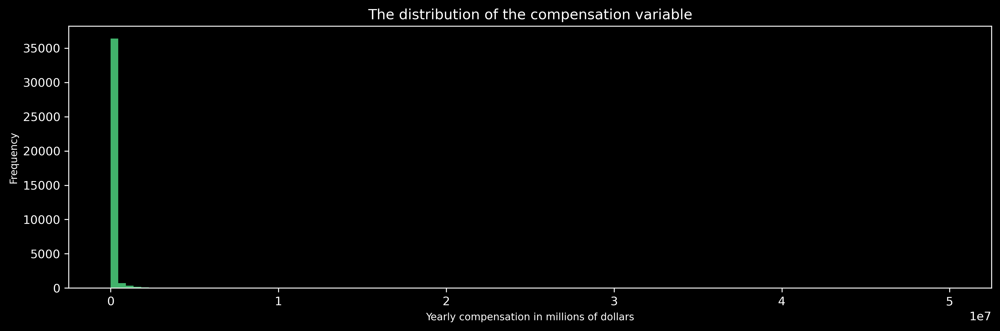

In [2815]:
# Defining color and label font size 
c='#5EFF99' 
labelSize=8.5
plot(compensation, colors=c, bins=110, title='The distribution of the compensation variable',
      xlabel='Yearly compensation in ten millions of dollars', ylabel='Frequency')

### Formatting the data.

The aim is to process the data in such a way as to create three different distribution shapes.

Creating a new variable `imputedComp` with imputed yearly compensation data:

Calculating the interquartile range of the compensation variable.

In [1603]:
Q1 = compensation.quantile(q=0.25) 
Q3 = compensation.quantile(q=0.75)
IQR = Q3 - Q1
print(f'IQR equals: {IQR}')

IQR equals: 84168.0


Calculating the upper and lower bounds.


In [1604]:
lowerBound = Q1 - 3*IQR
upperBound = Q3 + 3*IQR
print(f'Lower bound: {lowerBound}') 
print(f'Upper bound: {upperBound}') 

Lower bound: -216672.0
Upper bound: 372504.0


Calculating the number of outliers.

In [1605]:
outliers = compensation.loc[(compensation > upperBound)]
print(f'Number of outliers: {outliers.count()} out of 38071')

Number of outliers: 1949 out of 38071


Creating a new variable `imputedComp` by replacing outliers in the compensation variable with it's median. Since the compensation distribution is highly positively skewed, only selected values above the mean will be imputed.

In [1608]:
imputedComp = compensation.copy().rename('imputedComp')

In [1609]:
imputedComp[(imputedComp > upperBound)] = compensation.median()

In [1610]:
print(f'The maximum value for the trimCompensation variable is: {imputedComp.max()} $')

The maximum value for the trimCompensation variable is: 371679.0 $


A winsorized variable called `winsorizedComp` will be created, in which values exceeding a specified limit will be replaced with that limit. Additionally, `a significantly higher upper boundary` will be used compared to imputed compensation.

In [3023]:
upper_limit = compensation.quantile(q=0.75) + 10*IQR
winsorizedComp = compensation.copy() \
                   .rename('winsorizedComp') \
                   .clip(upper=upper_limit)
number_of_clipped_values = compensation.loc[
    (compensation > upper_limit)].count()
print(f'Number of clipped values: {number_of_clipped_values} out of 38071\n')
print(f'The maximum value for the winsorized compensation is: {winsorizedComp.max()} $')

Number of clipped values: 901 out of 38071

The maximum value for the winsorized compensation is: 961680.0 $


Creating a dataframe `df` containing the `imputedComp` and the `winsorizedComp` variables, and removing null values.

In [1612]:
df = pd.concat([imputedComp, winsorizedComp], axis=1).dropna()

Merging the categorical variable `country` into the `df` dataframe.

In [1613]:
df = df.merge(surv.country, on='ResponseId', how='left')
df.head(5)

,imputedComp,winsorizedComp,country
ResponseId,,,
3,40205.00,40205.00,United Kingdom of Great Britain and Northern I...
4,215232.00,215232.00,Israel
9,49056.00,49056.00,Netherlands
11,60307.00,60307.00,United Kingdom of Great Britain and Northern I...
12,194400.00,194400.00,United States of America


Encoding categorical variable `country` to numerical values.

In [1614]:
le = LabelEncoder()
df.country = le.fit_transform(df.country)
# Rescaling the variable, as the values will be compared to much higher compensation values.
df.country *= 3700

In [1615]:
df = df.reset_index(drop=True)

In [1617]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38071 entries, 0 to 38070
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   imputedComp     38071 non-null  float64
 1   winsorizedComp  38071 non-null  float64
 2   country         38071 non-null  int32  
dtypes: float64(2), int32(1)
memory usage: 743.7 KB


### Defining variables used in the following analysis.

In [1618]:
imputedComp = df.imputedComp.copy()
winsorizedComp = df.winsorizedComp.copy()
country = df.country.copy()
various_mean_sampling_distributions = defaultdict(list)
sample_ses_dict = defaultdict(list)
various_mean_sampling_SE_estimates = defaultdict(list)
stds_of_sample_SE_estimates = defaultdict(list)
sampling_parameters = { 'num_of_samples': [], 'samp_size': [] }

Please note that the variables in this study represent a sample of Stackoverflow users. However, for the purpose of this presentation, we are considering them as a population (of all survey respondents who answered the question about theirs compensation).

### Exploring data distributions using visualization and descriptive statistics.

#### Visualization.

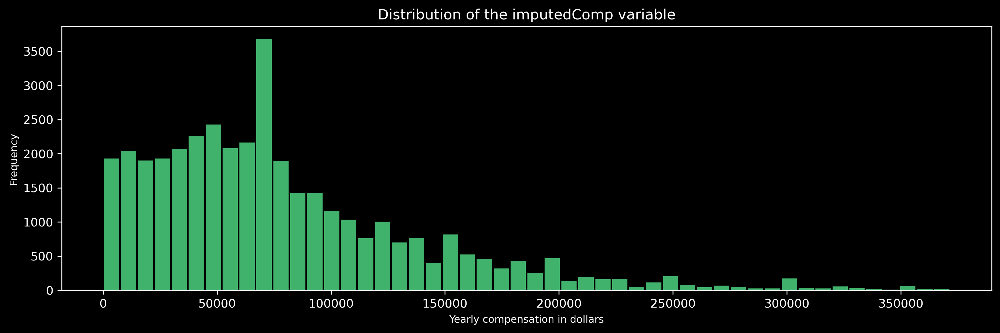

In [1624]:
plot(imputedComp, bins=50, colors=c, rwidth=0.9, ylabel='Frequency',
    title='Distribution of the imputedComp variable', xlabel='Yearly compensation in dollars')

After imputing, values around the median became especially prevalent.

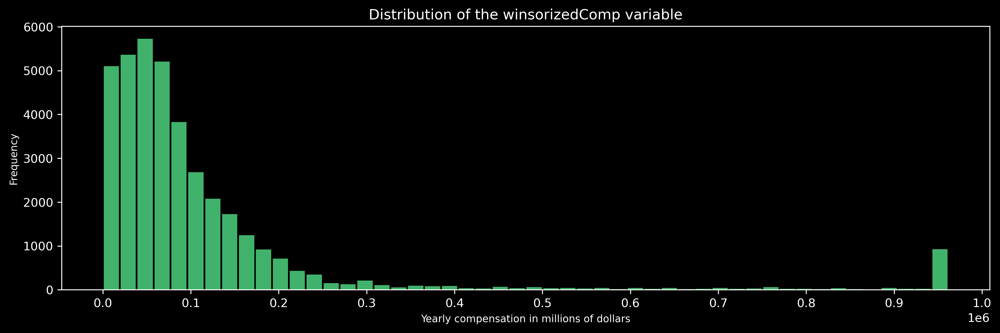

In [2816]:
plot(winsorizedComp, bins=50, colors=c, rwidth=0.9, ylabel='Frequency', nbins=11,
    title='Distribution of the winsorizedComp variable', xlabel='Yearly compensation in millions of dollars')

On the far right, a distinctive bin can be observed that represents clipped values. Because of the presence of extreme outliers, the scale extends up to one million dollars.

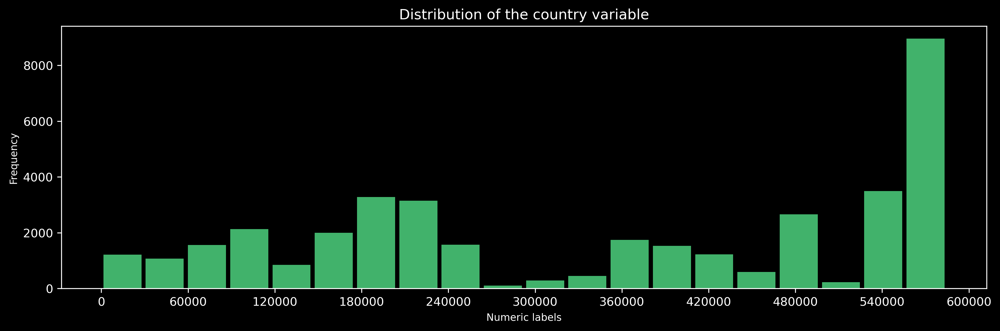

In [2821]:
plot(country, bins=20, colors=c, rwidth=0.9, ylabel='Frequency', nbins=12,
    title='Distribution of the country variable', xlabel='Numeric labels')
plt.show()

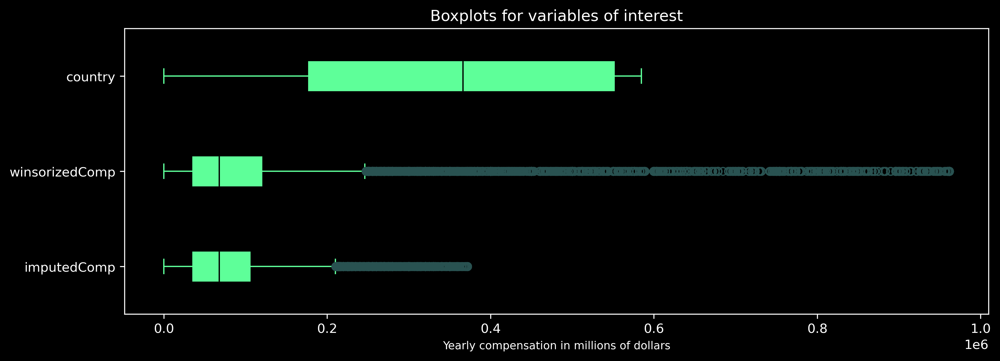

In [2725]:
color_dict =  {
             'boxprops': dict(color=c, facecolor=c),
             'capprops': dict(color=c),
             'flierprops': dict(color='#5EFF99', markeredgecolor='#295251'),
             'medianprops': dict(color='black'),
             'whiskerprops': dict(color=c)
}
plt.rcParams['figure.figsize'] = (12, 4)
plt.boxplot(df, 
            patch_artist=True, 
            vert=False,
            **color_dict,
            labels=df.columns,
            )
plt.title('Boxplots for variables of interest')
plt.xlabel('Yearly compensation in millions of dollars', size=labelSize)
plt.show()

There are no outliers in the country variable, but there are many in the imputedComp and even more in the winsorizedComp variable. On the other hand, the country variable has a much higher interquartile range, which means it have a wider range of values and more variability in its data than the imputedComp variable. Both compensation variables exhibit positive skewness, whereas the country variable is roughly symmetrical.

The Q-Q plots for each variable:

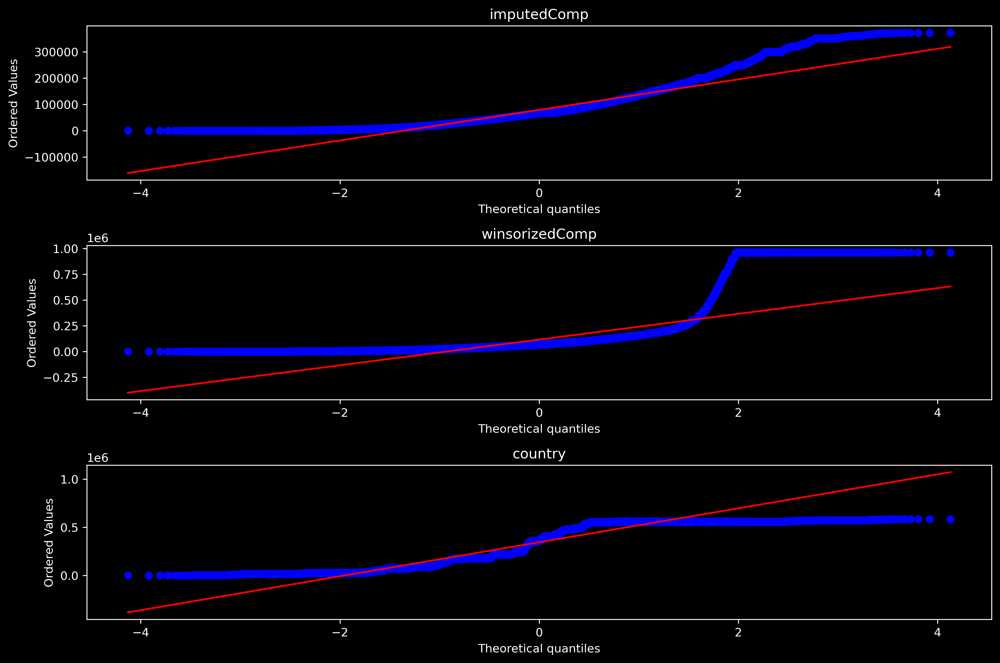

In [2891]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(12, 8))

stats.probplot(df.iloc[:, 0], dist='norm', plot=axes[0])
axes[0].set_title('imputedComp')

stats.probplot(df.iloc[:, 1], dist='norm', plot=axes[1])
axes[1].set_title('winsorizedComp')

stats.probplot(df.iloc[:, 2], dist='norm', plot=axes[2])
axes[2].set_title('country')
plt.tight_layout()
plt.show()

The country distribution exhibits a platykurtic pattern, while both compensation variables show a positive skewness and leptokurtic pattern. In the case of winsorizedComp, the winsorized data points are visible as a horizontal line on the right side of the plot.

#### Descriptive statistics.

In [2887]:
df.describe()

,imputedComp,winsorizedComp,country
count,38071.00,38071.00,38071.00
mean,78941.12,115220.27,344200.78
std,61554.58,172414.06,189435.47
min,1.00,1.00,0.00
25%,35832.00,35832.00,177600.00
50%,67845.00,67845.00,366300.00
75%,105537.00,120000.00,551300.00
max,371679.00,961680.00,584600.00


In [1628]:
print(f'Number of unique values in encoded country variable: {len(surv.country.unique())}')

Number of unique values in encoded country variable: 181


In [1629]:
df.agg(['skew', 'kurtosis'])

,imputedComp,winsorizedComp,country
skew,1.44,3.71,-0.19
kurtosis,2.57,14.40,-1.52


The distribution of imputedComp is moderately skewed to the right and has heavier tails compared to the normal distribution. In contrast, WinsorizedComp's distribution is heavily skewed to the right, with a kurtosis value indicating the presence of extreme outliers. Regarding the "country" variable, the skewness value suggests very slight negative skew, while the kurtosis indicates lighter tails than the normal distribution.

It is already evident that none of these distributions follow a normal distribution. For comparison a histogram and density curve below represent normal distribution with a mean of 100 and a standard deviation of 15.

# Simulation and analysis.

## The role of the Central Limit Theorem in hypothesis testing.

This section covers some of the key concepts related to inferential statistics, including an explanation of the Central Limit Theorem and its significance, an introduction to sampling distributions, and the meaning and role of standard error in estimating population parameters. Additionally, the section provides examples of how to generate, visualize, and analyze the properties of sampling distributions.

### The Central Limit Theorem.

The Central Limit Theorem is the foundation for statistical inference. It states that the sampling distribution of certain statistics such as sample means, proportions or test statistics, will be approximately normally distributed, regardless of the underlying population distribution if a number of random samples is large enough. The theorem is a key concept in probability theory as it implies that probabilistic and statistical methods that work for normal distributions can be applicable to many problems involving other types of distributions. It plays a significant role in hypothesis testing, confidence intervals estimation and machine learning. Our main focus will be on the sampling distributions of the mean and the standard error estimations.

The Central Limit Theorem states that:

1. As the sample size increases, the distribution of the sample means approaches a normal distribution. This will hold true regardless of whether the source population distribution is normal assuming it's variance is finite. 

2. If you take a sufficiently large sample size from a population, the mean of all samples from that population will be equal to the population mean. Sample mean, is therefore said to be an unbiased estimator for population mean.

3. The standard error of the sampling distribution of the mean, which measures the dispersion of sample means around the population mean, is equal to the standard deviation of the population divided by the square root of the sample size. 

An important assumption that must be met to apply the Central Limit Theorem is that the samples should be selected randomly and independently. Additionally, the sample size should be sufficiently large, with the accepted threshold typically being at least 30 samples. However, this assumption is based on the population distribution not being extremely skewed or having heavy tails, as these factors can affect the shape of the sampling distribution even for larger sample sizes.

In the following sections, we will examine these topics in greater detail.

### Introduction to Sampling Distributions and Their Significance in Inferential Statistics.

In statistics, a sampling distribution refers to the probability distribution of a statistic that's obtained from a sample of a population. It represents all possible values that the statistic can take when repeated random samples of the same size are drawn from the population.

Inferencial statistics involves drawing conclusions about a population based on information obtained from a sample. Sampling distributions help in this process by providing a way to quantify the sampling error associated with the sample statistic. The shape of the sampling distribution provides important information about the properties of the statistic being examined, such as its variability and bias. This information is critical in inferential statistics because it allows us to estimate the true population parameters, compute probabilities of certain outcomes and make informed decisions based on those probabilities. Sampling distributions are related  to constructing confidence intervals, performing hypothesis tests, and calculating p-values..

For example, let's assume, that we want to find out whether the mean yearly salary of IT professionals is lower than $100,000. For this purpose we collecte a random sample of independent observations and use it to estimate the population mean. 

We will generate a random `sample` of n=10 from an imputed compensation variable and plot the results.

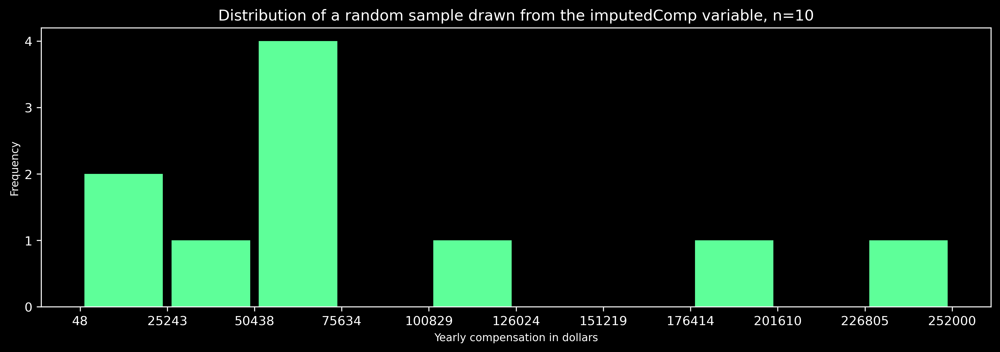



Sample mean: 86160.2

Sample standard deviation: 77741.71


In [2724]:
sample = imputedComp.sample(10)

count, bin_edges = np.histogram(sample, 10)

sample.plot(kind='hist',
          figsize=(13.5, 4), 
          bins=10,
          xticks=bin_edges,
          color=c,
          stacked=True,
          fontsize=10,
          rwidth=0.9
         )
plt.title('Distribution of a random sample drawn from the imputedComp variable, n=10')
plt.ylabel('Frequency', size=labelSize)
plt.xlabel('Yearly compensation in dollars', size=labelSize) 
plt.gca().yaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.show()

print(f'''\n\nSample mean: {round(sample.mean(),2)}\n
Sample standard deviation: {round(sample.std(),2)}''')

The sample mean is 13,840 lower than 100,000. However, if we simply compare the sample mean to this fixed value, we would neglect the effect of `random sampling error` by assuming that our sample mean is equal to the population mean. While the standard deviation of the sample reflects the distribution of sample data around it's mean (although sometimes other mesures such as IQR may be more fitting), variation can also exist between different samples. By repeating the sampling process multiple times, we can generate a probability distribution that reflects the range of potential sample means for a given sample size. This distribution is a type of sampling distribution. It's standard deviation is refered to as `the standard error` (SE) and it captures the variability of sample means. 

The standard error helps us determine the precision of our sample mean as an estimate of the population mean which is crucial in hypothesis testing. It can be used to calculate confidence intervals which are a range of values that we are reasonably confident the true population mean lies within. Returning to our example, if the standard error estimated from the sample were 2,000, it would indicate that the true population mean is likely lower than 100,000. On the other hand, if the SE were around 20,000, our hypothesis could still be true, but we would lack evidence to support it. 

Fortunately, we can estimate the value of the standard error without the need to gather thousands of samples. We often assume the normality of the sampling distribution when interpreting standard errors. The Central Limit Theorem is crucial in this regard since it enables us to make this assumption, even if the population data are not normally distributed, as long as the sample size is large enough. 

Let us calculate sample means, standard deviations, and standard errors for 10,000 random samples, each with a sample size of 10. By doing so, we will obtain an estimated `sampling distributions` of the sample mean, sample standard deviation, and estimations of standard error. It's approximation, because to create a proper sampling distribution we would need to draw infinite number of samples.

In [845]:
display(6)
sample_means, sample_stds, sample_ses = retrieve_sampling_distributions_of_sample_means_stds_and_SE(
    imputedComp, sample_size=10, number_of_samples=10000)
sampling_distributions = pd.concat([sample_means, sample_stds, sample_ses], axis=1).sort_values(by='imputedComp_SampMeans', ascending=False, ignore_index=True)
sampling_distributions

,impCompensation_SampMeans,impCompensation_SampStds,impCompensation_SEestim
0,166300.60,106279.58,33608.55
1,165560.50,93330.55,29513.71
2,152164.10,95392.69,30165.82
...,...,...,...
9997,26535.90,18598.59,5881.39
9998,26257.60,19150.66,6055.97
9999,24255.90,22850.79,7226.05


Now, we will create a histogram illustrating the probability distribution of sample means for a sample size of 10.

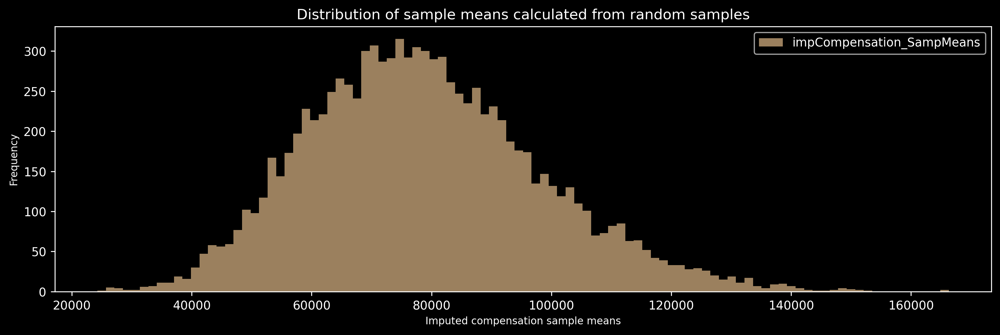

In [1113]:
plot(sample_means, title='Distribution of sample means calculated from random samples', 
     xlabel='Imputed compensation sample means', ylabel='Frequency', bins=100)

In [1650]:
print(f'''\n\nThe mean of the sampling distribution: {round(sample_means.mean()[0],2)}\n
The standard deviation of the sampling distribution: {round(sample_means.std()[0],2)}''') 



The mean of the sampling distribution: 78835.81

The standard deviation of the sampling distribution: 19387.99


The shape of the sample distribution represents the sampling error and precision of the sample mean estimates. As we can see, the data already somewhat resembles a normal distribution, as predicted by the Central Limit Theorem, although it is still positively skewed. Additionally, the mean of the sampling distribution is close to the population mean of 78,941.12.

On the other hand, the standard deviation of the sampling distribution which in this case is the standard error of the mean, is significantly smaller than that of the population (61,554.58). This is reasonable, as the probability of randomly selecting data representing only high or only low compensation values is low. Therefore, the standard deviation of the sampling distribution decreases as the sample size increases. Because of that, larger sample sizes provide greater precision and statistical power, which enables the detection of smaller effects.

The standard error of the mean is equal to the population standard deviation $\sigma$ divided by the the square root of $n$:

$ SEM = \frac{\sigma}{\sqrt{n}}$

Usually the population standard deviation is not known. In those cases we estimate the true standard error using a sample standard deviation $s$.

$ {\hat {\sigma }_{\bar {x}}} \approx {\frac {s}{\sqrt {n}}}$

In [1724]:
SE_sampSize10 = true_standard_error_calculations(10, imputedComp).iat[0,0]
print(f'''A standard error of the mean, calculated using the population standard deviation, 
for a sample size of 10 equals: {round(SE_sampSize10,2)}''')

A standard error of the mean, calculated using the population standard deviation, 
for a sample size of 10 equals: 19465.01


This value of the theoretical SE is close to the standard deviation of the approximated  sampling distribution of the mean that was calculated above.

Next, we will include the `sampling distributions of the standard deviation and standard error estimations` to the histogram. Based on the previously mentioned formula, it is expected that the distribution of standard error estimates will have a narrower range than the distribution of the sample's standard deviation."

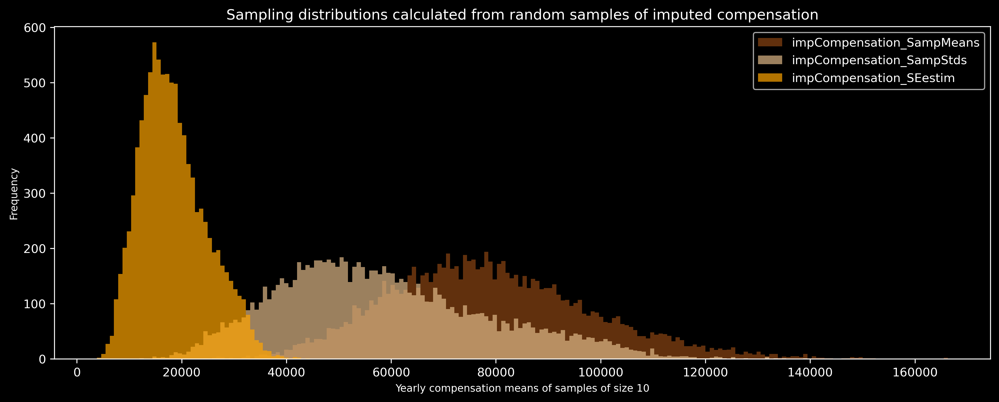



The mean of the sampling distribution of standard deviation: 58432.97

The standard error of the sampling distribution of standard deviation: 20035.57

The mean of the sampling distribution of standard error of the mean estimates: 18478.13

The standard error of the sampling distribution of standard error of the mean estimates: 6335.8

Minimum SE estimate: 3840.91, maximum SE estimate: 44108.21


In [1992]:
plot(sampling_distributions, title='Sampling distributions calculated from random samples of imputed compensation', 
     xlabel='Yearly compensation means of samples of size 10', ylabel='Frequency', figsize=(14,5))

print(f'''\n\nThe mean of the sampling distribution of standard deviation: {round(sample_stds.mean()[0],2)}\n
The standard error of the sampling distribution of standard deviation: {round(sample_stds.std()[0],2)}\n
The mean of the sampling distribution of standard error of the mean estimates: {round(sample_ses.mean()[0],2)}\n
The standard error of the sampling distribution of standard error of the mean estimates: {round(sample_ses.std()[0],2)}\n''') 
print(f'Minimum SE estimate: {round(sample_ses.min()[0],2)}, maximum SE estimate: {round(sample_ses.max()[0],2)}') 

The high level of variability exhibited by the sample standard deviations, coupled with the fact that they are not centered on the population standard deviation, suggests that  in this case, the sample standard deviation may not be an accurate estimator of the population standard deviation. (even though in this analysis all standard deviations calculated for a given sample are corrected using <a href=https://www.uio.no/studier/emner/matnat/math/MAT4010/data/forelesningsnotater/bessel-s-correction---wikipedia.pdf>the Bessel's correction<a/>). As a result `standard error estimations may be biased` and systematically underestimate the true standard error of the mean.

Taking into account that this sampling distribution is only an approximation, it is possible that other simulations could produce slightly different results. So could this underestimation of SE be due to sampling error? With 10,000 point estimations, it seems highly unlikely, but this question provides an opportunity to demonstrate the methodology of hypothesis testing and introduce the various tools and concepts associated with it.

## Hypothesis testing - an example.

During statistical analysis, it is typical to be unaware of the population parameters and sampling distributions of the statistics of interest. In such cases, estimation and hypothesis testing methods can be used to draw conclusions about the entire population based on a representative sample. Hypothesis testing is a critical statistical tool that provides a structured approach to analyzing data and making decisions based on statistical evidence.

In this example we aim to determine if there is a statistically significant difference between the standard error of the mean, calculated using the population standard deviation for a sample of size 10, and the mean of 10,000 estimated standard errors obtained from random samples of size 10. So, each estimate of the standard error is one observation and they together form one sample. This is analogous to our previous example with yearly salary, however this time we have no assumptions regarding the direction of the difference between the means. We are only interested in whether a real difference exists.

$ {\bar {X}} = \frac{1}{n}\sum_{i=1}^{n}{\hat{\sigma}_{\bar{x_i}}} = 18478.13$

$  \mu _{0}  = {\sigma} = 19465.01$

Sample size $n = 10000$

SD of the sample $s = 6335.8$

Let's formulate our hypothesis pair. The null and alternative hypotheses are always claims about the population, and they are used in hypothesis testing to determine the validity of a statistical claim. The null hypothesis is tested against the alternative hypothesis, and the evidence collected from the data is used to either reject or fail to reject the null hypothesis in favor of the alternative hypothesis.

`Null Hypothesis`  :

there is no statistically significant difference between the expected value of means of 10,000 estimated standard errors obtained from random samples of size 10 and the true standard error. 

$ \mu = \mu _{0} $


`Alternate Hypothesis`

There is a statistically significant difference between the expected value of means of 10,000 estimated standard errors obtained from random samples of size 10 and  the true standard error. 

$ \mu \neq \mu _{0}  $

Our initial assumption is that the null hypothesis is valid. We then proceed to assess the probability of our sample data resulting from random sampling error. Essentially, we evaluate the likelihood of observing our data, assuming that its sampling distribution is`the null distribution` of the statistical test used. The null distribution represents the distribution of test statistics that would be obtained if the null hypothesis were true, and it is used as the basis for calculating the p-value. The shape of the distribution can vary depending on a test used. For example, while the null distributions for both a z-test and a t-test center on the null value, the shape of the z-distribution is normal, while for a t-test, it tends to be flatter and more spread out. The t-distribution's exact shape is determined by the `degrees of freedom`, which is a combination of the available data and the number of parameters that require estimation. As the degrees of freedom increase, the t-distribution approaches normality.


$\alpha$ value $=0.01$


`The significance level α` sets the threshold for statistical significance.  It determines the probability of committing `a type I error`, which occurs when we reject the null hypothesis even though the observed difference is due to chance. However, if we do not reject the null hypothesis at a given alpha level, it does not necessarily indicate that the null hypothesis is true. It only implies that there is not enough evidence to reject it. `A type II error` happens when we do not reject the null hypothesis even though it is false. It is important to note that the significance level is arbitrary, although there are certain standards depending on the field. Therefore, it is crucial to establish it before conducting an analysis. The goal is to strike a compromise between avoiding  a type I and type II errors.

Based on our sample size, we invoke `the Central Limit Theorem` and assume that the distribution of the sample means is approximately normal. We use the sample standard deviation to estimate `the standard error`. Although it's recommended to use a t-test when the population standard deviation is not known, we can use a z-test due to a large sample size. In this case our result will not be affected since the null distributions of both tests will be approximately identical.

`A z-test` informs us how many standard deviations our sample statistic is from the pre-specified value. The probability of obtaining the observed sample statistic is calculated from the test distribution, To conduct a z-test, we need to calculate the z-statistic using the formula:

$ {\displaystyle z = {\frac {{\bar {X}}-\mu _{0}}{\frac{\sigma}{\sqrt{n}}}}}$

In this case:

${\displaystyle z = {\frac {{\bar {X}}-\mu _{0}}{\frac{s}{\sqrt{n}}}}}$

where ${\bar {X}}$ is the mean of estimated standard errors, $\mu _{0}$ is the expected value i.e. the true standard error, $s$ is the sample standard deviation and $n$ is the sample size.

$z = \frac{18478.13 - 19465.01}{\frac{6335.8}{\sqrt{10000}}} = -15.58$

Assuming that the null hypothesis is true and the sample was drawn from a population with a mean equal to $\mu_{0}$, we estimated that it is more than 15 standard deviations away from the population mean. The probability of observing a sample mean that far from the population mean by chance is nearly impossible. However, in order to finalize the procedure, let us calculate the critical value and construct a critical interval.

`The critical value` is derived from the significance level and degrees of freedom for the test being performed, and represents the point beyond which the calculated test statistic is considered significant enough to reject the null hypothesis. Since we are performing a two-tailed test (meaning the hypothesis being tested is non-directional), we need to use a critical value to calculate a critical interval. We can do this using the scipy stats module with a significance level of $\alpha=0.01$.

In [1917]:
alpha = 0.01
z_critical = scipy.stats.norm.ppf(alpha/2)
print(f'critical interval: [{round(z_critical,3)},  {round(-z_critical,3)}]')

critical interval: [-2.576,  2.576]


Based on our calculated z-score of -15.58, which falls within the rejection region (values less than -2.576 or greater than 2.576), we can conclude that the evidence suggests the data did not come from the null distribution. Therefore, we reject the null hypothesis.

We can also calculate the `p-value` to assess how often we would expect to see a test statistic as extreme or more extreme than the one calculated by our statistical test, if the null hypothesis of that test is true. The smaller the p-value, the stronger the evidence against the null hypothesis and in favor of the alternative hypothesis. By comparing the p-value to the chosen significance level ($\alpha$) we can determine whether to reject the null hypothesis. Critical value/interval and p-value, will lead to the same conclusion, but the p-value provides a standardized measure of significance that can be compared across different experiments and statistical tests. 
 
$p\text{-value} = 4.55 \times 10^{-54}$

If the null hypothesis is true, there is only a $4.55 \times 10^{-52} \%$ chance of observing a sample statistic that is at least as extreme as ours due to random sampling error. Although it does not inform us about the cause of the discrepancy between the theoretical and estimated mean standard error. Could it be due to incorrect calculations, errors in the sampling process, Jensen's inequality, or some other factor? Additional reasoning or investigation is necessary to determine the underlying cause.

In physics, the standard for discovery (known as 5 sigmas) is very strict, with a p-value of 0.0000003. For example, in the case of the first detection of gravitational waves, the estimated significance was 5.1 sigma, which means there was only a 1 in 4.6 million probability that the detection was due to chance. Our p-value is even smaller than that. In fact, if we were to multiply it by the number of atoms on Earth, it would still be lower than our α level. However, it's crucial to bear in mind that while a p-value indicates the presence of an effect, on its own it does not provide information on the magnitude of the effect.

To measure strength of an observed effect or relationship between two variables in a statistical analysis, we can calculate the effect size. The effect size enables comparisons between the statistical results arising from different measuring methods and different measuring units. We will estimate the `effect size`  using Cohen's d for one sample z-test. 

$ {\displaystyle d={\frac {{\bar {X}}-\mu _{0}}{s}}}$

In this case:

$ {\displaystyle d={\frac {{{18478.13}} - {19465.01}}{6335.8}}} = 0.156$

As the sample size increases, the hypothesis test gains greater `statistical power` to detect small effects. Actually, sometimes it can be problematic. For example, when testing for normality of a distribution, a very large sample size may make miniscule differences statistically significant. Since our sample size of 10,000 was large, we were able to obtain a very high level of significance for a small effect.

Although the mean difference of 0.156 times the standard deviation is considered small, in this case even small differences can result in unreliable estimates of parameters and confidence intervals. This can have significant consequences for statistical analyses, leading to incorrect conclusions. One way to mitigate this issue is to use the t-distribution which has fatter tails compared to the normal distribution. This account for the additional uncertainty that arises when estimating the population variance from a small sample size.

We can also provide an estimate of the range of plausible values for a population parameter using `the confidence interval`. We will focus on this topic in another section, but for completeness, we will calculate it here too. First, we will set our level of confidence at 1 - alpha = 99%. We need to calculate `the margin of error` using the critical value and the standard error to define the lower and upper bounds of the interval.

$ CI = (\bar{x} - {z}\frac{s}{\sqrt{n}},\ \bar{x} + {z}\frac{s}{\sqrt{n}})$

Plugging in the values: 

$ CI = (18478.13 - 2.576\frac{6335.8}{\sqrt{10000}},\ 18478.13 + 2.576\frac{6335.8}{\sqrt{10000}})$

$ CI = (18315, 18641.2) $

We will dvelve deeper into the interpretation of confidence intervals later. For now, it suffices to say that we can be 99% confident that the true population mean falls within a range of 18315 to 18641.2.

To conclude, we were able to estimate with a very high degree of confidence that a significant difference exists between the standard error of the mean, calculated using the population standard deviation, and the mean of sampling distributions of standard errors estimated from random samples of size 10. We can infere that we detected a negative bias in those estimations. However, calculating the effect size revealed that this difference is not very substantial. 


But is it appropriate to use estimated standard error to test for bias in SE estimations? We will revisit this issue when we examine how sampling distributions change as the sample size increases.

`In summary`, the example serves as an illustration of inferential statistical analysis. We formulated a null hypothesis assuming no significant difference between the sample mean and an expected value. We invoked the Central Limit Theorem to assume that the distribution of the sample mean of interest is approximately normal. After setting a significance level for our test, we choosed and calculated the appropriate test statistic, which led us to reject the null hypothesis in favor of the alternative hypothesis that the observed difference was not due to random sampling error. We also took into account possible causes of the detected bias. Furthermore, we estimated the confidence interval and the effect size to understand the magnitude of the difference. In some cases it might also be usefull to utilize another method to cross-check the observed results. 

### A cross verification of statistical test results through sampling distribution analysis.

There are times it is worthwhile to cross-check your statistical analysis results with another method to enhance the reliability and validity of your findings. For this purpose, we will utilize simulation to produce an approximate sampling distribution of the mean of estimated standard errors, and then compare these results with those obtained from the z-test.

To do this, we will generate 1000 sampling distributions, each build on 10,000 samples of size 10. We will also calculate the mean of estimated standard errors for each sampling distribution. This will allow us to obtain a sampling distribution of the mean of estimated standard errors, which we will then plot as a histogram.

In [832]:
Generate_multiple_sampling_distributions_and_calculate_statistics(
    imputedComp, iterations=1000, start_sample_size=10, start_sample_num=10000, 
    increment=False, step=1, sample_size_step=2)

100%|██████████| 1000/1000 [27:38<00:00,  1.66s/it]


In [ ]:
MeansSampDistrib1000 = get_sampling_distributions_statistics()
SE_SampDistrib1000 = get_sampling_distributions_statistics_for_SE()

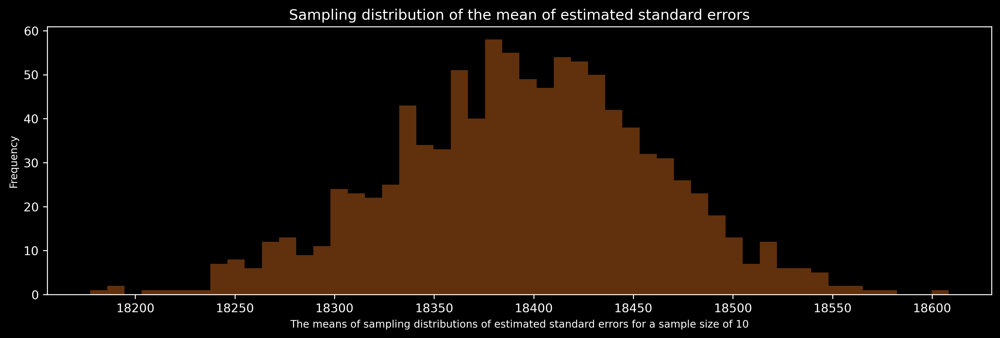

In [3174]:
plot(SE_SampDistrib1000.iloc[:,0], bins=50,title='Sampling distribution of the mean of estimated standard errors', 
     xlabel='The means of sampling distributions of estimated standard errors for a sample size of 10', ylabel='Frequency', nbins=11)

In [1199]:
print(f'\nMean: {round(SE_SampDistrib1000.iloc[:,0].mean(),2)}\n')
print(f'Standard deviation: {round(SE_SampDistrib1000.iloc[:,0].std(),2)}')


Mean: 18394.85

Standard deviation: 65.99


As we can see, the distribution is approximately normal, the standard error is close to the estimated standard error of 63.36 and the sample mean from the hypothesis testing example (18478.13) is relatively close to the mean of the sample distribution (around 1.25 SD)

We can provide a visual representation of the sample distribution in comparison with the null distribution centered at a theoretical value. Additionally, we will mark the sample mean from the hypothesis testing example with a gold triangle and the confidence interval with gold vertical lines.

In [1292]:
null_distr = (SE_SampDistrib1000.iloc[:,0]+986)
null_distr.name = 'Approximation of nulls distribution'

In [1293]:
comparison = pd.concat([SE_SampDistrib1000.iloc[:,0], null_distr], axis=1)

In [2825]:
# Calculating margin of error and CI bounds
dist_mean = sample_ses.mean()[0]
dist_SE = sample_ses.std()[0]/np.sqrt(10000)
MOE = -z_critical*dist_SE
lower_CI_limit = dist_mean - MOE
upper_CI_limit = dist_mean + MOE

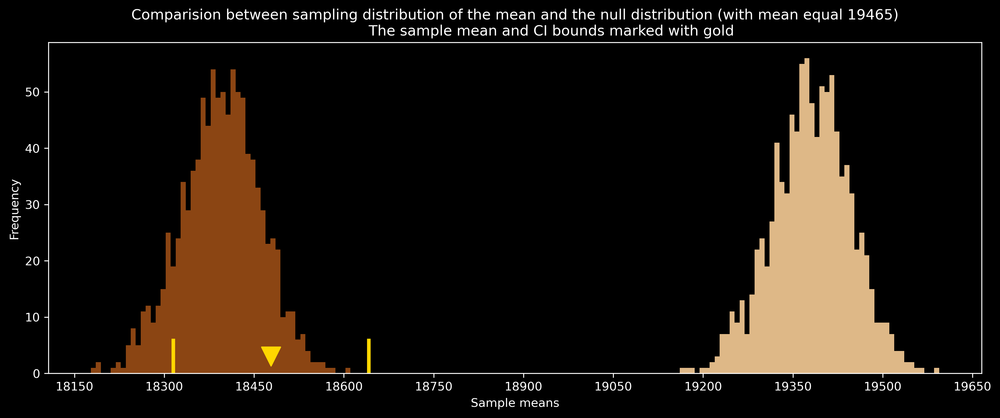

In [2828]:
comparison.plot(kind='hist', bins=170, color=colors, legend=False, figsize=(14,5), 
                title='''Comparision between sampling distribution of the mean and the null distribution (with mean equal 19465)
                The sample mean and CI bounds marked with gold''')
plt.xlabel('Sample means')
plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(nbins=11, integer=True))
plt.axvline(x=lower_CI_limit , ymax=0.10, linewidth=3, color='gold')
plt.axvline(x=upper_CI_limit , ymax=0.10, linewidth=3, color='gold')
plt.scatter(x=dist_mean, y=3, s=(250), marker='v', color="gold"); 

It is evident that the sample mean aligns more closely with the sampling distribution of the mean of estimated standard errors than with the sampling distribution of the null hypothesis. Moreover, it is important to note that these two distributions are significantly distinct from each other. This cross validate our result and proofs that our inferences about the underlying population were correct.

We can also use this opportunity to compare the population mean and true standard error with the values calculated by simulating multiple sampling distributions.

In [1727]:
MeansSampDistrib1000

impCompensation_SampMeans_mean  \
num_of_samples samp_size                                   
10000          10                               78668.49   
               10                               78910.51   
               10                               78818.19   
...                                                  ...   
               10                               79045.70   
               10                               79383.59   
               10                               79039.14   

                          impCompensation_SampMeans_std  
num_of_samples samp_size                                 
10000          10                              19222.43  
               10                              19245.98  
               10                              19557.96  
...                                                 ...  
               10                              19494.64  
               10                              19550.11  
               10                              19753.61  

[1000 rows x 2 columns]

In [1728]:
Average_Mean = MeansSampDistrib1000.imputedComp_SampMeans_mean.mean()
Means_std = MeansSampDistrib1000.imputedComp_SampMeans_mean.std()
Means_SE = Means_std/np.sqrt(1000)
Average_SD = MeansSampDistrib1000.imputedComp_SampMeans_std.mean()
SD_std = MeansSampDistrib1000.imputedComp_SampMeans_std.std()
SD_SE = SD_std/np.sqrt(1000)
imputedComp_popMean =  df.imputedComp.mean()
print(f'''The average mean obtained by calculating the means of 1000 approximated sampling distributions of the mean: 
{round(Average_Mean, 2)} (SD = {round(Means_std, 2)}, SE = {round(Means_SE,2)})   Population mean: {round(imputedComp_popMean, 2)}''')
print(f'''\nThe average SD of sample distributions obtained by calculating the standard deviations of 1000 approximated sampling distributions of the mean: 
{round(Average_SD,2)} (SD = {round(SD_std, 2)}, SE = {round(SD_SE, 2)})   true SE: {round(SE_sampSize10,2)}''')

The average mean obtained by calculating the means of 1000 approximated sampling distributions of the mean: 
78937.38 (SD = 190.86, SE = 6.04)   Population mean: 78941.12

The average SD of sample distributions obtained by calculating the standard deviations of 1000 approximated sampling distributions of the mean: 
19466.96 (SD = 146.81, SE = 4.64)   true SE: 19465.01


In the subsequent part of this work We will explore the accuracy of sample statistics in estimating population parameters further by utilizing visualization techniques. We will also examins how sampling distributions vary based on population distribution and sample size.

## Visualizing and Analyzing the Impact of Sample Sizes on Different Sampling Distributions.

### Sampling distributions of the sample mean. 

In this section We will focus on sampling distributions of the mean calculated for `three variables`: imputedComp, winsorizedComp and country. Specifically, we will generate sampling distributions comprising 100,000 samples each for sample sizes of 5, 10, 15, 30, 50, 100 and 200.

Sample size: 5

In [2761]:
means5, stds5, SEs5 = retrieve_sampling_distributions_of_sample_means_stds_and_SE(
    imputedComp, winsorizedComp, country, sample_size=5, number_of_samples=100000)

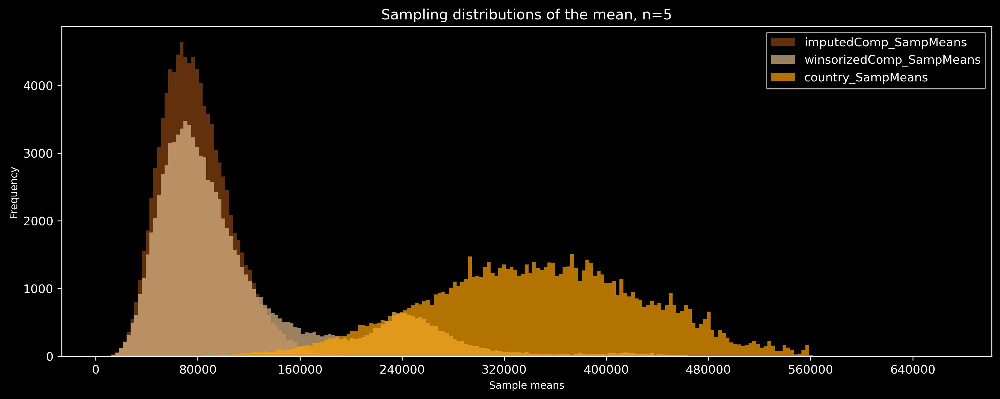

,imputedComp_SampMeans,winsorizedComp_SampMeans,country_SampMeans
Range,238593.00,662071.00,512820.00


In [2830]:
plot(means5, title='Sampling distributions of the mean, n=5', xlabel='Sample means', 
     ylabel='Frequency', bins=223, figsize=(14,5), nbins=10)
ranges = means5.max() - means5.min()   
pd.DataFrame(ranges, columns=['Range']).T

At a sample size of 5, there is a significant overlap between the sampling distributions of the three variables, especially between the imputed and Winsorized compensation, which have a large number of similar sample means. The sample means of the imputedComp variable appear to be the most precise, while the winsorizedComp variable has the largest range.

The winsorized compensation sampling distribution of the mean takes on a bimodal shape for small sample sizes. It does not center on the population mean, instead most of the sample means center around the population median, but there is also a second peak due to clipped values. If we need to conduct statistical analysis when the distribution of the sample statistic is not normal, it is recommended to use `nonparametric tests` or `bootstrapping` techniques to obtain reliable results.

Sample size: 10

In [2333]:
means10, stds10, SEs10 = retrieve_sampling_distributions_of_sample_means_stds_and_SE(
    imputedComp, winsorizedComp, country, sample_size=10, number_of_samples=100000)

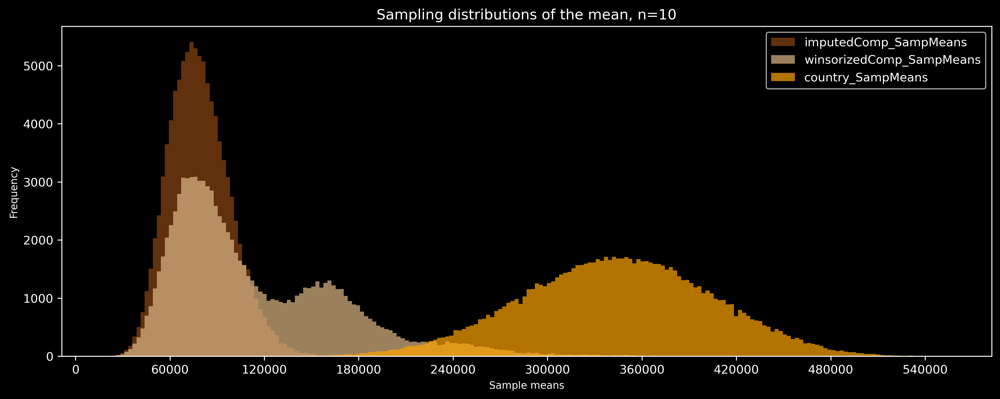

In [2831]:
plot(means10, title='Sampling distributions of the mean, n=10', xlabel='Sample means', 
     ylabel='Frequency', bins=208, figsize=(14,5), nbins=10)

Sample size: 15

In [2783]:
means15, stds15, SEs15 = retrieve_sampling_distributions_of_sample_means_stds_and_SE(
    imputedComp, winsorizedComp, country, sample_size=15, number_of_samples=100000)

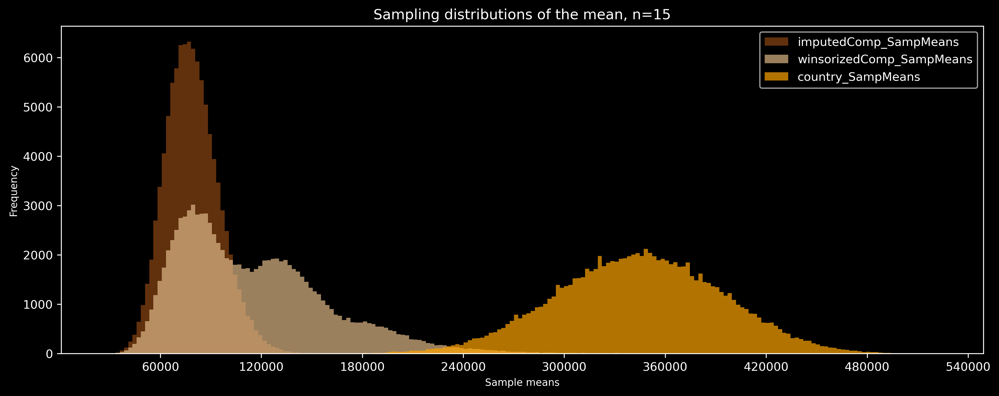

In [2832]:
plot(means15, title='Sampling distributions of the mean, n=15', xlabel='Sample means', 
     ylabel='Frequency', bins=200, figsize=(14,5), nbins=10)

Sample size: 20

In [2785]:
means20, stds20, SEs20 = retrieve_sampling_distributions_of_sample_means_stds_and_SE(
    imputedComp, winsorizedComp, country, sample_size=20, number_of_samples=100000)

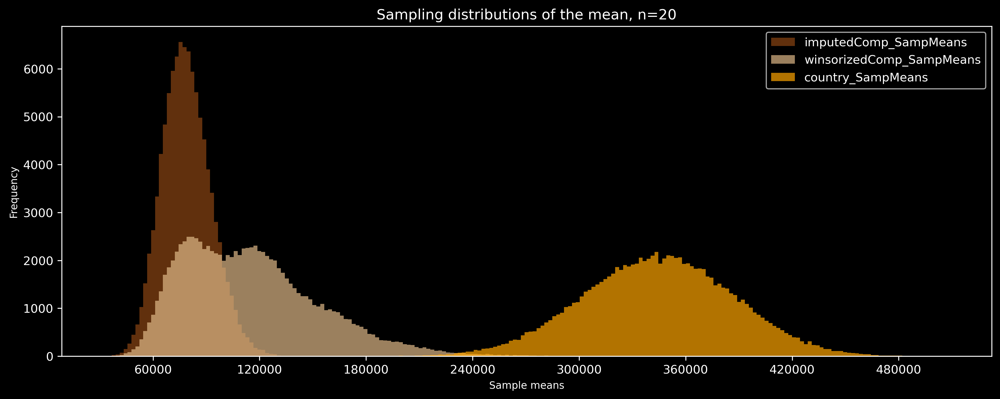

In [2833]:
plot(means20, title='Sampling distributions of the mean, n=20', xlabel='Sample means', 
     ylabel='Frequency', bins=215, figsize=(14,5), nbins=10)

#### Sample size: 30. A boundary between small and large samples?

Most statistical texts use a sample size of 30 as the boundary between small and large samples.
The general rule of thumb is that samples of that size or greater will have a fairly normal distribution regardless of the shape of the distribution of the variable in the population. However, this assumes that the population distribution is not extremely skewed or has heavy tails, which can affect the shape of the sampling distribution even for larger sample sizes.

In [2182]:
means30, stds30, SEs30 = retrieve_sampling_distributions_of_sample_means_stds_and_SE(
    imputedComp, winsorizedComp, country, sample_size=30, number_of_samples=100000)

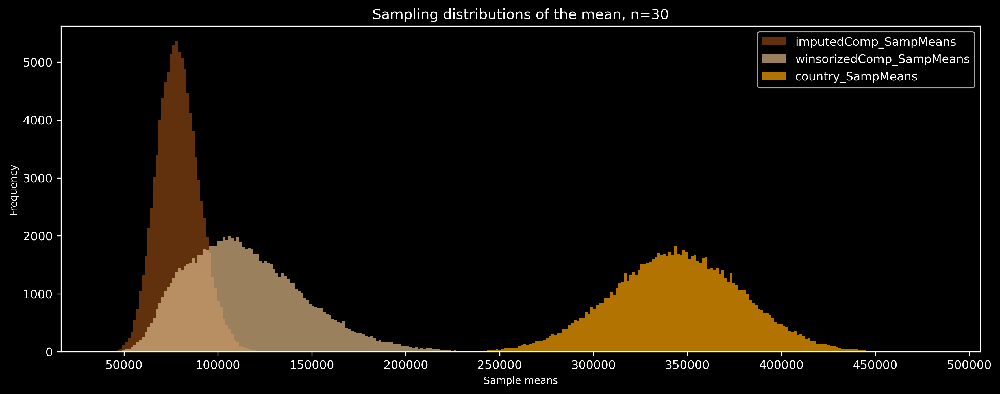

,imputedComp_SampMeans,winsorizedComp_SampMeans,country_SampMeans
Range,96744.93,267317.27,292670.00


In [2834]:
plot(means30, title='Sampling distributions of the mean, n=30', xlabel='Sample means', 
     ylabel='Frequency', bins=300, figsize=(14,5), nbins=10)
ranges = means30.max() - means30.min()
pd.DataFrame(ranges, columns=['Range']).T

While the sampling distributions of country and imputedComp variables appear to be approximately normal, the sampling distribution of winsorizedComp exhibits a slight positive skewness and heavier tails when compared to the normal distribution. This is related to the skeweness and the presence of prominent outliers in the population distribution for this variable. At the same time it's worth noting that it took an unimodal shape and now the center falls on population mean.

In [3024]:
means30.agg(['mean', 'median','skew','kurtosis'])

,imputedComp_SampMeans,winsorizedComp_SampMeans,country_SampMeans
mean,78972.92,115271.15,344320.87
median,78487.50,111543.13,344346.67
skew,0.25,0.67,-0.03
kurtosis,0.05,0.47,-0.02


The Q-Q plots confirms that winsorizedComp sampling distributions of the mean deviates from a normal distribution and is skewed to the right.

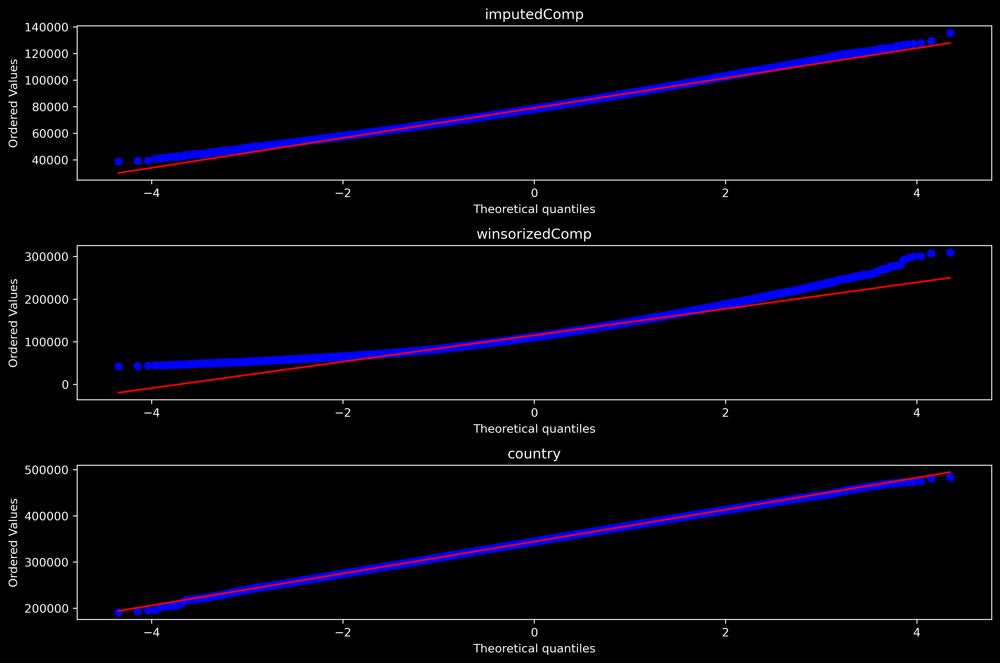

In [2340]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(12, 8))

stats.probplot(means30.iloc[:, 0], dist='norm', plot=axes[0])
axes[0].set_title('imputedComp')

stats.probplot(means30.iloc[:, 1], dist='norm', plot=axes[1])
axes[1].set_title('winsorizedComp')

stats.probplot(means30.iloc[:, 2], dist='norm', plot=axes[2])
axes[2].set_title('country')
plt.tight_layout()
plt.show()


In [3025]:
winsComp30 = means30.winsorizedComp_SampMeans
popMean = df.winsorizedComp.mean()
lower_than_mean = winsComp30.loc[winsComp30 < popMean]
higher_than_mean = winsComp30.loc[winsComp30 > popMean]
lower_mean_prob = lower_than_mean.shape[0]/100000*100
lower_substracted_and_compared_to_pop = ((lower_than_mean - pop_mean).mean()*(-1))/pop_mean*100
higher_substracted_and_compared_to_pop = (higher_than_mean - pop_mean).mean()/pop_mean*100
print(f'The probability of selecting a random sample of size 30 whose sample mean will be lower than true winsorizedComp mean is around {round(lower_mean_prob,2)}%\n')
print(f'''On average, the mean of samples with means below the winsorizedComp mean is {round(lower_substracted_and_compared_to_pop,2)}% lower than the population mean, 
whereas the mean of samples with means above the winsorizedComp, on average is {round(higher_substracted_and_compared_to_pop,2)}% higher than the population mean.''')

The probability of selecting a random sample of size 30 whose sample mean will be lower than true winsorizedComp mean is around 54.58%

On average, the mean of samples with means below the winsorizedComp mean is 19.89% lower than the population mean, 
whereas the mean of samples with means above the winsorizedComp, on average is 24.01% higher than the population mean.


Sample size: 50

In [2790]:
means50, stds50, SEs50 = retrieve_sampling_distributions_of_sample_means_stds_and_SE(
    imputedComp, winsorizedComp, country, sample_size=50, number_of_samples=100000)

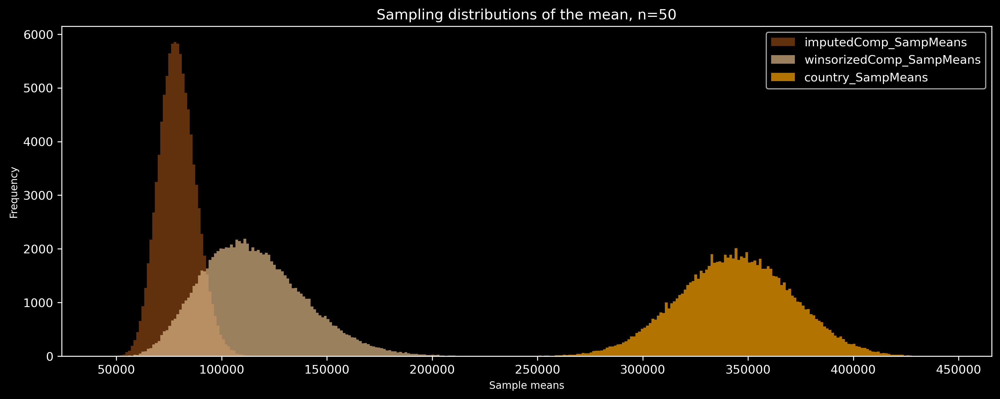

In [2835]:
plot(means50, title='Sampling distributions of the mean, n=50', xlabel='Sample means', 
     ylabel='Frequency', bins=315, figsize=(14,5), nbins=10)

Sample size: 100

In [2335]:
means100, stds100, SEs100 = retrieve_sampling_distributions_of_sample_means_stds_and_SE(
    imputedComp, winsorizedComp, country, sample_size=100, number_of_samples=100000)

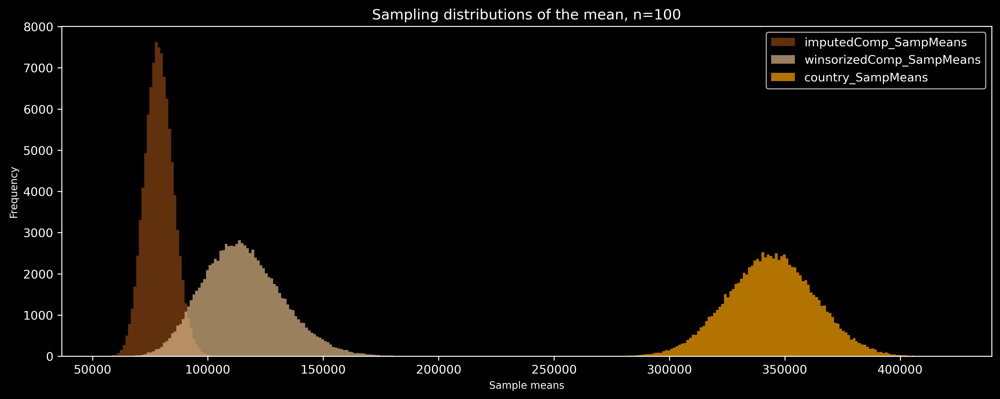

In [2836]:
plot(means100, title='Sampling distributions of the mean, n=100', xlabel='Sample means', 
     ylabel='Frequency', bins=315, figsize=(14,5), nbins=10)

Sample size: 200

In [2433]:
means200, stds200, SEs200 = retrieve_sampling_distributions_of_sample_means_stds_and_SE(
    imputedComp, winsorizedComp, country, sample_size=200, number_of_samples=100000)

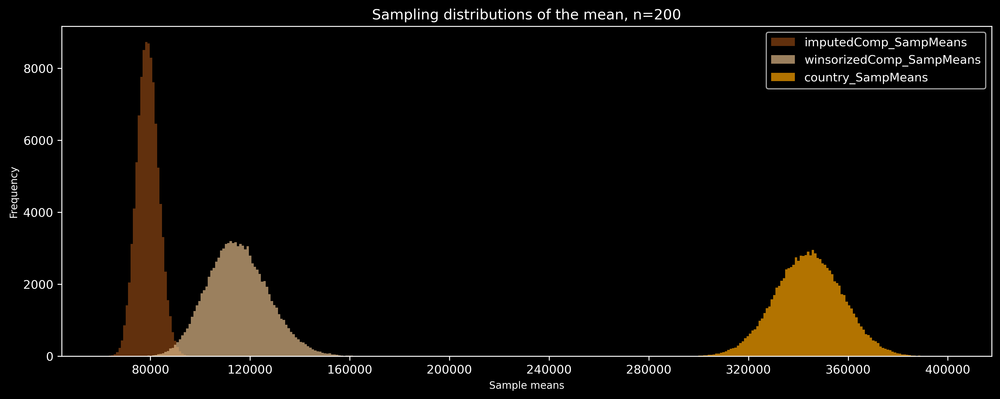

In [2837]:
plot(means200, title='Sampling distributions of the mean, n=200', xlabel='Sample means', 
     ylabel='Frequency', bins=350, figsize=(14,5), nbins=10)

The sampling distribution of Winsorized compensation approximates the normal distribution. However, due to the high skewness and the presence of prominent outliers in the population distribution, a much larger sample size is required for the central limit theorem (CLT) to demonstrate its effect in comparison to the other two variables. In addition, a Q-Q plot indicates that there is still a slight skewness present for this variable. All three sampling distributions are now distinct, with winsorized and imputed compensation sharing only a small proportion of similar sample means. Meanwhile, the sampling distribution of the country variable is clearly separated on the plot. To visualize the increase in the precision of the population mean estimates, below is a plot that compares the sampling distributions of the mean of a country variable with varying sample sizes.

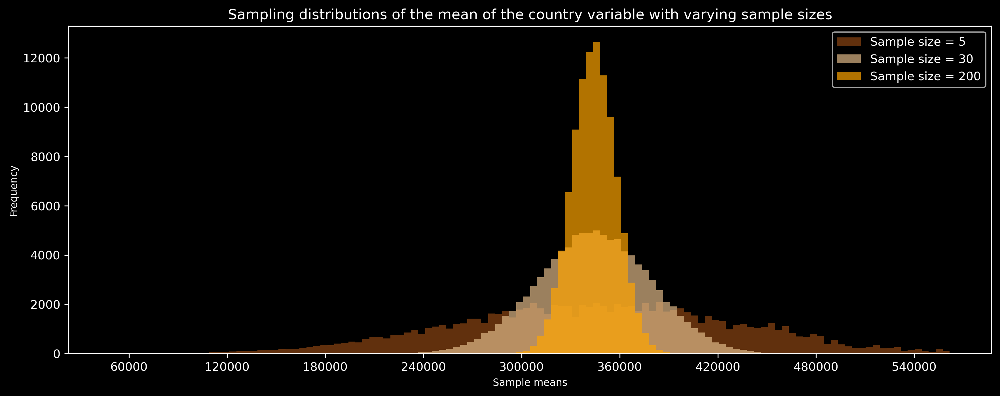

In [2944]:
sampling_dist_different_n = pd.concat([means5.country_SampMeans, means30.country_SampMeans, means200.country_SampMeans], axis=1)
sampling_dist_different_n.columns = ['Sample size = 5', 'Sample size = 30', 'Sample size = 200']
plot(sampling_dist_different_n, title='Sampling distributions of the mean of the country variable with varying sample sizes', xlabel='Sample means', 
     ylabel='Frequency', colors=colors, bins=120, figsize=(14,5), nbins=10)

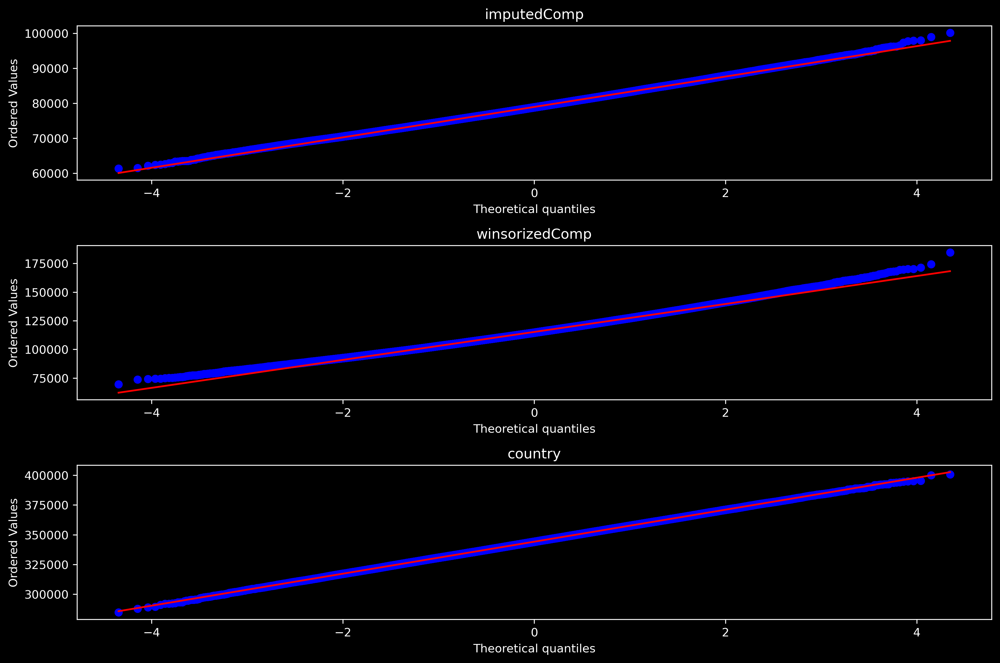

In [2668]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(12, 8))

stats.probplot(means200.iloc[:, 0], dist='norm', plot=axes[0])
axes[0].set_title('imputedComp')

stats.probplot(means200.iloc[:, 1], dist='norm', plot=axes[1])
axes[1].set_title('winsorizedComp')

stats.probplot(means200.iloc[:, 2], dist='norm', plot=axes[2])
axes[2].set_title('country')
plt.tight_layout()
plt.show()

Now let's examine a few examples of sampling distributions of the standard error estimates.

### Sampling distributions of the standard error estimates.

The focus of this section is on the sampling distributions of standard error estimations calculated for three variables: imputedComp, winsorizedComp, and country. Once again, we will generate sampling distributions consisting of 100,000 samples each for sample sizes of 5, 10, 15, 30, 50, 100, and 200.

Sample size: 5

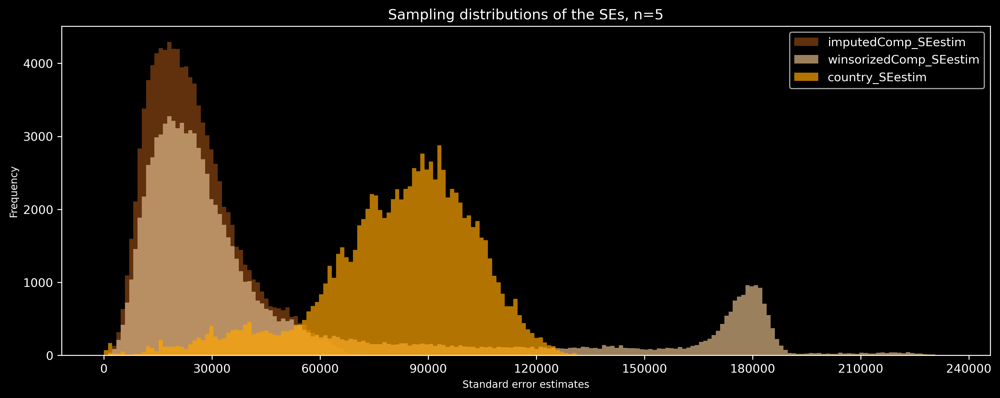

In [2838]:
plot(SEs5, title='Sampling distributions of the SEs, n=5', xlabel='Standard error estimates', 
     ylabel='Frequency', bins=200, figsize=(14,5), nbins=10)

Few of the SE estimates for winsorizedComp variable will closely approximate the theoretical value. However, in the case of bimodal distributions, there may not be a single optimal value that accurately represents the distribution. More generally when dealing with non-normal distributions, using non-robust statistics or relying on the theoretical value of the standard error may not be appropriate. In such cases, robust statistics or a more in-depth analysis could lead to more reliable results.

In this case, the median of the winsorizedComp SE estimates (28102.07) is close to the actual SE (27527.68) of the imputedComp variable. Since both variables share around 95% of the records, the winsorizedComp SE estimate can be more informative than the standard deviation of the sampling distribution of the mean for certain use cases.

Because standard deviations (and therefore standard errors) are more sensitive to extreme values, the negative skew of the country variable is clearly reflected in its sampling distribution of the standard error. The minor mode of the winsorized compensation is also  relatively further from the major mode compared to the sampling distribution of the mean for small sample sizes. 

In [2859]:
print('The median of the winsorizedComp standard error estimates:', round(SEs5.median()[1],2))

The median of the winsorizedComp standard error estimates: 28102.07


In [2876]:
SEs5_SD = SEs5.std().to_frame()
SEs5_SD.columns = ['SD']
print('Variability in the sampling distributions of standard error estimates assessed for each variable:\n')
SEs5_SD

Variability in the sampling distributions of standard error estimates assessed for each variable:



,SD
imputedComp_SEestim,12216.48
winsorizedComp_SEestim,55680.38
country_SEestim,21342.31


In [2864]:
pd.concat([means5, SEs5], axis=1).corr().iloc[3:,:3]

,imputedComp_SampMeans,winsorizedComp_SampMeans,country_SampMeans
imputedComp_SEestim,0.68,0.00,0.00
winsorizedComp_SEestim,-0.00,0.93,0.00
country_SEestim,0.00,-0.00,-0.20


The sample means and standard error estimates of both compensation variables are highly positively correlated, as extreme values increase both sample means and standard error.  This results in samples with means higher than the population means of these variables being typically associated with higher uncertainty additionaly to being less representative, as we saw before. For the country variable, a negative correlation is observed between sample means and standard error estimates. This difference in correlation is due to the negative skewness of this variable, compared to the positive skewness observed for imputedComp and winsorizedComp. 

Sample size: 10

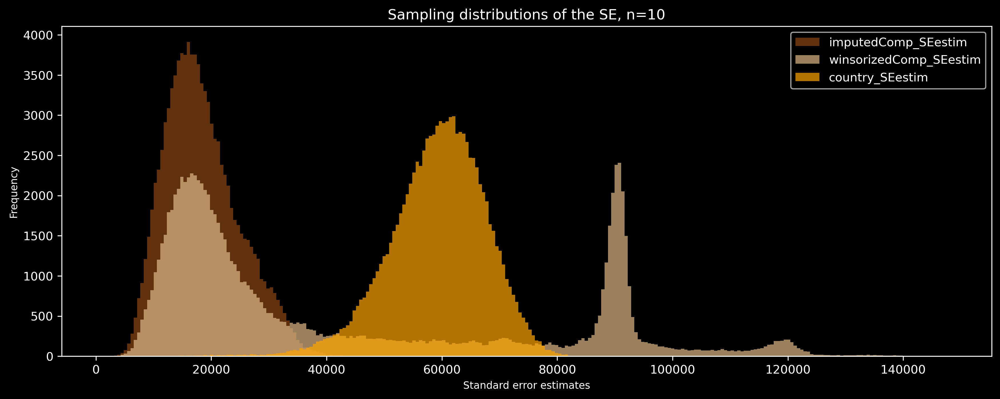

In [2865]:
plot(SEs10, title='Sampling distributions of the SE, n=10', xlabel='Standard error estimates', 
     ylabel='Frequency', bins=255, figsize=(14,5), nbins=10)

The standard deviations are decreasing, as evidenced by the scale. Simultaneously, the second peak for the "winsorizedComp" variable is increasing, and a third peak is starting to emerge. This is due to the higher likelihood of selecting more than one clipped outlier as the sample size increases. Additionally, there are two narrow 'bridges' connecting the peaks, which are a result of other outliers that were imputed in the second compensation variable.

Sample size: 15

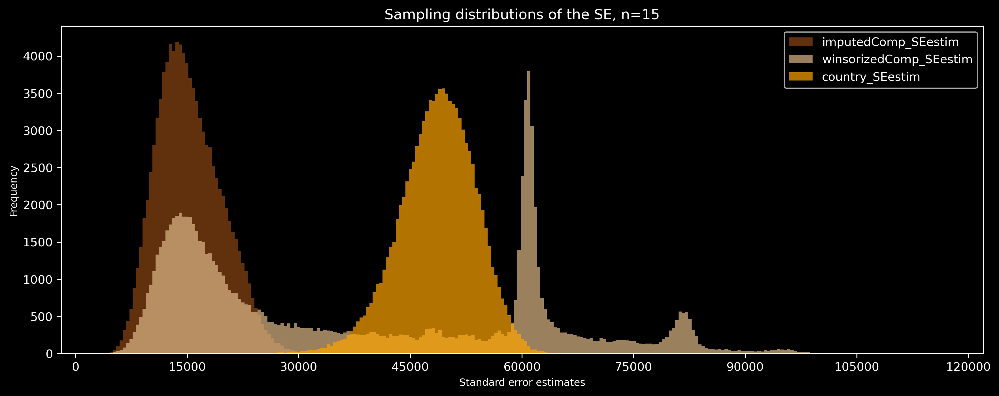

In [2866]:
plot(SEs15, title='Sampling distributions of the SE, n=15', xlabel='Standard error estimates', 
     ylabel='Frequency', bins=255, figsize=(14,5), nbins=10)

Sample size: 20

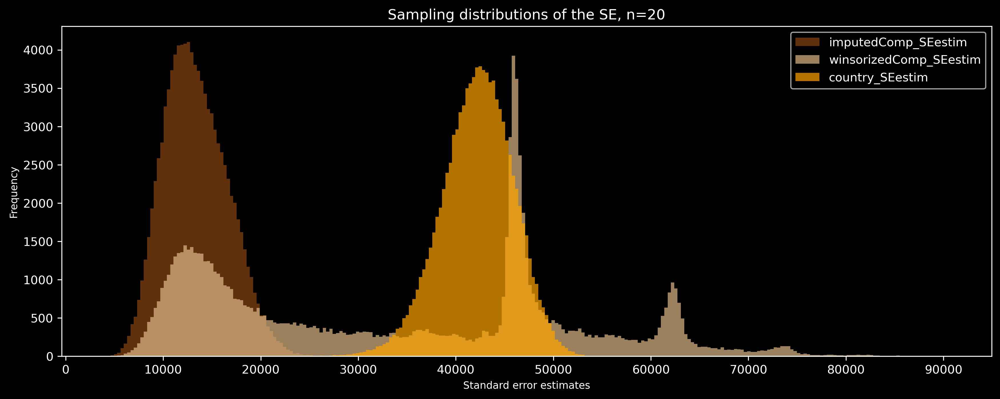

In [2867]:
plot(SEs20, title='Sampling distributions of the SE, n=20', xlabel='Standard error estimates', 
     ylabel='Frequency', bins=255, figsize=(14,5), nbins=10)

Sample size: 30

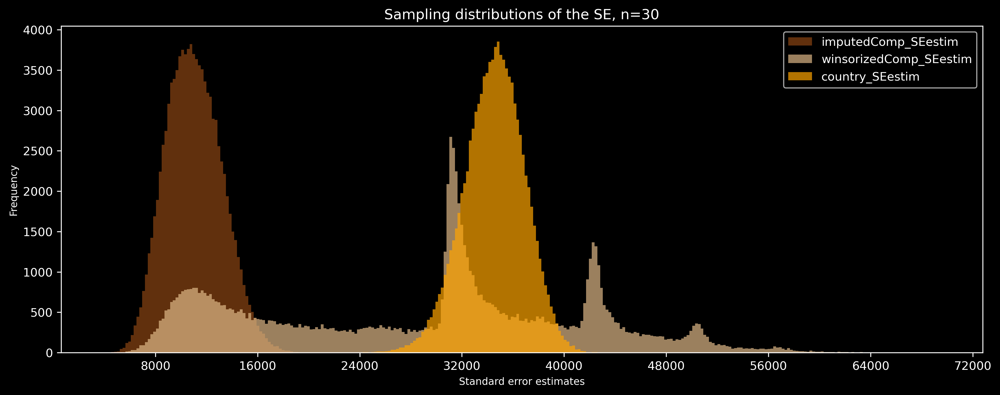

In [2868]:
plot(SEs30, title='Sampling distributions of the SE, n=30', xlabel='Standard error estimates', 
     ylabel='Frequency', bins=300, figsize=(14,5), nbins=10)

The sampling distribution for both imputed compensation and country variables is approximately normal. Regarding the Winsorized Compensation variable, the mode of the distribution is at the population standard error, but it is still spread out with multiple peaks, indicating inconsistency and low precision in the estimates.

Sample size: 50

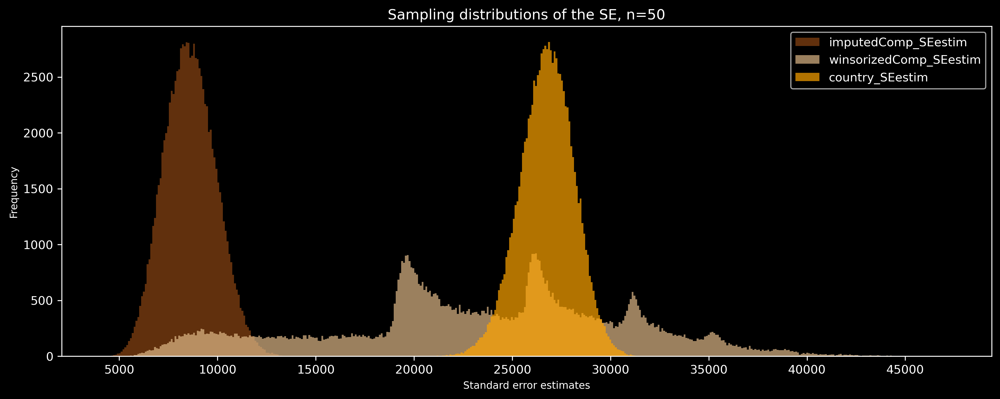

In [2869]:
plot(SEs50, title='Sampling distributions of the SE, n=50', xlabel='Standard error estimates', 
     ylabel='Frequency', bins=455, figsize=(14,5), nbins=10)

Sample size: 100

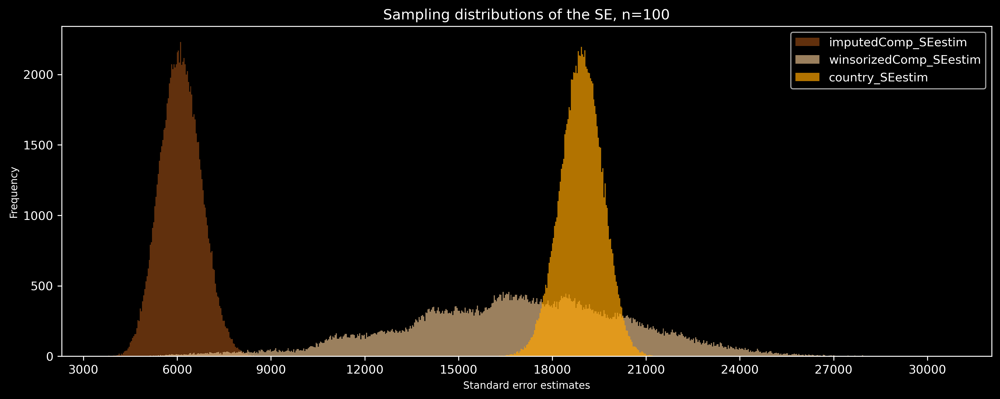

In [2870]:
plot(SEs100, title='Sampling distributions of the SE, n=100', xlabel='Standard error estimates', 
     ylabel='Frequency', bins=755,figsize=(14,5))

Sample size: 200

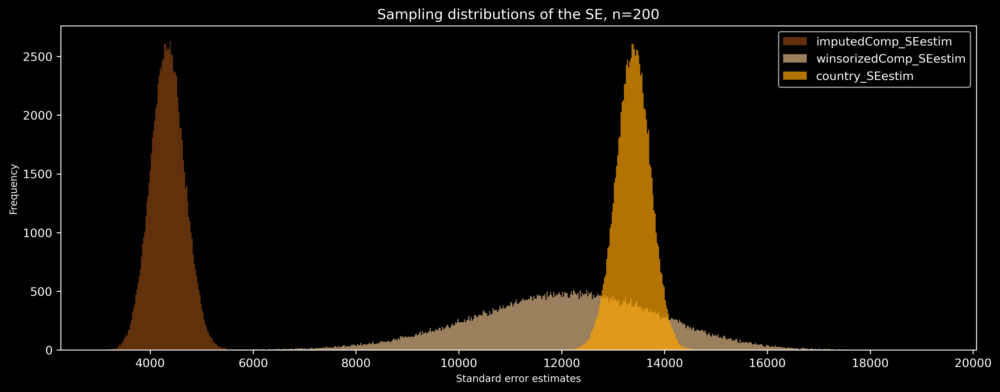

In [2871]:
plot(SEs200, title='Sampling distributions of the SE, n=200', xlabel='Standard error estimates', 
     ylabel='Frequency', bins=755, figsize=(14,5), nbins=10)

The sampling distribution of the standard error estimate for winsorizedComp begins to approach a normal distribution. Although there is much higher variability of SE estimates for this variable. It's important because It can make it difficult to compare results across different studies or samples. If the standard errors vary widely, it can be challenging to determine whether differences in estimated parameters are due to actual differences in the underlying populations or simply due to sampling variability. It can lead to incorrect conclusions about the significance of estimated parameters or the overall results of a study.

As sample size increases, the standard errors of sample distributions tend to become lower and less variable, indicating an improvement in the precision and stability of mean estimation. This trend can be clearly observed in the following plot, which compares the sampling distributions of standard error estimates for different sample sizes.

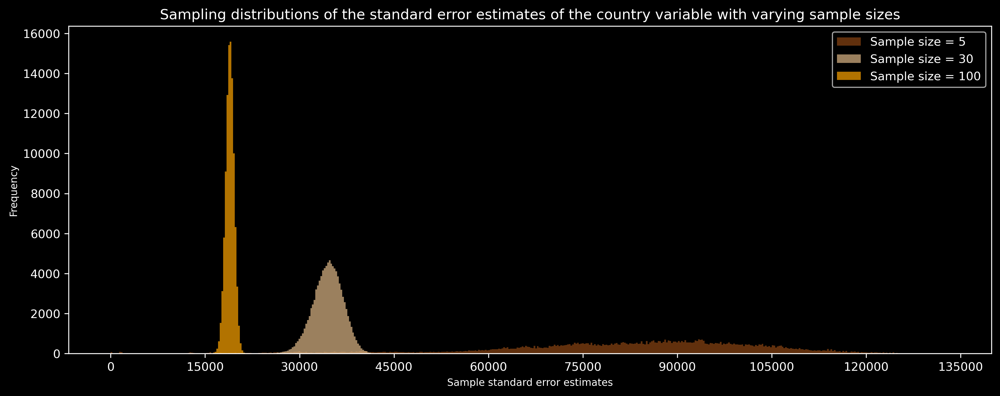

In [2963]:
sampling_dist_different_n = pd.concat([SEs5.country_SEestim, SEs30.country_SEestim, SEs100.country_SEestim], axis=1)
sampling_dist_different_n.columns = ['Sample size = 5', 'Sample size = 30', 'Sample size = 100']
plot(sampling_dist_different_n, title='Sampling distributions of the standard error estimates of the country variable with varying sample sizes', 
     xlabel='Sample standard error estimates', ylabel='Frequency', colors=colors, bins=500, figsize=(14,5), nbins=10)

In the next section we will use different methods to investigate how sampling distributions of the mean and standard errors change in relation to sample sizes, as well as revisit the issue of the standard error as a biased estimator.

## Multiple samling distributions analysis. Are sample mean and sample standard deviation unbiased estimators? A visualization.

To sum up, we started by examining a single `sample` and then moved on to analyzing `the sampling distributions`, which consist of many random samples. Now, we are taking a wider view by exploring the statistical properties of `sequences of sampling distributions` that increase in sample size.

In this section we will generate multiple sampling distributions of the mean and standard error, using different sample sizes for our three variables of interest. Also we will calculate means and standard deviations for each sampling distribution and plot the results to examine if there are trends in the data.

We will start by generating 200 sampling distributions, each containing 50,000 estimations of sample means and standard errors. The sample size will begin at 2 and increase by 1 after each iteration. We will compute the mean and standard deviation for each of the sampling distributions of the mean and standard error estimates and save them in separate variables.

In [1696]:
reset_sampling_distributions_statistics()

In [1697]:
Generate_multiple_sampling_distributions_and_calculate_statistics(
    imputedComp, iterations=199, start_sample_size=2, start_sample_num=50000, 
    increment=True, step=1, sample_size_step=1)

100%|██████████| 149/149 [19:10<00:00,  7.72s/it]


### Sampling distributions of the mean.

To start, we will examine how means of distributions of sample means change as the sample size increases.

In [1660]:
# Retrieving statistics of sampling distributions.
sample_means_stats = get_sampling_distributions_statistics()

In [2344]:
sample_means_stats

imputedComp_SampMeans_mean  \
num_of_samples samp_size                               
50000          2                            78851.65   
               3                            78573.95   
               4                            78896.11   
...                                              ...   
               198                          78937.75   
               199                          78948.36   
               200                          78969.10   

                          winsorizedComp_SampMeans_mean  \
num_of_samples samp_size                                  
50000          2                              114968.64   
               3                              115784.39   
               4                              115771.51   
...                                                 ...   
               198                            115258.68   
               199                            115243.47   
               200                            115152.73   

                          country_SampMeans_mean  imputedComp_SampMeans_std  \
num_of_samples samp_size                                                      
50000          2                       344212.07                   43823.88   
               3                       343699.61                   35264.68   
               4                       344210.87                   30740.81   
...                                          ...                        ...   
               198                     344292.49                    4386.46   
               199                     344273.75                    4331.28   
               200                     344145.89                    4356.29   

                          winsorizedComp_SampMeans_std  country_SampMeans_std  
num_of_samples samp_size                                                       
50000          2                             121711.49              133966.92  
               3                              99950.21              109676.51  
               4                              87175.22               94988.36  
...                                                ...                    ...  
               198                            12253.63               13416.65  
               199                            12197.44               13434.29  
               200                            12219.77               13350.76  

[199 rows x 6 columns]

In [1661]:
means_of_sampMeans = sample_means_stats.iloc[:,:3]
stds_of_sampMeans = sample_means_stats.iloc[:,3:]

In [1662]:
# Removing from the index information about the number of samples used for sampling distributions generation.
means_of_sampMeans.index = means_of_sampMeans.index.levels[1]
stds_of_sampMeans.index = stds_of_sampMeans.index.levels[1]

To determine whether the means of sampling distributions are unbiased estimators of the population mean, we can plot the means of the sampling distributions for different sample sizes. The population mean for each variable can be represented by a dotted line.

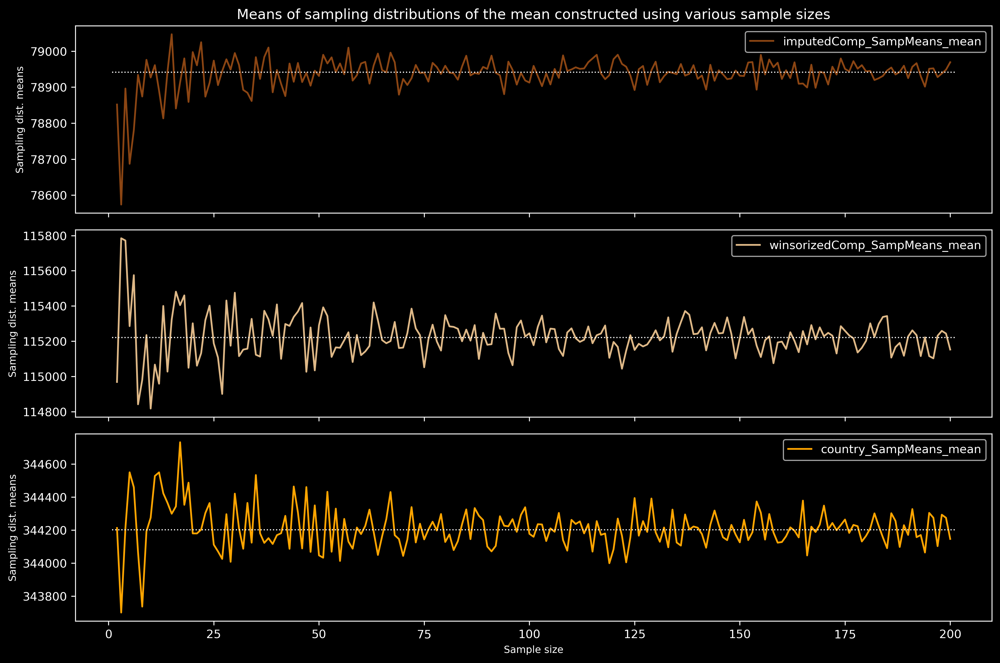

In [2801]:
xlabel = 'Sample size'
ylabel = 'Sampling dist. means'

fig, (ax0, ax1, ax2) = plt.subplots(3, 1, sharex=True, figsize=(12, 8))

means_of_sampMeans.iloc[:,0].plot( color=colors[0], ax=ax0, legend=True)
ax0.axhline(y=df.imputedComp.mean(), xmin=0.04, xmax=0.96, color='white', linewidth=1, linestyle=':')
ax0.set_ylabel(ylabel, size=labelsize)
ax0.set_title('Means of sampling distributions of the mean constructed using various sample sizes') 

means_of_sampMeans.iloc[:,1].plot(color=colors[1], ax=ax1, legend=True)
ax1.axhline(y=df.winsorizedComp.mean(), xmin=0.04, xmax=0.96, color='white', linewidth=1, linestyle=':')
ax1.set_ylabel(ylabel, size=labelsize)

means_of_sampMeans.iloc[:,2].plot(color=colors[2], ax=ax2, legend=True)
ax2.axhline(y=df.country.mean(), xmin=0.04, xmax=0.96, color='white', linewidth=1, linestyle=':')

ax2.set_xlabel(xlabel, size=labelsize)
ax2.set_ylabel(ylabel, size=labelsize)
plt.tight_layout()
plt.show();

In [1664]:
popMeans = df.mean().to_frame().T
popMeans.index = ['population mean']
popMeans

,imputedComp,winsorizedComp,country
population mean,78941.12,115220.27,344200.78


Sampling distribution means cluster tightly around the population mean. There has been no systematic underestimation or overestimation observed, regardless of the shape of the population distribution. Notably, the mean value of the sampling distribution for the imputedComp variable stands out slightly when the sample size is 3. It will be used as another example of hypothesis testing in the next section when discussing confidence intervals.

With larger sample sizes, the means of the estimated sampling distributions become more precise. According to the Law of Large Numbers and the Central Limit Theorem, even the sampling distributions of smaller sample sizes would approach the true population mean with an adequate number of samples. Here is an example of the sampling distribution of the "imputedComp" variable consisting of ten million means. The sample size is 3. 

In [1742]:
means10mln, stds10mln, ses10mln  = retrieve_sampling_distributions_of_sample_means_stds_and_SE(imputedComp, sample_size=3, number_of_samples=10000000)

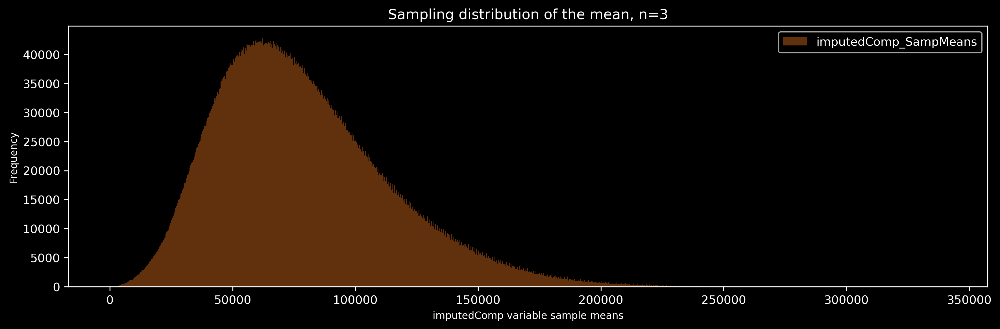

The mean of sampling distribution obtained by calculating 10,000,000 sample means of imputedComp variable:

Distribution mean: 78939.63 (SD = 35537.4)   
Population mean: 78941.12 (true SE = 35538.09)


In [2347]:
plot(means10mln, bins=1000, title='Sampling distribution of the mean, n=3',
     xlabel='imputedComp variable sample means',ylabel='Frequency')
SEimputedComp3 = true_standard_error_calculations(3,imputedComp).iat[0,0]
print(f'''The mean of sampling distribution obtained by calculating 10,000,000 sample means of imputedComp variable:\n
Distribution mean: {round(means10mln.mean().iloc[0], 2)} (SD = {round(means10mln.std().iloc[0], 2)})   
Population mean: {round(imputedComp_popMean, 2)} (true SE = {round(SEimputedComp3, 2)})''')

We will conclude by comparing the average of the means derived from 200 different sampling distributions, each with varying sample sizes, to the actual population means.

In [2877]:
print('The percentage change between the average of means of sampling distributions of the mean and population means:\n')
print(f'For imputedComp {round((meansMean.iat[0,0]-popMeans.iat[0,0]) / popMeans.iat[0,0] * 100, 5)} %')
print(f'For winsorizedComp {round((meansMean.iat[0,1]-popMeans.iat[0,1]) / popMeans.iat[0,1] * 100, 5)} %')
print(f'For country {round((meansMean.iat[0,2]-popMeans.iat[0,2]) / popMeans.iat[0,2] * 100, 5)} %')

The percentage change between the average of means of sampling distributions of the mean and population means:

For imputedComp -0.00556 %
For winsorizedComp 0.00485 %
For country 0.00313 %


When sample is taken at random a sample mean is an unbiased estimator for the population mean.

### Sampling distributions of the Standard error.

In this section, we will compare the standard deviations of the sampling distributions of the mean with the standard errors calculated using population data and SE estimates. This comparison will help us better understand how the accuracy of the standard error estimates changes depending on the distribution of the population and the size of the sample. By examining these differences, we can gain insight into the factors that affect the precision of statistical estimates.

Let's review the formula for standard error:

${\displaystyle {\sigma }_{\bar {x}}\ ={\frac {\sigma }{\sqrt {n}}}}.$

Our approach will begin by comparing the theoretical standard deviation of the mean, calculated using population data, with the standard errors obtained by simulating sampling distributions across various samples.

#### Evaluating the agreement between the expected standard errors and the empirical standard deviations in sampling distributions.

In [1472]:
stds_of_sampMeans

,impCompensation_SampMeans_std,winsCompensation_SampMeans_std,country_SampMeans_std
samp_size,,,
2,55889.65,155920.58,134037.54
3,50906.37,141496.36,109402.46
4,45955.29,129336.43,94502.97
...,...,...,...
198,6113.59,17073.29,13420.55
199,6094.75,16977.41,13490.60
200,6043.01,16923.26,13449.56


In [2349]:
# data preparation
stds_for_merge = stds_of_sampMeans.copy()
display(6)
true = true_standard_error_calculations(200, imputedComp, winsorizedComp, country, as_range=True, range_start=2)
true.index.name = 'samp_size'
theoretical_and_observed_SE = pd.merge(left=stds_for_merge, right=true, on='samp_size')
theoretical_and_observed_SE

,imputedComp_SampMeans_std,winsorizedComp_SampMeans_std,country_SampMeans_std,imputedComp_SE,winsorizedComp_SE,country_SE
samp_size,,,,,,
2,43823.88,121711.49,133966.92,43525.09,121913.55,133949.34
3,35264.68,99950.21,109676.51,35538.09,99542.00,109369.18
4,30740.81,87175.22,94988.36,30776.88,86205.90,94716.49
...,...,...,...,...,...,...
198,4386.46,12253.63,13416.65,4374.44,12252.77,13462.42
199,4331.28,12197.44,13434.29,4363.43,12221.95,13428.55
200,4356.29,12219.77,13350.76,4352.51,12191.35,13394.93


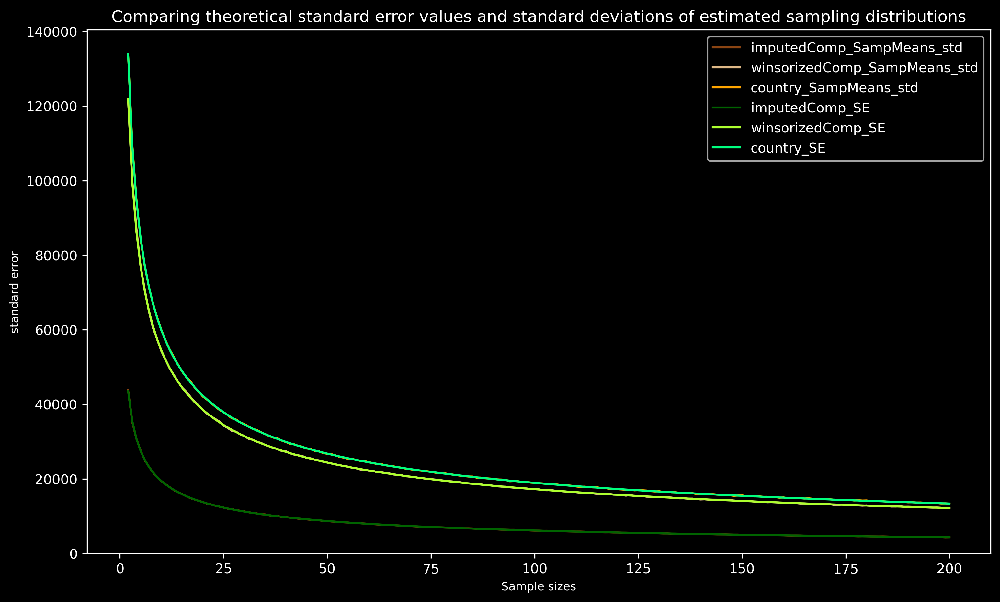

In [3032]:
theoretical_and_observed_SE.plot(color=colors, figsize=(12,7))
plt.ylim(ymin=0)
plt.title('Comparing theoretical standard error values and standard deviations of estimated sampling distributions')
plt.ylabel('standard error', size=labelSize)
plt.xlabel('Sample sizes', size=labelSize) ;

The observed standard error closely matches the theoretical values, as indicated by three pairs of overlapping variables. The standard error values exhibit a sharp decline up to a sample size of 10 for the imputedComp variable and around 25 for the other two variables. Beyond these points, the decline becomes less significant. This pattern occurs because as the sample size increases, the standard error of the mean decreases at a rate proportional to the square root of the sample size. For instance, increasing the sample size by a factor of 4 results in a 2-fold decrease in the standard error, while a 25-fold increase reduces the standard error by a factor of 5.

Let's egzamine a little bit closer one of the variables and calculate the mean difference between theoretical and observed SE values.

In [1674]:
dif = (theoretical_and_observed_SE.winsorizedComp_SE.mean() - theoretical_and_observed_SE.winsorizedComp_SampMeans_std.mean())\
/ theoretical_and_observed_SE.winsorizedComp_SE.mean() * 100
print(f'''The difference between the theoretical SE and the observed standard deviations of sampling distributions of the mean for the winsorizedComp variable:
{round(dif,4)} %''')

The difference between the theoretical SE mean and the observed SE mean for winsorizedComp variable:
-0.0254 %


#### Comparison of the theoretical values of standard errors to aggregates of SE values estimated based on sample data.

In an earlier part of the analysis, we concluded that the standard error estimated based on the standard deviation of a sample was a biased estimator of the true standard error of the mean. Here, we revisit this issue and investigate under what conditions and to what degree underestimation is present. Additionally, we will examine how the variability of sample distributions of standard error estimations changes with sample size.

In [1675]:
sample_SE_estimations_stats = get_sampling_distributions_statistics_for_SE()

In [2238]:
sample_SE_estimations_stats

imputedComp_SEestim_mean  \
num_of_samples samp_size                             
50000          2                          32334.98   
               3                          29373.56   
               4                          26821.09   
...                                            ...   
               198                         4361.65   
               199                         4348.55   
               200                         4339.53   

                          winsorizedComp_SEestim_mean  country_SEestim_mean  \
num_of_samples samp_size                                                      
50000          2                             64269.54             107079.89   
               3                             60820.21              99143.34   
               4                             56772.05              89811.48   
...                                               ...                   ...   
               198                           12122.95              13456.40   
               199                           12096.38              13424.63   
               200                           12051.30              13393.97   

                          imputedComp_SEestim_std  winsorizedComp_SEestim_std  \
num_of_samples samp_size                                                        
50000          2                         29219.28                   103579.36   
               3                         19538.75                    79611.95   
               4                         15087.28                    65411.15   
...                                           ...                         ...   
               198                         334.43                     1791.83   
               199                         330.95                     1782.14   
               200                         330.50                     1775.08   

                          country_SEestim_std  
num_of_samples samp_size                       
50000          2                     81239.93  
               3                     45881.54  
               4                     29898.37  
...                                       ...  
               198                     333.59  
               199                     334.73  
               200                     332.61  

[199 rows x 6 columns]

In [1676]:
means_of_SE_estimations = sample_SE_estimations_stats.iloc[:,:3]
stds_of_SE_estimations = sample_SE_estimations_stats.iloc[:,3:]

In [2362]:
# data preparation
SEs_for_merge = means_of_SE_estimations.copy()
SEs_for_merge.index = means_of_SE_estimations.index.levels[1]

true = true_standard_error_calculations(200, imputedComp, winsorizedComp, country, as_range=True, range_start=2)
true.index.name = 'samp_size'
theoretical_and_estimated_SE = pd.merge(left=SEs_for_merge, right=true, on='samp_size')
theoretical_and_estimated_SE

,imputedComp_SEestim_mean,winsorizedComp_SEestim_mean,country_SEestim_mean,imputedComp_SE,winsorizedComp_SE,country_SE
samp_size,,,,,,
2,32334.98,64269.54,107079.89,43525.09,121913.55,133949.34
3,29373.56,60820.21,99143.34,35538.09,99542.00,109369.18
4,26821.09,56772.05,89811.48,30776.88,86205.90,94716.49
...,...,...,...,...,...,...
198,4361.65,12122.95,13456.40,4374.44,12252.77,13462.42
199,4348.55,12096.38,13424.63,4363.43,12221.95,13428.55
200,4339.53,12051.30,13393.97,4352.51,12191.35,13394.93


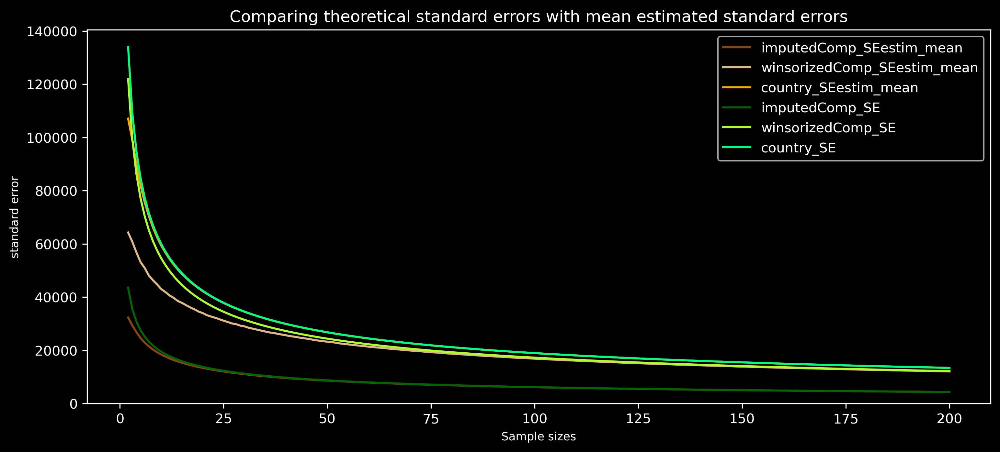

In [3033]:
theoretical_and_estimated_SE.plot(color=colors, figsize=(12,5))
plt.title('Comparing theoretical standard errors with mean estimated standard errors')
plt.ylabel('standard error', size=labelSize)
plt.xlabel('Sample sizes', size=labelSize)
plt.ylim(ymin=0);

We can observe discrepancies between means of estimated standard errors and theoretical values in the plotted data. To investigate this further, let's separate the variables and limit the range of sample sizes.

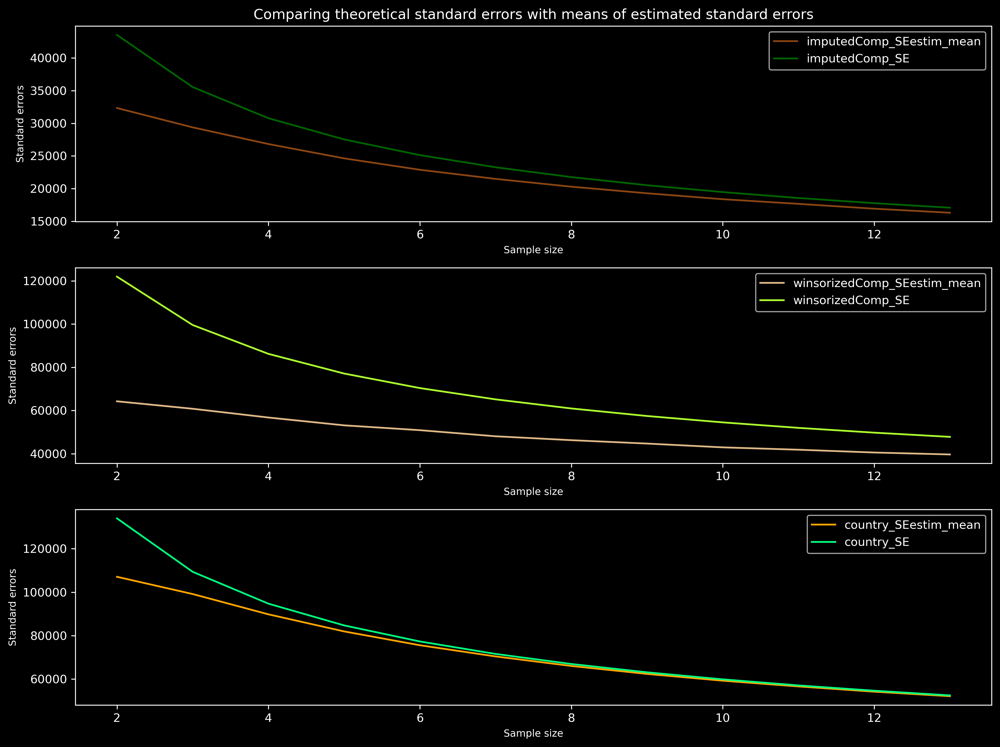

In [2969]:
fig, (ax0, ax1, ax2) = plt.subplots(3, 1, figsize=(12, 9))

theoretical_and_estimated_SE.iloc[:12,[0,3]].plot( color=colors[0::3], ax=ax0, legend=True)
ax0.set_xlabel('Sample size', size=labelsize)
ax0.set_ylabel('Standard errors', size=labelsize)
ax0.set_title('Comparing theoretical standard errors with means of estimated standard errors') 

theoretical_and_estimated_SE.iloc[:12,[1,4]].plot(color=colors[1::3], ax=ax1, legend=True)
ax1.set_xlabel('Sample size', size=labelsize)
ax1.set_ylabel('Standard errors', size=labelsize)

theoretical_and_estimated_SE.iloc[:12,[2,5]].plot(color=colors[2::3], ax=ax2, legend=True)
ax2.set_xlabel('Sample size', size=labelsize)
ax2.set_ylabel('Standard errors', size=labelsize)
plt.tight_layout()
plt.show();

We will calculate and plot the differences between the mean estimated standard errors and the corresponding theoretical values.

In [1678]:
# creating a DataFrame containing the data about the differences.
SE_theoretical_estimated_diff = pd.DataFrame()
SE_theoretical_estimated_diff['imputedComp_SE_difference'] = (theoretical_and_estimated_SE.iloc[:,0] - theoretical_and_estimated_SE.iloc[:,3])
SE_theoretical_estimated_diff['winsorizedComp_SE_difference'] = (theoretical_and_estimated_SE.iloc[:,1] - theoretical_and_estimated_SE.iloc[:,4])
SE_theoretical_estimated_diff['country_SE_difference'] = (theoretical_and_estimated_SE.iloc[:,2] - theoretical_and_estimated_SE.iloc[:,5])

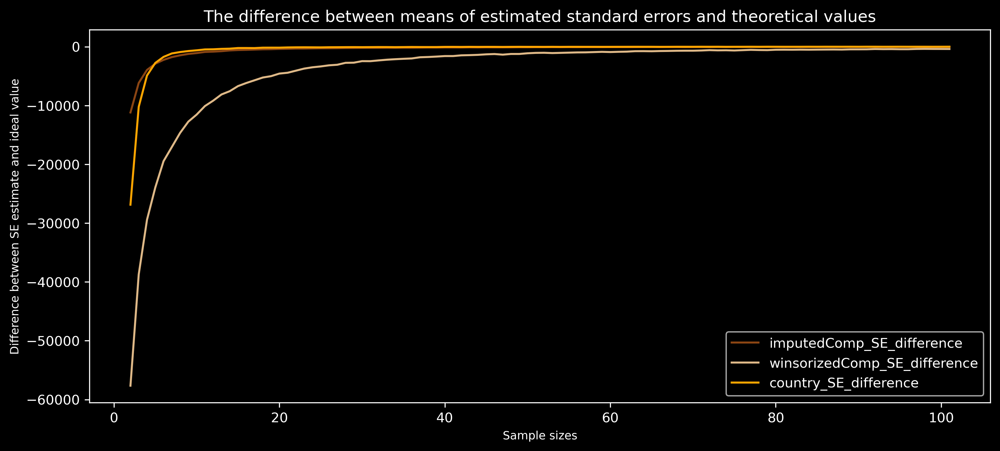

In [2401]:
SE_theoretical_estimated_diff.iloc[:100].plot(color=colors, figsize=(12,5));
plt.title('The difference between means of estimated standard errors and theoretical values')
plt.ylabel('Difference between SE estimate and ideal value', size=labelSize)
plt.xlabel('Sample sizes', size=labelSize) ;

A notable differences exist between the theoretical standard errors and the average estimated SEs. However, as the sample size increases, the degree of underestimation weakens and the estimated standard errors asymptotically approach the actual values. Although the number of observations needed for this to happen differs depending on the shape of the population distribution.

Before we wrap up this section of the presentation, it would be informative to see how the variability of sample distributions of standard error estimates changes with sample size.

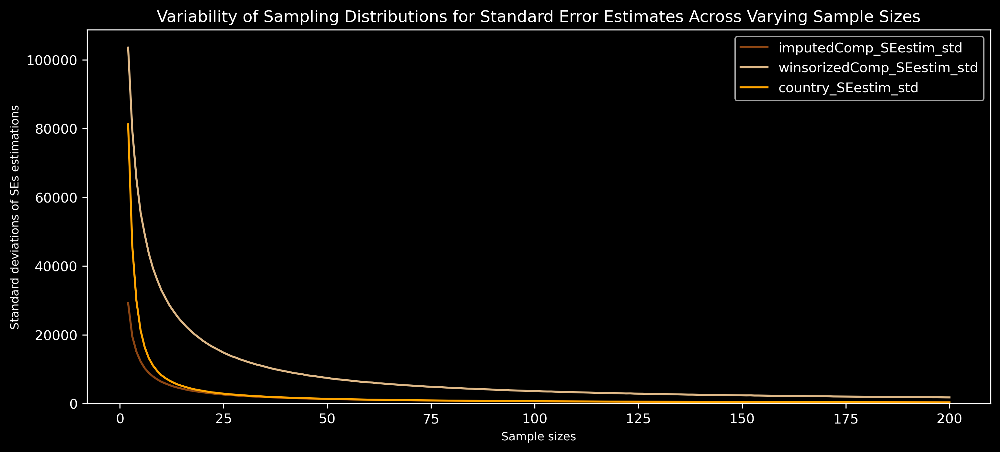

In [3044]:
stds_of_SE_estimations.plot(color=colors, figsize=(12,5))
plt.title('Variability of Sampling Distributions for Standard Error Estimates Across Varying Sample Sizes')
plt.ylabel('Standard deviations of SEs estimations', size=labelSize)
plt.xlabel('Sample sizes', size=labelSize)
plt.ylim(ymin=0);

Overall, we can observe a similar trend as with the standard errors of the means. We can see that the variability of the sampling distributions for standard error estimates is especially high for small sample sizes. While the variables 'country' and 'winsorizedComp' have similar standard errors, there is much higher variability in the SE estimates for the winsorizedComp variable. This increased variability results in significantly lower precision in the SE estimation for winsorizedComp compared to other variables. However, this disproportion tends to subside with larger sample sizes when the variability of SE estimations becomes miniscule. Our observations suggest that increasing sample sizes result in more precise SE estimates, which is particularly important for variables with high variability like 'winsorizedComp'.

`In summary`, a systematic underestimation of the standard error of the mean can be observed, especially for smaller sample sizes. The more the population distribution is skewed and the more  extreme values it contains, the higher the bias.

However, there are ways to mitigate this issue, which depend on the type of distribution. For a normal distribution, a rule of thumb is to calculate the standard deviation using $n-1.5$ instead of $n-1$ in the denominator:

${\displaystyle {\hat {\sigma }}={\sqrt {{\frac {1}{n-1.5}}\sum _{i=1}^{n}(x_{i}-{\overline {x}})^{2}}}}$

As a side note Bessel's correction (the use of n−1 instead of n)
in the formula for the sample variance is enough to corrects the bias in the estimation of the population variance. Only the square root of the sample variance is an underestimate.
 
As sample size increases, the need for the correction of SE estimation becomes less significant (although it depends on a distribution). However, it can be useful for smaller samples. In addition, when performing hypothesis testing with smaller sample sizes and unknown population variance, it's recommended to use t-statistics with a null distribution that has heavier tails than the normal distribution. 

Another important consideration is to report and take into account the confidence intervals associated with a given measurement. We will take a closer look at confidence intervals in the next section.

## Confidence intervals.

Reporting a point estimate is unlikely to precisely match the population parameter. Confidence intervals provide a measure of the precision of our estimates and help us assess the uncertainty in our conclusions by providing a range of values that are likely to contain the true population parameter. They are calculated from individual samples and they account for the uncertainty inherent in point estimates by using sampling distributions, standard errors and critical values.


To construct confidence intervals we need to set our confidence level. The confidence level is complementary to the significance level, meaning that they add up to 1. For example, if we set the confidence level at 95%, the corresponding significance level is 0.05. A 95% confidence level means that if we were to take many samples of the same size from the same population and calculate a confidence interval for each sample, approximately 95% of those intervals would contain the true population parameter. 

The more narrow the confidence interval the greater the precision of the estimate. The level of confidence and sample variability are inversely proportional to the precision of the interval estimation. The main way to reduce the widths of confidence intervals is to increase the sample size. 


The confidence interval formula depends on the type of parameter for evaluation. The general form is:

$ CI = Sample\ statistics \pm Margin\ of\ error $

$Margin\ of\ error = Multiplier\  \times  Standard\ error\ estimate $

Multiplier value depends on the set level of confidence.

Confidence intervals can be used in hypothesis testing. In order to illustrate the process, we will revisit the sampling distribution of the imputedComp variable that was generated in the previous section.

### Confidence intervals in hypothesis testing. 

''

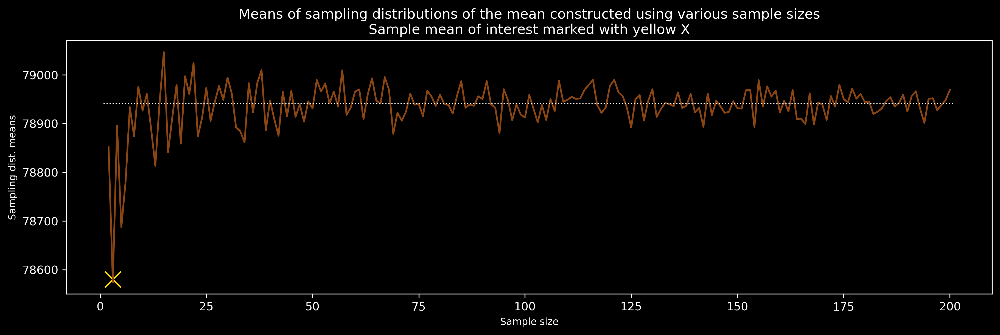

In [2617]:
means_of_sampMeans.iloc[:,0].plot( color=colors[0], figsize=(14.5,4), legend=False)
plt.xlabel('Sample size', size=labelsize)
plt.ylabel('Sampling dist. means', size=labelsize)
plt.scatter([3], [78580], s=(200), marker='x', color="gold");
plt.title('''Means of sampling distributions of the mean constructed using various sample sizes
Sample mean of interest marked with yellow X''') 
plt.axhline(y=df.imputedComp.mean(), xmin=0.04, xmax=0.96, color='white', linewidth=1, linestyle=':')
;

Our goal is to determine if there exists a statistically significant difference between the mean of the sampling distribution of samples with a size of 3 of the imputedComp variable (our sample mean is marked on the plot above with a yellow X) and the population mean of the same variable.

$ {\bar {X}} = 78573.95 $

$  \mu _{0} = 78941.12 $

$n = 50000$

$s = 35264.68$

$\alpha$ $=0.01$

`Null Hypothesis`  :

$ \mu = \mu _{0} $

`Alternate Hypothesis`

$ \mu \neq \mu _{0} $

We will use a confidence interval to test our hypothesis. Based on a large sample we will assume normal distribution of the sample means. The critical value $z$ for $\alpha$ $=0.01$ equals $2.576$ we will use it to construct bounds of the interval.

$CI = ( \bar{x} - 2.576\frac{s}{\sqrt{n}},\ \bar{x} + 2.576\frac{s}{\sqrt{n}} )$

Plugging the numbers:

$CI = ( \bar{x} - 2.576\frac{35264.68}{\sqrt{50000}},\ (\bar{x} + 2.576\frac{35264.68}{\sqrt{50000}} )$

$CI = ( 78168, 78980 )$

The 99% confidence interval represents a range of values that are not statistically significantly different from the point estimate at the 0.01 significance level. Since the null value falls within the calculated range, we did not find enough evidence to reject the null hypothesis for the accepted significance level. 

Calculating the p-value reveals that the probability of obtaining this result assuming the null hypothesis is true is around 2%. It is quite low, but when considering the number of calculations performed in this analysis, it is to be expected that some improbable results will occur due to chance. This issue is related to the multiple comparisons problem. If multiple hypotheses are tested, the probability of observing a rare event increases, and therefore, the likelihood of incorrectly rejecting a null hypothesis (i.e., making a Type I error) is greater. In some cases, it is important to take this into consideration. There are tools that are designed to solve this problem, such as Bonferroni or Sidak corrections.

#### The effects of critical values on confidence intervals.

Both the t-value and the z-value can be used when the conditions for a normal distribution of point estimates are met. However, the t-distribution has thicker tails to compensate for standard error estimation, which as we showed earlier, underestimates the true standard error for smaller sample sizes.
We will demonstrate how the selection of a test distribution can affect our estimations by calculating the 95% confidence intervals for the mean of a random sample of size 30 drawn from a country variable using both a t-value and a z-value. To represent the results we will create a histogram with the suitable sampling distribution and mark the sample mean and confidence interval bounds on it.

In this case a CI formulas are as follows:

$ CI = (\bar{x} - {t}\frac{s}{\sqrt{n}},\ \bar{x} + {t}\frac{s}{\sqrt{n}})$

$ CI = (\bar{x} - {z}\frac{s}{\sqrt{n}},\ \bar{x} + {z}\frac{s}{\sqrt{n}})$

To compare the effect of the test statistics, we will use estimated standard errors in both cases while holding all other variables constant.

In [2898]:
sample_size = 30
degrees_of_freedom = sample_size - 1
alpha = 0.05 # for a 95% confidence level
# Calculating the critical t-value using the percent point function
# alpha divided by two due to two tailed test
critical_t_value = scipy.stats.t.ppf(q=1-alpha/2, df=degrees_of_freedom) 
print(f"The critical t-value for a {(1-alpha)*100}% confidence level and {degrees_of_freedom} degrees of freedom is: {round(critical_t_value,3)}")

The critical t-value for a 95.0% confidence level and 29 degrees of freedom is: 2.045


In [2907]:
sample = country.sample(sample_size)
sample_mean = sample.mean()
sample_SE = sample.std() / np.sqrt(sample_size)
# Calculating margin of error using critical t-value
MOE = critical_t_value*sample_SE
lower_CI_limit = sample_mean - MOE
upper_CI_limit = sample_mean + MOE
countryMean = country.mean()

In [2908]:
# Calculating margin of error using critical z-value
z = 1.96 # The critical z-value for 95% confidence level
MOEz = z*sample_SE
lower_CIz_limit = sample_mean - MOEz
upper_CIz_limit = sample_mean + MOEz

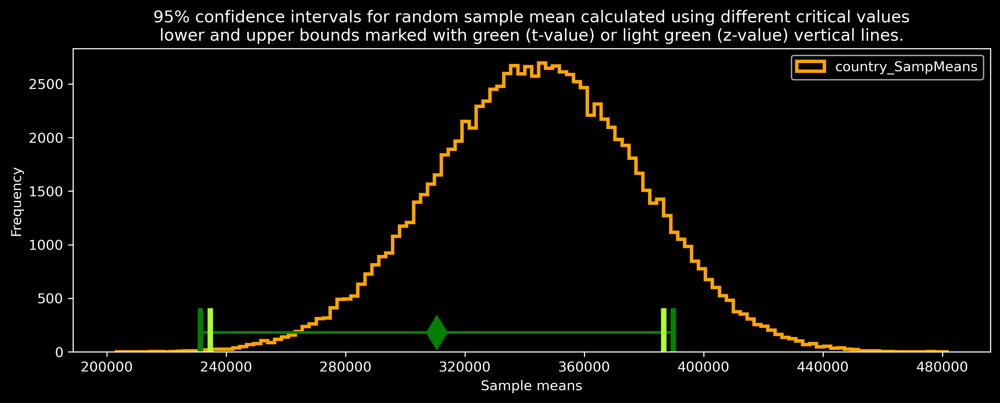


95% confidence interval t:  [231280.96 - 389825.71]

95% confidence interval z:  [234584.43 - 386522.24]

Is country population mean within the confidence intervals range?



True

In [3048]:
distribution = means30.country_SampMeans
distribution.plot.hist(bins=120, color=colors[2], histtype='step', linewidth=2.5)
plt.axhline(y=180, xmin=0.140, xmax=0.65, color='green', linewidth=2)
plt.scatter(x=sample_mean, y=180, s=(300), marker='d', color="green");
plt.axvline(x=lower_CI_limit , ymax=0.135, linewidth=4, color='green')
plt.axvline(x=upper_CI_limit , ymax=0.135, linewidth=4, color='green')
plt.axvline(x=lower_CIz_limit , ymax=0.135, linewidth=4, color='#ADFF2F')
plt.axvline(x=upper_CIz_limit , ymax=0.135, linewidth=4, color='#ADFF2F')
plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.title('''95% confidence intervals for random sample mean calculated using different critical values
lower and upper bounds marked with green (t-value) or light green (z-value) vertical lines.''')
plt.xlabel('Sample means')
plt.ylabel('Frequency')
plt.legend()
plt.show()
print(f'\n95% confidence interval t:  [{round(lower_CI_limit,2)} - {round(upper_CI_limit,2)}]')
print(f'\n95% confidence interval z:  [{round(lower_CIz_limit,2)} - {round(upper_CIz_limit,2)}]\n')

print(f'Is country population mean within the confidence intervals range?\n')
~((countryMean < lower_CIz_limit) | (countryMean > upper_CIz_limit))

### The relationship between distribution shape and the empirical coverage probability of confidence intervals.

As shown above, when constructing a confidence interval, we rely on our understanding of the sampling distribution that corresponds to the sample statistic. Although <a href='https://www.scirp.org/journal/paperinformation.aspx?paperid=76758'>there are methods</a> to calculate confidence intervals for non-normal distributions, intervals based on t or z critical values are only valid if the sampling distribution of the statistic is approximately normal. 

It is worth noting that the confidence level indicates the long-term success rate of the method, i.e., how often this type of interval will capture the parameter of interest. However, for a single experiment, the particular confidence interval either contains the population value or it does not. Therefore, there is no probability associated with it. Instead we can talk about the coverage probability.

`The coverage probability` is the fraction of computed confidence intervals that include the true value of interest and it is based on hypothetical repetitions of the data collection and analysis procedure. The confidence level relates to the nominal coverage probability. The empirical coverage probability is the actual probability that the interval contains the true parameter value. If all assumptions used in deriving a confidence interval are met, the nominal coverage probability will equal the actual coverage probability. If the actual coverage probability is greater than the nominal coverage probability, the interval is conservative; if it is less, the interval is permissive.

In this section we will investigate conditions in which the actual coverage probability differs from the nominal coverage probability. To achieve this we will use multiple simulated samples across three different sample sizes: 10, 30, and 200, while focusing on three variables of interest. For each sample, we will calculate a 95% confidence interval using the t-value. Next, we will estimate the empirical coverage probability of the confidence interval by determining the proportion of samples in which the population mean falls within the interval. Additionally, we will calculate 99% confidence intervals for the computed proportions and test whether they differ from the nominal coverage probability. Furthermore we will evaluate instances where the population mean is not within the interval, assessing if such cases are evenly distributed on both sides of the population parameter. By using graphical representations, we will visualize how confidence intervals are influenced by random sampling, and how this varies across different population distributions.

First I would like to introduce one sample test of proportion that will be used in the analysis.

#### Inference for a Proportion.

Our goal is to estimate the proportion of sample means that lie inside the 95% confidence interval, and to determine if this proportion differs significantly from the expected 95%. To do this, we'll use a one sample test of proportions to estimate the population proportion based on a sample.

Similarly to the sampling distribution of the sample mean, the sampling distribution of the sample proportion provides a way to estimate the population parameter, based on a sample of data. The sample proportion, $\hat{p}$, follows a normal distribution with mean $p$ and standard deviation $\sqrt{\frac{p(1-p)}{n}}$.

$\hat{p} \sim N\left(p,\sqrt{\frac{p(1-p)}{n}}\right)$

The above statement holds if sample size, $n$, is large enough so that the expected number of successes and failures in the sample are both at least 10. 

$np \geq 10\ and\ {n(1-p)} \geq 10 $

Where $np$ is the expected number of successes and $n(1-p)$, is the expected number of failures.

`Null Hypothesis`  :

$ p = p_{0} $

`Alternate Hypothesis`

$ p \neq p_{0} $

We will set our alpha level at 0.01

$\alpha$ $=0.01$

Since our sample sizes and proportion of successes to failures will be large enough, we can use the two-sided z-value to determine the distance between the sample proportion $\hat{p}$ and the null value $p_0$, and to calculate confidence intervals. 

Our formula for the one sample test of proportions:

$ \displaystyle z = \frac{\hat{p} - p_0}{\sqrt{\frac{p_0(1-p_0)}{n}}} $

Confidence intervals:

$ \text{CI}{\text{p}} = \left(\hat{p} - z_{\frac{\alpha}{2}}\sqrt{\frac{\hat{p}(1-\hat{p})}{n}},\ \hat{p} + z_{\frac{\alpha}{2}}\sqrt{\frac{\hat{p}(1-\hat{p})}{n}}\right) $

#### Understanding confidence intervals - sample size of 10.

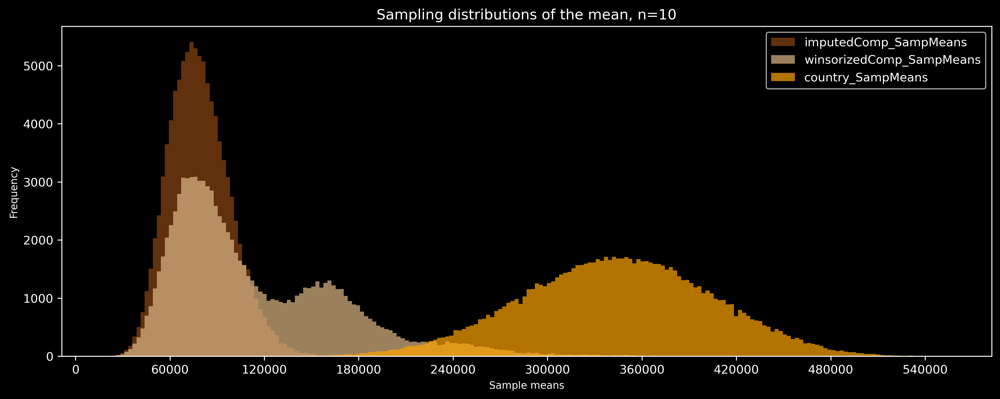

,imputedComp_SampMeans,winsorizedComp_SampMeans,country_SampMeans
skew,0.45,1.18,-0.06
kurtosis,0.25,1.46,-0.14


In [3010]:
plot(means10, title='Sampling distributions of the mean, n=10', xlabel='Sample means', 
     ylabel='Frequency', bins=208, figsize=(14,5))
means10.agg(['skew', 'kurtosis'])

Creating a data frame with sample means and confidence interval bounds for the three variables.

In [2499]:
impMean = df.imputedComp.mean()
winsMean = df.winsorizedComp.mean()
countryMean = df.country.mean()

In [2657]:
degrees_of_freedom = 9
dist_means = means10
dist_SE = SEs10
alpha = 0.05
critical_t_value = scipy.stats.t.ppf(q=1-alpha/2, df=degrees_of_freedom) 
print(f"The critical t-value for a {(1-alpha)*100}% confidence level and {degrees_of_freedom} degrees of freedom is: {round(critical_t_value,3)}")

MOE = pd.DataFrame()
MOE['imputedMeans_MOE'] = critical_t_value*dist_SE.imputedComp_SEestim
MOE['winsorizedMeans_MOE'] = critical_t_value*dist_SE.winsorizedComp_SEestim
MOE['country_MOE'] = critical_t_value*dist_SE.country_SEestim

imputedMeans_lower_bound = dist_means.iloc[:,0] - MOE.iloc[:,0]
imputedMeans_upper_bound = dist_means.iloc[:,0] + MOE.iloc[:,0]
imputedMeans_lower_bound.name = 'imp_lower_bound'
imputedMeans_upper_bound.name = 'imp_upper_bound'

winsorizedMeans_lower_bound = dist_means.iloc[:,1] - MOE.iloc[:,1]
winsorizedMeans_upper_bound = dist_means.iloc[:,1] + MOE.iloc[:,1]
winsorizedMeans_lower_bound.name = 'wins_lower_bound'
winsorizedMeans_upper_bound.name = 'wins_upper_bound'

countryMeans_lower_bound = dist_means.iloc[:,2] - MOE.iloc[:,2]
countryMeans_upper_bound = dist_means.iloc[:,2] + MOE.iloc[:,2]
countryMeans_lower_bound.name = 'country_lower_bound'
countryMeans_upper_bound.name = 'country_upper_bound'

CI_df10 = pd.concat([dist_means, imputedMeans_lower_bound, imputedMeans_upper_bound, winsorizedMeans_lower_bound,
                   winsorizedMeans_upper_bound, countryMeans_lower_bound, countryMeans_upper_bound], axis=1)
NumOfSamples = CI_df10.shape[0]
CI_df10

The critical t-value for a 95.0% confidence level and 9 degrees of freedom is: 2.262


,imputedComp_SampMeans,winsorizedComp_SampMeans,country_SampMeans,imp_lower_bound,imp_upper_bound,wins_lower_bound,wins_upper_bound,country_lower_bound,country_upper_bound
0,105963.20,151095.20,424390.00,31838.57,180087.83,-2526.85,304717.25,268419.36,580360.64
1,99800.30,87190.90,365190.00,36417.60,163183.00,19784.14,154597.66,231386.31,498993.69
2,60995.40,59856.70,170570.00,12594.88,109395.92,38430.78,81282.62,32966.72,308173.28
...,...,...,...,...,...,...,...,...,...
99997,63029.90,78099.50,368520.00,24087.02,101972.78,37368.68,118830.32,213519.83,523520.17
99998,106375.00,74156.70,424760.00,42541.91,170208.09,34207.64,114105.76,315153.36,534366.64
99999,61192.40,80959.00,311170.00,26346.51,96038.29,43425.60,118492.40,180275.28,442064.72


`imputedComp:`

In [3146]:
Outside_ImpCI = CI_df10.query('~((imp_lower_bound <= @impMean) & (imp_upper_bound >= @impMean))').shape[0]
Inside_ImpCI = CI_df10.query('((imp_lower_bound <= @impMean) & (imp_upper_bound >= @impMean))').shape[0]
imp_Sample_Proportion = Inside_ImpCI/NumOfSamples
alpha_p = 0.01
# Calculate the test statistic
test_stat, pval = proportions_ztest(count=Inside_ImpCI, nobs=NumOfSamples, value=(1-alpha), alternative='two-sided', prop_var=(1-alpha))
critical_value = 2.58

# Calculate the confidence intervals
conf_int = proportion_confint(Inside_ImpCI, NumOfSamples, alpha=alpha_p)

print('imputedComp:\n')
print(f'''The empirical coverage probability: {(imp_Sample_Proportion*100):.2f}%  
99% Confidence interval: [ {(conf_int[0]*100):.2f}%, {(conf_int[1]*100):.2f}% ]\n''')
if abs(test_stat) > critical_value:
    print(f'''There is a significant difference between measured proportion {imp_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5}\n''')
else:
    print(f'''There is no significant difference between measured proportion {imp_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5f}\n''')
print(f'''In {round(CI_df10.query("(@impMean > imp_upper_bound)").shape[0]/Outside_ImpCI*100,2)} % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.\n''')

imputedComp:

The empirical coverage probability: 91.65%  
99% Confidence interval: [ 91.43%, 91.88% ]

There is a significant difference between measured proportion 0.917 and expected 0.95.  
Test statistic: -48.549

In 92.97 % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.



`winsorizedComp:`

In [3145]:
Outside_WinsCI = CI_df10.query('~((wins_lower_bound <= @winsMean) & (wins_upper_bound >= @winsMean))').shape[0]
Inside_WinsCI = CI_df10.query('((wins_lower_bound <= @winsMean) & (wins_upper_bound >= @winsMean))').shape[0]
wins_Sample_Proportion = Inside_WinsCI/NumOfSamples
alpha_p = 0.01
# Calculate the test statistic
test_stat, pval = proportions_ztest(count=Inside_WinsCI, nobs=NumOfSamples, value=(1-alpha), alternative='two-sided', prop_var=(1-alpha))
critical_value = 2.58
# Calculate the confidence intervals
conf_int = proportion_confint(Inside_WinsCI, NumOfSamples, alpha=alpha_p)

print('winsorizedComp:\n')
print(f'''The empirical coverage probability: {(wins_Sample_Proportion*100):.2f}%  
99% Confidence interval: [ {(conf_int[0]*100):.2f}%, {(conf_int[1]*100):.2f}% ]\n''')
if abs(test_stat) > critical_value:
    print(f'''There is a significant difference between measured proportion {wins_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5}\n''')
else:
    print(f'''There is no significant difference between measured proportion {wins_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5f}\n''')
print(f'''In {round(CI_df10.query("(@winsMean > wins_upper_bound)").shape[0]/Outside_WinsCI*100,2)} % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.\n''')

winsorizedComp:

The empirical coverage probability: 73.71%  
99% Confidence interval: [ 73.35%, 74.07% ]

There is a significant difference between measured proportion 0.737 and expected 0.95.  
Test statistic: -308.86

In 99.93 % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.



`country:`

In [3147]:
Outside_CountryCI = CI_df10.query('~((country_lower_bound <= @countryMean) & (country_upper_bound >= @countryMean))').shape[0]
Inside_CountryCI = CI_df10.query('((country_lower_bound <= @countryMean) & (country_upper_bound >= @countryMean))').shape[0]
country_Sample_Proportion = Inside_CountryCI/NumOfSamples
alpha_p = 0.01
# Calculate the test statistic
test_stat, pval = proportions_ztest(count=Inside_CountryCI, nobs=NumOfSamples, value=(1-alpha), alternative='two-sided', prop_var=(1-alpha))
critical_value = 2.58
# Calculate the confidence intervals
conf_int = proportion_confint(Inside_CountryCI, NumOfSamples, alpha=0.01)

print('country:\n')
print(f'''The empirical coverage probability: {(country_Sample_Proportion*100):.2f}%  
99% Confidence interval: [ {(conf_int[0]*100):.2f}%, {(conf_int[1]*100):.2f}% ]\n''')
if abs(test_stat) > critical_value:
    print(f'''There is a significant difference between measured proportion {country_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5}\n''')
else:
    print(f'''There is no significant difference between measured proportion {country_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5f}\n''')
print(f'''In {round(CI_df10.query("(@countryMean > country_upper_bound)").shape[0]/Outside_CountryCI*100,2)} % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.\n''')

country:

The empirical coverage probability: 94.31%  
99% Confidence interval: [ 94.12%, 94.50% ]

There is a significant difference between measured proportion 0.943 and expected 0.95.  
Test statistic: -9.9971

In 42.33 % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.



The empirical coverage probability was significantly lower than the nominal coverage probability in all three cases. The extent of the difference was influenced by the shape of the sampling distribution. Intervals became more permissive with increasing kurtosis and skewness. When the confidence intervals did not contain the population mean, they were shifted towards the denser part of the distribution. For right-skewed distributions, the CIs are shifted to the left (with the mean being above the upper bound of the confidence interval), while for left-skewed distributions, the shift is to the right.

Visual representation of a section of sample means and corresponding confidence intervals.

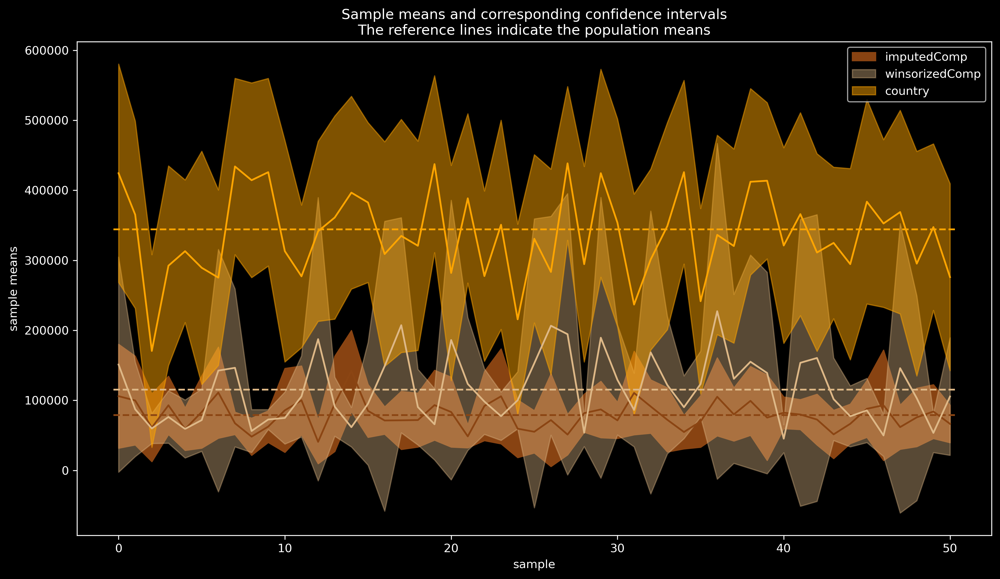

In [3156]:
range_start = 0
range_stop = 50

fig, ax = plt.subplots(figsize=(12,7))

# Subplot imputedComp
sns.lineplot(data=CI_df10.loc[range_start:range_stop], 
             x=CI_df10.loc[range_start:range_stop,'imputedComp_SampMeans'].index, 
             y='imputedComp_SampMeans', 
             color=colors[0], 
             ax=ax)
ax.fill_between(x=range(range_start, range_stop+1), 
                y1=CI_df10.loc[range_start:range_stop,'imp_lower_bound'], 
                y2=CI_df10.loc[range_start:range_stop,'imp_upper_bound'], 
                alpha=0.99,
                label='imputedComp',
                color=colors[0])
ax.axhline(y=df.imputedComp.mean(), 
           xmin=0.04, 
           xmax=0.96, 
           color=colors[0], 
           linestyle='--')
ax.set_ylabel('imputedComp')

# Subplot winsorizedComp
sns.lineplot(data=CI_df10.loc[range_start:range_stop], 
             x=CI_df10.loc[range_start:range_stop,'winsorizedComp_SampMeans'].index, 
             y='winsorizedComp_SampMeans',
             color=colors[1],
             ax=ax)
ax.fill_between(x=range(range_start, range_stop+1), 
                y1=CI_df10.loc[range_start:range_stop,'wins_lower_bound'], 
                y2=CI_df10.loc[range_start:range_stop,'wins_upper_bound'],
                color=colors[1],
                label='winsorizedComp',
                alpha=0.4)
ax.axhline(y=df.winsorizedComp.mean(), 
           xmin=0.04, 
           xmax=0.96, 
           color=colors[1], 
           linestyle='--')

ax.set_ylabel('winsorizedComp')

# Subplot country
sns.lineplot(data=CI_df10.loc[range_start:range_stop], 
             x=CI_df10.loc[range_start:range_stop,'country_SampMeans'].index, 
             y='country_SampMeans', 
             color=colors[2],
             ax=ax)
ax.fill_between(x=range(range_start, range_stop+1), 
                y1=CI_df10.loc[range_start:range_stop,'country_lower_bound'], 
                y2=CI_df10.loc[range_start:range_stop,'country_upper_bound'], 
                color=colors[2],
                label='country',
                alpha=0.5)
ax.axhline(y=df.country.mean(), 
           xmin=0.04, 
           xmax=0.96, 
           color=colors[2], 
           linestyle='--')

ax.legend()
ax.set_xlabel('sample')
ax.set_ylabel('sample means')
ax.set_title('''Sample means and corresponding confidence intervals.
The reference lines indicate the population means.''')
plt.tight_layout()


Although the means of both compensation variables are similar, the estimates for the winsorizedComp variable are evidently less precise. Furthermore, the mean of standard error estimates is very similar for winsorized compensation and country variable, however there is greater variability in the standard error estimations for the winsorizedComp variable.

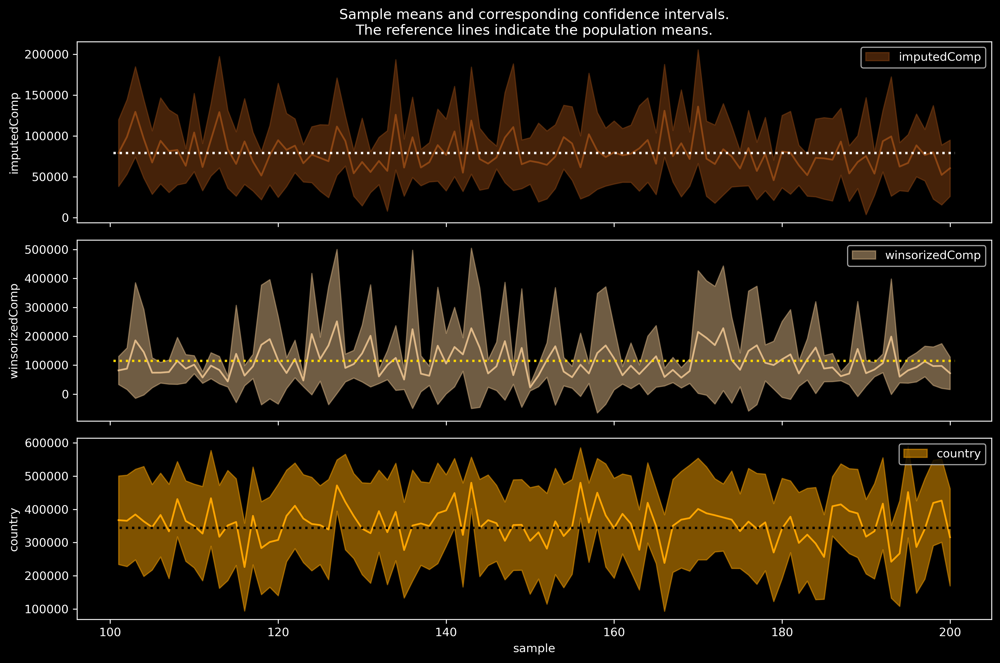

In [3159]:
range_start = 101
range_stop = 200

fig, axs = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(12, 8))

# imputedCompensation
sns.lineplot(data=CI_df10.loc[range_start:range_stop], 
             x=CI_df10.loc[range_start:range_stop,'imputedComp_SampMeans'].index, 
             color=colors[0],  
             y='imputedComp_SampMeans', 
             ax=axs[0])
axs[0].fill_between(x=range(range_start, range_stop+1), 
                    y1=CI_df10.loc[range_start:range_stop,'imp_lower_bound'], 
                    y2=CI_df10.loc[range_start:range_stop,'imp_upper_bound'], 
                    color=colors[0],
                    label='imputedComp',
                    alpha=0.5)
axs[0].axhline(y=df.imputedComp.mean(), 
               xmin=0.04, xmax=0.96, 
               color='white', 
               linewidth=2, 
               linestyle=':')
axs[0].set_title('''Sample means and corresponding confidence intervals.
The reference lines indicate the population means.''')
axs[0].set_ylabel('imputedComp')
axs[0].legend()

# winsorizedCompensation
sns.lineplot(data=CI_df10.loc[range_start:range_stop], 
             x=CI_df10.loc[range_start:range_stop,'winsorizedComp_SampMeans'].index, 
             y='winsorizedComp_SampMeans', 
             color=colors[1], ax=axs[1])
axs[1].fill_between(x=range(range_start, range_stop+1), 
                    y1=CI_df10.loc[range_start:range_stop,'wins_lower_bound'], 
                    y2=CI_df10.loc[range_start:range_stop,'wins_upper_bound'], 
                    color=colors[1],
                    label='winsorizedComp',
                    alpha=0.5)
axs[1].axhline(y=df.winsorizedComp.mean(), 
               xmin=0.04, 
               xmax=0.96, 
               color='gold', 
               linewidth=2, 
               linestyle=':')
axs[1].set_ylabel('winsorizedComp')
axs[1].legend()


# country
sns.lineplot(data=CI_df10.loc[range_start:range_stop], 
             x=CI_df10.loc[range_start:range_stop,'country_SampMeans'].index,
             y='country_SampMeans', 
             color=colors[2], 
             ax=axs[2])
axs[2].fill_between(x=range(range_start, range_stop+1), 
                    y1=CI_df10.loc[range_start:range_stop,'country_lower_bound'], 
                    y2=CI_df10.loc[range_start:range_stop,'country_upper_bound'], 
                    color=colors[2],
                    label='country',
                    alpha=0.5)
axs[2].axhline(y=df.country.mean(), 
               xmin=0.04, 
               xmax=0.96, 
               color='black', 
               linewidth=2, 
               linestyle=':')
axs[2].set_xlabel('sample')
axs[2].set_ylabel('country')
axs[2].legend()
plt.tight_layout()


If the confidence intervals do not include the population mean, we may see the population mean above the upper bound of the confidence intervals for right-skewed distributions. The opposite pattern is observed for the country variable. In the case of winsorizedComp, the confidence intervals that underestimate the population mean tend to be very narrow because the samples used to create them did not contain any extreme values.

#### Understanding confidence intervals - sample size of 30.

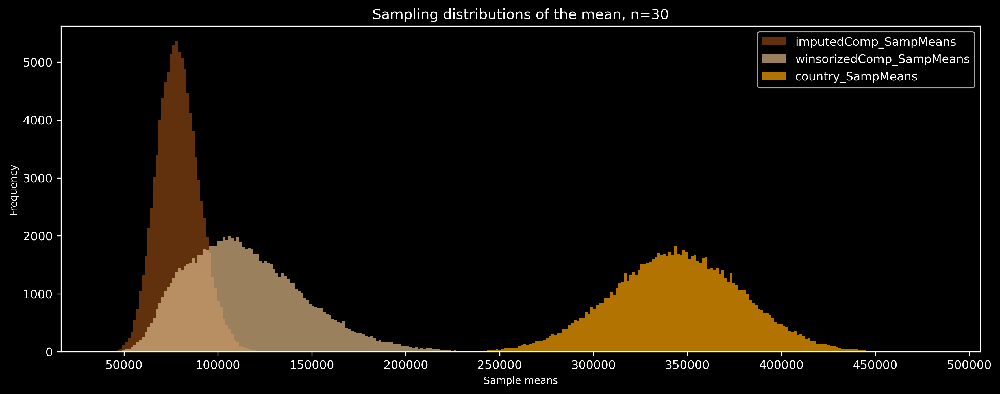

,imputedComp_SampMeans,winsorizedComp_SampMeans,country_SampMeans
skew,0.25,0.67,-0.03
kurtosis,0.05,0.47,-0.02


In [3012]:
plot(means30, title='Sampling distributions of the mean, n=30', xlabel='Sample means', 
     ylabel='Frequency', bins=300, figsize=(14,5))
means30.agg(['skew', 'kurtosis'])

In [2649]:
degrees_of_freedom = 29
dist_means = means30
dist_SE = SEs30
alpha = 0.05
critical_t_value = scipy.stats.t.ppf(q=1-alpha/2, df=degrees_of_freedom) 
print(f"The critical t-value for a {(1-alpha)*100}% confidence level and {degrees_of_freedom} degrees of freedom is: {round(critical_t_value,3)}")

MOE = pd.DataFrame()
MOE['imputedMeans_MOE'] = critical_t_value*dist_SE.imputedComp_SEestim
MOE['winsorizedMeans_MOE'] = critical_t_value*dist_SE.winsorizedComp_SEestim
MOE['country_MOE'] = critical_t_value*dist_SE.country_SEestim

imputedMeans_lower_bound = dist_means.iloc[:,0] - MOE.iloc[:,0]
imputedMeans_upper_bound = dist_means.iloc[:,0] + MOE.iloc[:,0]
imputedMeans_lower_bound.name = 'imp_lower_bound'
imputedMeans_upper_bound.name = 'imp_upper_bound'

winsorizedMeans_lower_bound = dist_means.iloc[:,1] - MOE.iloc[:,1]
winsorizedMeans_upper_bound = dist_means.iloc[:,1] + MOE.iloc[:,1]
winsorizedMeans_lower_bound.name = 'wins_lower_bound'
winsorizedMeans_upper_bound.name = 'wins_upper_bound'

countryMeans_lower_bound = dist_means.iloc[:,2] - MOE.iloc[:,2]
countryMeans_upper_bound = dist_means.iloc[:,2] + MOE.iloc[:,2]
countryMeans_lower_bound.name = 'country_lower_bound'
countryMeans_upper_bound.name = 'country_upper_bound'

CI_df30 = pd.concat([dist_means, imputedMeans_lower_bound, imputedMeans_upper_bound, winsorizedMeans_lower_bound,
                   winsorizedMeans_upper_bound, countryMeans_lower_bound, countryMeans_upper_bound], axis=1)

NumOfSamples = CI_df30.shape[0]
CI_df30

The critical t-value for a 95.0% confidence level and 29 degrees of freedom is: 2.045


,imputedComp_SampMeans,winsorizedComp_SampMeans,country_SampMeans,imp_lower_bound,imp_upper_bound,wins_lower_bound,wins_upper_bound,country_lower_bound,country_upper_bound
0,75321.43,88969.67,400956.67,54647.99,95994.88,65170.94,112768.39,341786.46,460126.88
1,82541.20,67696.83,363586.67,61648.27,103434.13,45905.00,89488.67,291143.96,436029.38
2,59026.93,121289.80,324983.33,42051.10,76002.77,72499.19,170080.41,249443.83,400522.83
...,...,...,...,...,...,...,...,...,...
99997,66964.07,93249.03,343113.33,44077.15,89850.98,29763.71,156734.36,264477.04,421749.62
99998,91844.50,71161.53,354090.00,63197.30,120491.70,45257.14,97065.92,279081.22,429098.78
99999,90917.07,86375.27,368273.33,66903.88,114930.26,39939.59,132810.95,303688.42,432858.24


`imputedComp:`

In [3148]:
Outside_ImpCI = CI_df30.query('~((imp_lower_bound <= @impMean) & (imp_upper_bound >= @impMean))').shape[0]
Inside_ImpCI = CI_df30.query('((imp_lower_bound <= @impMean) & (imp_upper_bound >= @impMean))').shape[0]
imp_Sample_Proportion = Inside_ImpCI/NumOfSamples
alpha_p = 0.01
# Calculate the test statistic
test_stat, pval = proportions_ztest(count=Inside_ImpCI, nobs=NumOfSamples, value=(1-alpha), alternative='two-sided', prop_var=(1-alpha))
critical_value = 2.58

# Calculate the confidence intervals
conf_int = proportion_confint(Inside_ImpCI, NumOfSamples, alpha=alpha_p)

print('imputedComp:\n')
print(f'''The empirical coverage probability: {(imp_Sample_Proportion*100):.2f}%  
99% Confidence interval: [ {(conf_int[0]*100):.2f}%, {(conf_int[1]*100):.2f}% ]\n''')
if abs(test_stat) > critical_value:
    print(f'''There is a significant difference between measured proportion {imp_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5}\n''')
else:
    print(f'''There is no significant difference between measured proportion {imp_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5f}\n''')
print(f'''In {round(CI_df30.query("(@impMean > imp_upper_bound)").shape[0]/Outside_ImpCI*100,2)} % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.\n''')

imputedComp:

The empirical coverage probability: 93.53%  
99% Confidence interval: [ 93.33%, 93.73% ]

There is a significant difference between measured proportion 0.935 and expected 0.95.  
Test statistic: -21.271

In 84.38 % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.



`winsorizedComp:`

In [3149]:
Outside_WinsCI = CI_df30.query('~((wins_lower_bound <= @winsMean) & (wins_upper_bound >= @winsMean))').shape[0]
Inside_WinsCI = CI_df30.query('((wins_lower_bound <= @winsMean) & (wins_upper_bound >= @winsMean))').shape[0]
wins_Sample_Proportion = Inside_WinsCI/NumOfSamples
alpha_p = 0.01
# Calculate the test statistic
test_stat, pval = proportions_ztest(count=Inside_WinsCI, nobs=NumOfSamples, value=(1-alpha), alternative='two-sided', prop_var=(1-alpha))
critical_value = 2.58
# Calculate the confidence intervals
conf_int = proportion_confint(Inside_WinsCI, NumOfSamples, alpha=alpha_p)

print('winsorizedComp:\n')
print(f'''The empirical coverage probability: {(wins_Sample_Proportion*100):.2f}%  
99% Confidence interval: [ {(conf_int[0]*100):.2f}%, {(conf_int[1]*100):.2f}% ]\n''')
if abs(test_stat) > critical_value:
    print(f'''There is a significant difference between measured proportion {wins_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5}\n''')
else:
    print(f'''There is no significant difference between measured proportion {wins_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5f}\n''')
print(f'''In {round(CI_df30.query("(@winsMean > wins_upper_bound)").shape[0]/Outside_WinsCI*100,2)} % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.\n''')

winsorizedComp:

The empirical coverage probability: 81.60%  
99% Confidence interval: [ 81.29%, 81.92% ]

There is a significant difference between measured proportion 0.816 and expected 0.95.  
Test statistic: -194.41

In 99.12 % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.



`country:`

In [3150]:
Outside_CountryCI = CI_df30.query('~((country_lower_bound <= @countryMean) & (country_upper_bound >= @countryMean))').shape[0]
Inside_CountryCI = CI_df30.query('((country_lower_bound <= @countryMean) & (country_upper_bound >= @countryMean))').shape[0]
country_Sample_Proportion = Inside_CountryCI/NumOfSamples
alpha_p = 0.01
# Calculate the test statistic
test_stat, pval = proportions_ztest(count=Inside_CountryCI, nobs=NumOfSamples, value=(1-alpha), alternative='two-sided', prop_var=(1-alpha))
critical_value = 2.58
# Calculate the confidence intervals
conf_int = proportion_confint(Inside_CountryCI, NumOfSamples, alpha=0.01)

print('country:\n')
print(f'''The empirical coverage probability: {(country_Sample_Proportion*100):.2f}%  
99% Confidence interval: [ {(conf_int[0]*100):.2f}%, {(conf_int[1]*100):.2f}% ]\n''')
if abs(test_stat) > critical_value:
    print(f'''There is a significant difference between measured proportion {country_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5}\n''')
else:
    print(f'''There is no significant difference between measured proportion {country_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5f}\n''')
print(f'''In {round(CI_df30.query("(@countryMean > country_upper_bound)").shape[0]/Outside_CountryCI*100,2)} % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.\n''')

country:

The empirical coverage probability: 94.88%  
99% Confidence interval: [ 94.70%, 95.06% ]

There is no significant difference between measured proportion 0.949 and expected 0.95.  
Test statistic: -1.72663

In 43.82 % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.



As the sampling distributions become more similar to a normal distribution, the probability of obtaining a confidence interval that contains the true population parameter approaches the confidence level. The difference between the observed and expected proportion in the 'country' variable is no longer statistically significant. For the remaining two variables it is reduced, although in the case of winsorizedComp still very substantial. Additionally, the positions of confidence intervals that do not include the population mean, relative to the parameter, are becoming slightly more balanced.

Visual representation of a section of sample means and corresponding confidence intervals.

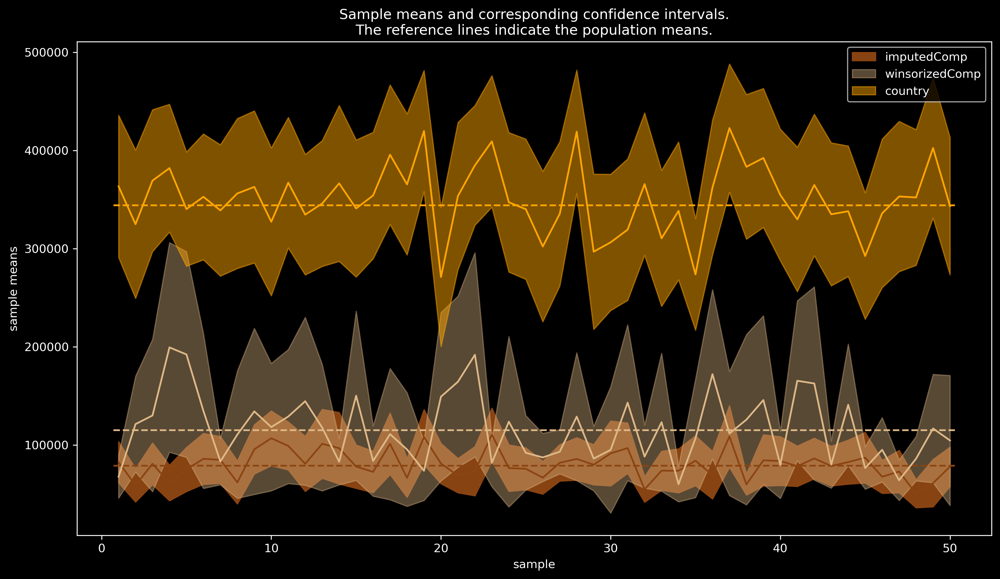

In [3161]:
range_start = 1
range_stop = 50

fig, ax = plt.subplots(figsize=(12,7))

# Subplot imputedComp
sns.lineplot(data=CI_df30.loc[range_start:range_stop], 
             x=CI_df30.loc[range_start:range_stop,'imputedComp_SampMeans'].index, 
             y='imputedComp_SampMeans', 
             color=colors[0], 
             ax=ax)
ax.fill_between(x=range(range_start, range_stop+1), 
                y1=CI_df30.loc[range_start:range_stop,'imp_lower_bound'], 
                y2=CI_df30.loc[range_start:range_stop,'imp_upper_bound'], 
                alpha=0.99,
                label='imputedComp',
                color=colors[0])
ax.axhline(y=df.imputedComp.mean(), 
           xmin=0.04, 
           xmax=0.96, 
           color=colors[0], 
           linestyle='--')
ax.set_ylabel('imputedComp')

# Subplot winsorizedComp
sns.lineplot(data=CI_df30.loc[range_start:range_stop], 
             x=CI_df30.loc[range_start:range_stop,'winsorizedComp_SampMeans'].index, 
             y='winsorizedComp_SampMeans',
             color=colors[1],
             ax=ax)
ax.fill_between(x=range(range_start, range_stop+1), 
                y1=CI_df30.loc[range_start:range_stop,'wins_lower_bound'], 
                y2=CI_df30.loc[range_start:range_stop,'wins_upper_bound'],
                color=colors[1],
                label='winsorizedComp',
                alpha=0.4)
ax.axhline(y=df.winsorizedComp.mean(), 
           xmin=0.04, 
           xmax=0.96, 
           color=colors[1], 
           linestyle='--')

ax.set_ylabel('winsorizedComp')

# Subplot country
sns.lineplot(data=CI_df30.loc[range_start:range_stop], 
             x=CI_df30.loc[range_start:range_stop,'country_SampMeans'].index, 
             y='country_SampMeans', 
             color=colors[2],
             ax=ax)
ax.fill_between(x=range(range_start, range_stop+1), 
                y1=CI_df30.loc[range_start:range_stop,'country_lower_bound'], 
                y2=CI_df30.loc[range_start:range_stop,'country_upper_bound'], 
                color=colors[2],
                label='country',
                alpha=0.5)
ax.axhline(y=df.country.mean(), 
           xmin=0.04, 
           xmax=0.96, 
           color=colors[2], 
           linestyle='--')
ax.set_ylabel('country')

ax.legend()
ax.set_xlabel('sample')
ax.set_ylabel('sample means')
ax.set_title('''Sample means and corresponding confidence intervals.
The reference lines indicate the population means.''')
plt.tight_layout()


The overall trends are similar to those of smaller samples. However, with a sample size of 30, we can observe a more significant distinction between the sample means of the winsorizedComp and country variables due to lower variability of sample means and standard errors as well as smaller values of SE.

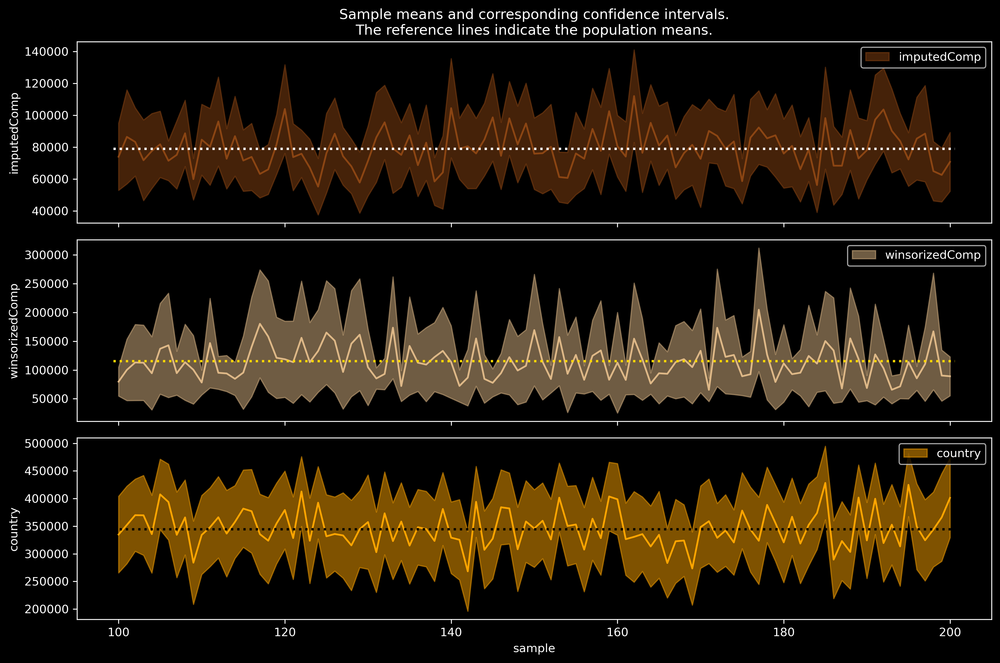

In [3162]:
range_start = 100
range_stop = 200

fig, axs = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(12, 8))

# imputedCompensation
sns.lineplot(data=CI_df30.loc[range_start:range_stop], 
             x=CI_df30.loc[range_start:range_stop,'imputedComp_SampMeans'].index, 
             color=colors[0],  
             y='imputedComp_SampMeans', 
             ax=axs[0])
axs[0].fill_between(x=range(range_start, range_stop+1), 
                    y1=CI_df30.loc[range_start:range_stop,'imp_lower_bound'], 
                    y2=CI_df30.loc[range_start:range_stop,'imp_upper_bound'], 
                    color=colors[0],
                    label='imputedComp',
                    alpha=0.5)
axs[0].axhline(y=df.imputedComp.mean(), 
               xmin=0.04, xmax=0.96, 
               color='white', 
               linewidth=2, 
               linestyle=':')
axs[0].set_title('''Sample means and corresponding confidence intervals.
The reference lines indicate the population means.''')
axs[0].set_ylabel('imputedComp')
axs[0].legend()

# winsorizedCompensation
sns.lineplot(data=CI_df30.loc[range_start:range_stop], 
             x=CI_df30.loc[range_start:range_stop,'winsorizedComp_SampMeans'].index, 
             y='winsorizedComp_SampMeans', 
             color=colors[1], ax=axs[1])
axs[1].fill_between(x=range(range_start, range_stop+1), 
                    y1=CI_df30.loc[range_start:range_stop,'wins_lower_bound'], 
                    y2=CI_df30.loc[range_start:range_stop,'wins_upper_bound'], 
                    color=colors[1],
                    label='winsorizedComp',
                    alpha=0.5)
axs[1].axhline(y=df.winsorizedComp.mean(), 
               xmin=0.04, 
               xmax=0.96, 
               color='gold', 
               linewidth=2, 
               linestyle=':')
axs[1].set_ylabel('winsorizedComp')
axs[1].legend()


# country
sns.lineplot(data=CI_df30.loc[range_start:range_stop], 
             x=CI_df30.loc[range_start:range_stop,'country_SampMeans'].index,
             y='country_SampMeans', 
             color=colors[2], 
             ax=axs[2])
axs[2].fill_between(x=range(range_start, range_stop+1), 
                    y1=CI_df30.loc[range_start:range_stop,'country_lower_bound'], 
                    y2=CI_df30.loc[range_start:range_stop,'country_upper_bound'], 
                    color=colors[2],
                    label='country',
                    alpha=0.5)
axs[2].axhline(y=df.country.mean(), 
               xmin=0.04, 
               xmax=0.96, 
               color='black', 
               linewidth=2, 
               linestyle=':')
axs[2].set_xlabel('sample')
axs[2].set_ylabel('country')
axs[2].legend()
plt.tight_layout()


Compared to smaller sample sizes, larger samples reduce the variability of sample means and increase the precision of estimations. Moreover, the confidence intervals that do not include the population mean are more balanced.

#### Understanding confidence intervals - sample size of 200.

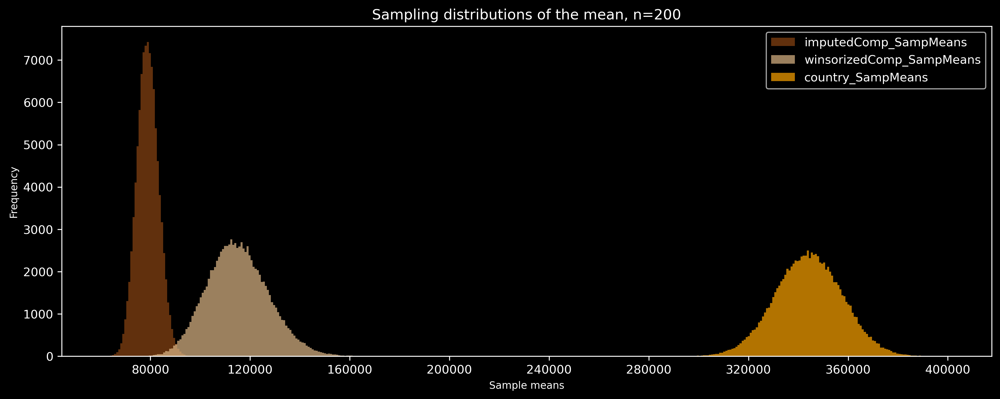

,imputedComp_SampMeans,winsorizedComp_SampMeans,country_SampMeans
skew,0.11,0.26,-0.01
kurtosis,-0.01,0.09,-0.01


In [3013]:
plot(means200, title='Sampling distributions of the mean, n=200', xlabel='Sample means', 
     ylabel='Frequency', bins=415, figsize=(14,5))
means200.agg(['skew', 'kurtosis'])

In [2673]:
degrees_of_freedom = 199
dist_means = means200
dist_SE = SEs200
alpha = 0.05
critical_t_value = scipy.stats.t.ppf(q=1-alpha/2, df=degrees_of_freedom) 
print(f"The critical t-value for a {(1-alpha)*100}% confidence level and {degrees_of_freedom} degrees of freedom is: {round(critical_t_value,3)}")

MOE = pd.DataFrame()
MOE['imputedMeans_MOE'] = critical_t_value*dist_SE.imputedComp_SEestim
MOE['winsorizedMeans_MOE'] = critical_t_value*dist_SE.winsorizedComp_SEestim
MOE['country_MOE'] = critical_t_value*dist_SE.country_SEestim

imputedMeans_lower_bound = dist_means.iloc[:,0] - MOE.iloc[:,0]
imputedMeans_upper_bound = dist_means.iloc[:,0] + MOE.iloc[:,0]
imputedMeans_lower_bound.name = 'imp_lower_bound'
imputedMeans_upper_bound.name = 'imp_upper_bound'

winsorizedMeans_lower_bound = dist_means.iloc[:,1] - MOE.iloc[:,1]
winsorizedMeans_upper_bound = dist_means.iloc[:,1] + MOE.iloc[:,1]
winsorizedMeans_lower_bound.name = 'wins_lower_bound'
winsorizedMeans_upper_bound.name = 'wins_upper_bound'

countryMeans_lower_bound = dist_means.iloc[:,2] - MOE.iloc[:,2]
countryMeans_upper_bound = dist_means.iloc[:,2] + MOE.iloc[:,2]
countryMeans_lower_bound.name = 'country_lower_bound'
countryMeans_upper_bound.name = 'country_upper_bound'

CI_df200 = pd.concat([dist_means, imputedMeans_lower_bound, imputedMeans_upper_bound, winsorizedMeans_lower_bound,
                   winsorizedMeans_upper_bound, countryMeans_lower_bound, countryMeans_upper_bound], axis=1)
CI_df200

The critical t-value for a 95.0% confidence level and 199 degrees of freedom is: 1.972


,imputedComp_SampMeans,winsorizedComp_SampMeans,country_SampMeans,imp_lower_bound,imp_upper_bound,wins_lower_bound,wins_upper_bound,country_lower_bound,country_upper_bound
0,82437.49,110177.91,346727.00,72851.54,92023.44,89392.37,130963.45,319479.96,373974.04
1,75392.96,120789.46,331538.50,67059.93,83725.99,96634.36,144944.56,305059.94,358017.06
2,76512.54,134038.42,356680.00,68422.31,84602.78,105672.08,162404.77,330440.49,382919.51
...,...,...,...,...,...,...,...,...,...
99997,85690.38,112078.39,337218.00,77410.10,93970.65,87257.53,136899.25,311530.55,362905.45
99998,87285.84,103977.79,346098.00,78165.31,96406.36,83572.83,124382.75,319077.31,373118.69
99999,86745.27,116340.12,336052.50,77050.46,96440.09,91604.16,141076.08,310214.57,361890.43


`imputedComp:`

In [3151]:
Outside_ImpCI = CI_df200.query('~((imp_lower_bound <= @impMean) & (imp_upper_bound >= @impMean))').shape[0]
Inside_ImpCI = CI_df200.query('((imp_lower_bound <= @impMean) & (imp_upper_bound >= @impMean))').shape[0]
imp_Sample_Proportion = Inside_ImpCI/NumOfSamples
alpha_p = 0.01
# Calculate the test statistic
test_stat, pval = proportions_ztest(count=Inside_ImpCI, nobs=NumOfSamples, value=(1-alpha), alternative='two-sided', prop_var=(1-alpha))
critical_value = 2.58

# Calculate the confidence intervals
conf_int = proportion_confint(Inside_ImpCI, NumOfSamples, alpha=alpha_p)

print('imputedComp:\n')
print(f'''The empirical coverage probability: {(imp_Sample_Proportion*100):.2f}%  
99% Confidence interval: [ {(conf_int[0]*100):.2f}%, {(conf_int[1]*100):.2f}% ]\n''')
if abs(test_stat) > critical_value:
    print(f'''There is a significant difference between measured proportion {imp_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5}\n''')
else:
    print(f'''There is no significant difference between measured proportion {imp_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5f}\n''')
print(f'''In {round(CI_df200.query("(@impMean > imp_upper_bound)").shape[0]/Outside_ImpCI*100,2)} % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.\n''')

imputedComp:

The empirical coverage probability: 94.84%  
99% Confidence interval: [ 94.66%, 95.02% ]

There is no significant difference between measured proportion 0.948 and expected 0.95.  
Test statistic: -2.35054

In 65.54 % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.



`winsorizedComp:`

In [3153]:
Outside_WinsCI = CI_df200.query('~((wins_lower_bound <= @winsMean) & (wins_upper_bound >= @winsMean))').shape[0]
Inside_WinsCI = CI_df200.query('((wins_lower_bound <= @winsMean) & (wins_upper_bound >= @winsMean))').shape[0]
wins_Sample_Proportion = Inside_WinsCI/NumOfSamples
alpha_p = 0.01
# Calculate the test statistic
test_stat, pval = proportions_ztest(count=Inside_WinsCI, nobs=NumOfSamples, value=(1-alpha), alternative='two-sided', prop_var=(1-alpha))
critical_value = 2.58
# Calculate the confidence intervals
conf_int = proportion_confint(Inside_WinsCI, NumOfSamples, alpha=alpha_p)

print('winsorizedComp:\n')
print(f'''The empirical coverage probability: {(wins_Sample_Proportion*100):.2f}%  
99% Confidence interval: [ {(conf_int[0]*100):.2f}%, {(conf_int[1]*100):.2f}% ]\n''')
if abs(test_stat) > critical_value:
    print(f'''There is a significant difference between measured proportion {wins_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5}\n''')
else:
    print(f'''There is no significant difference between measured proportion {wins_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5f}\n''')
print(f'''In {round(CI_df200.query("(@winsMean > wins_upper_bound)").shape[0]/Outside_WinsCI*100,2)} % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.\n''')

winsorizedComp:

The empirical coverage probability: 93.37%  
99% Confidence interval: [ 93.17%, 93.58% ]

There is a significant difference between measured proportion 0.934 and expected 0.95.  
Test statistic: -23.592

In 85.6 % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.



`country:`

In [3154]:
Outside_CountryCI = CI_df200.query('~((country_lower_bound <= @countryMean) & (country_upper_bound >= @countryMean))').shape[0]
Inside_CountryCI = CI_df200.query('((country_lower_bound <= @countryMean) & (country_upper_bound >= @countryMean))').shape[0]
country_Sample_Proportion = Inside_CountryCI/NumOfSamples
alpha_p = 0.01
# Calculate the test statistic
test_stat, pval = proportions_ztest(count=Inside_CountryCI, nobs=NumOfSamples, value=(1-alpha), alternative='two-sided', prop_var=(1-alpha))
critical_value = 2.58
# Calculate the confidence intervals
conf_int = proportion_confint(Inside_CountryCI, NumOfSamples, alpha=0.01)

print('country:\n')
print(f'''The empirical coverage probability: {(country_Sample_Proportion*100):.2f}%  
99% Confidence interval: [ {(conf_int[0]*100):.2f}%, {(conf_int[1]*100):.2f}% ]\n''')
if abs(test_stat) > critical_value:
    print(f'''There is a significant difference between measured proportion {country_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5}\n''')
else:
    print(f'''There is no significant difference between measured proportion {country_Sample_Proportion:.3f} and expected {1-alpha}.  
Test statistic: {test_stat:.5f}\n''')
print(f'''In {round(CI_df200.query("(@countryMean > country_upper_bound)").shape[0]/Outside_CountryCI*100,2)} % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.\n''')

country:

The empirical coverage probability: 94.89%  
99% Confidence interval: [ 94.71%, 95.07% ]

There is no significant difference between measured proportion 0.949 and expected 0.95.  
Test statistic: -1.53801

In 47.41 % of cases where the CI does not contain the population mean, 
the mean is above the upper bound of the confidence interval.



The empirical coverage probability is the same as the nominal coverage probability for two out of three variables. However, for winsorizedComp, the confidence intervals are still slightly more permissive, but the difference is significantly reduced when compared to means of smaller sample sizes. The placement of the confidence intervals that do not include the population mean, relative to the parameter, is becoming more balanced, although in the case of winsorizedComp, there is still substantially more instances where the population mean is above the upper bound of the confidence interval.

Visual representation of a section of sample means and corresponding confidence intervals.

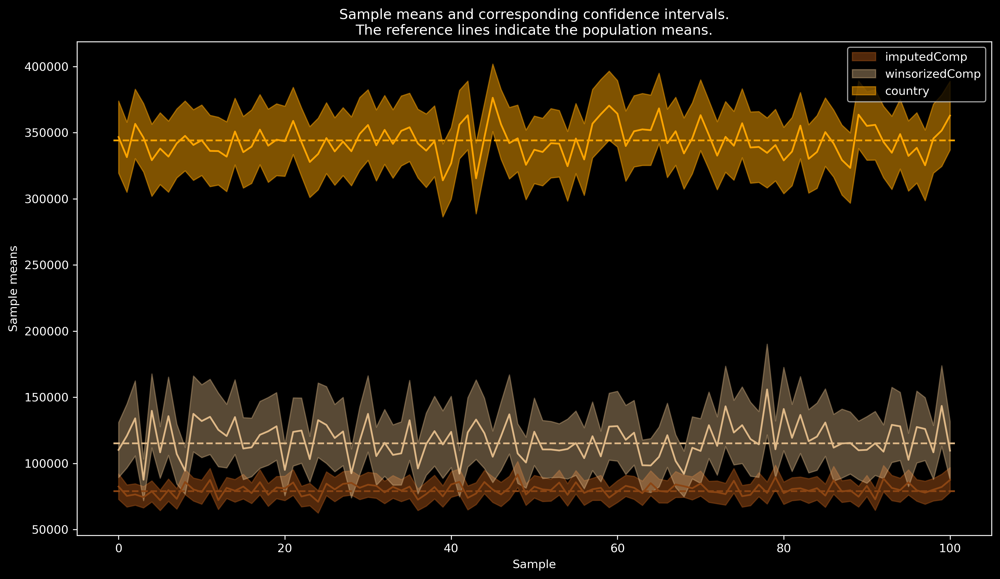

In [3164]:
range_start = 0
range_stop = 100

fig, ax = plt.subplots(figsize=(12,7))

# Subplot imputedComp
sns.lineplot(data=CI_df200.loc[range_start:range_stop], 
             x=CI_df200.loc[range_start:range_stop,'imputedComp_SampMeans'].index, 
             y='imputedComp_SampMeans', 
             color=colors[0], 
             ax=ax)
ax.fill_between(x=range(range_start, range_stop+1), 
                y1=CI_df200.loc[range_start:range_stop,'imp_lower_bound'], 
                y2=CI_df200.loc[range_start:range_stop,'imp_upper_bound'], 
                alpha=0.59,
                label='imputedComp',
                color=colors[0])
ax.axhline(y=df.imputedComp.mean(), 
           xmin=0.04, 
           xmax=0.96, 
           color=colors[0], 
           linestyle='--')
ax.set_ylabel('imputedComp')

# Subplot winsorizedComp
sns.lineplot(data=CI_df200.loc[range_start:range_stop], 
             x=CI_df200.loc[range_start:range_stop,'winsorizedComp_SampMeans'].index, 
             y='winsorizedComp_SampMeans',
             color=colors[1],
             ax=ax)
ax.fill_between(x=range(range_start, range_stop+1), 
                y1=CI_df200.loc[range_start:range_stop,'wins_lower_bound'], 
                y2=CI_df200.loc[range_start:range_stop,'wins_upper_bound'],
                color=colors[1],
                label='winsorizedComp',
                alpha=0.4)
ax.axhline(y=df.winsorizedComp.mean(), 
           xmin=0.04, 
           xmax=0.96, 
           color=colors[1], 
           linestyle='--')

ax.set_ylabel('winsorizedComp')

# Subplot country
sns.lineplot(data=CI_df200.loc[range_start:range_stop], 
             x=CI_df200.loc[range_start:range_stop,'country_SampMeans'].index, 
             y='country_SampMeans', 
             color=colors[2],
             ax=ax)
ax.fill_between(x=range(range_start, range_stop+1), 
                y1=CI_df200.loc[range_start:range_stop,'country_lower_bound'], 
                y2=CI_df200.loc[range_start:range_stop,'country_upper_bound'], 
                color=colors[2],
                label='country',
                alpha=0.5)
ax.axhline(y=df.country.mean(), 
           xmin=0.04, 
           xmax=0.96, 
           color=colors[2], 
           linestyle='--')

ax.legend()
ax.set_xlabel('Sample')
ax.set_ylabel('Sample means')
ax.set_title('''Sample means and corresponding confidence intervals.
The reference lines indicate the population means.''')
plt.tight_layout()


There is a noticeable improvement in the accuracy of estimating population means when larger sample sizes are used, compared to samples of size 10 and 30. We can see a more pronounced difference between the sample means of the imputedComp and winsorizedComp variables. Additionally, the standard error estimates for winsorizedComp show considerably less variability.

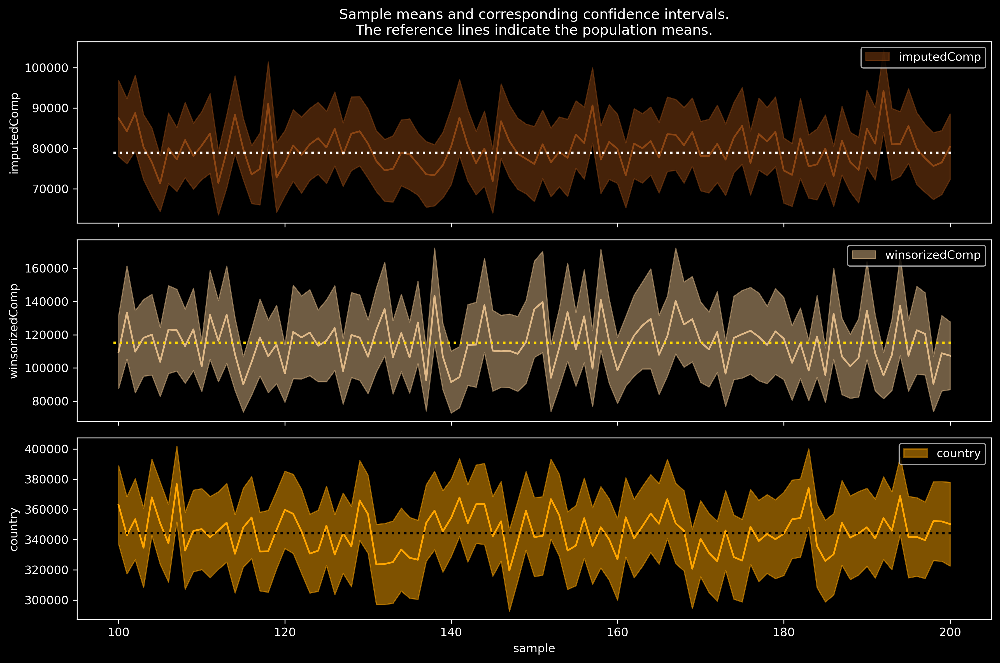

In [3165]:
range_start = 100
range_stop = 200

fig, axs = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(12, 8))

# imputedCompensation
sns.lineplot(data=CI_df200.loc[range_start:range_stop], 
             x=CI_df200.loc[range_start:range_stop,'imputedComp_SampMeans'].index, 
             color=colors[0],  
             y='imputedComp_SampMeans', 
             ax=axs[0])
axs[0].fill_between(x=range(range_start, range_stop+1), 
                    y1=CI_df200.loc[range_start:range_stop,'imp_lower_bound'], 
                    y2=CI_df200.loc[range_start:range_stop,'imp_upper_bound'], 
                    color=colors[0],
                    label='imputedComp',
                    alpha=0.5)
axs[0].axhline(y=df.imputedComp.mean(), 
               xmin=0.04, xmax=0.96, 
               color='white', 
               linewidth=2, 
               linestyle=':')
axs[0].set_title('''Sample means and corresponding confidence intervals.
The reference lines indicate the population means.''')
axs[0].set_ylabel('imputedComp')
axs[0].legend()

# winsorizedCompensation
sns.lineplot(data=CI_df200.loc[range_start:range_stop], 
             x=CI_df200.loc[range_start:range_stop,'winsorizedComp_SampMeans'].index, 
             y='winsorizedComp_SampMeans', 
             color=colors[1], ax=axs[1])
axs[1].fill_between(x=range(range_start, range_stop+1), 
                    y1=CI_df200.loc[range_start:range_stop,'wins_lower_bound'], 
                    y2=CI_df200.loc[range_start:range_stop,'wins_upper_bound'], 
                    color=colors[1],
                    label='winsorizedComp',
                    alpha=0.5)
axs[1].axhline(y=df.winsorizedComp.mean(), 
               xmin=0.04, 
               xmax=0.96, 
               color='gold', 
               linewidth=2, 
               linestyle=':')
axs[1].set_ylabel('winsorizedComp')
axs[1].legend()


# country
sns.lineplot(data=CI_df200.loc[range_start:range_stop], 
             x=CI_df200.loc[range_start:range_stop,'country_SampMeans'].index,
             y='country_SampMeans', 
             color=colors[2], 
             ax=axs[2])
axs[2].fill_between(x=range(range_start, range_stop+1), 
                    y1=CI_df200.loc[range_start:range_stop,'country_lower_bound'], 
                    y2=CI_df200.loc[range_start:range_stop,'country_upper_bound'], 
                    color=colors[2],
                    label='country',
                    alpha=0.5)
axs[2].axhline(y=df.country.mean(), 
               xmin=0.04, 
               xmax=0.96, 
               color='black', 
               linewidth=2, 
               linestyle=':')
axs[2].set_xlabel('sample')
axs[2].set_ylabel('country')
axs[2].legend()
plt.tight_layout()


By increasing the sample size, we were able to achieve greater precision in our estimates and improved convergence between the empirical and nominal coverage probabilities. Additionally, we observed a more even distribution of confidence intervals that exclude the population means.

`In summary` As the sampling distributions become more similar to a normal distribution, the probability of obtaining a confidence interval that contains the true population parameter approaches the confidence level. Skewed populations decrease the coverage of the mean, increase the width of confidence intervals, and shift intervals towards the bulkier part of the distribution. When both skewness and kurtosis are present, the coverage for the mean is even lower, the confidence intervals are larger, and the shift imbalance  of confidence intervals that exclude the population means is even more pronounced.

In the context of hypothesis testing, asymmetrical distributions can increase the likelihood of committing a type I error, resulting in a higher probability of false positives than expected in the long run. This effect is more pronounced with smaller sample sizes. However, in populations with heavy tails, the type I error rate typically falls below the nominal level due to the increased variance caused by outliers. This effect can lead to low statistical power, making it challenging to detect a genuine effect. Therefore, it is essential to consider the distributional characteristics of the population when making statistical inferences. When sample size is insufficient, and normality of the sample distribution cannot be assumed, it is advisable to conduct necessary transformations or to use robust estimators and methods.